In [16]:
expirement_tag = 'HUVEC_1cycleon_off_10mins_exp1'

folders = 'dotted_1cycleonoff_exp/1cycleonoff_nostressafter/' + expirement_tag + '/Analysis/'

intensity_raw_filename = '../data/Guanyu_working/' + folders + expirement_tag + '/intensityraw.mat'
intensity_rel_filename = '../data/Guanyu_working/' + folders + expirement_tag + '/intensityrel.mat'
intensity_full_rel_filename = '../data/Guanyu_working/' + folders + expirement_tag + '/intensityrel_all.mat'
location_filename = '../data/Guanyu_working/' + folders + expirement_tag + '/location.mat'

base_path = './pickle/' + expirement_tag + '_'
base_path_artifacts = './artifacts/' + expirement_tag + "_"

%matplotlib inline

In [39]:
import scipy.io
import numpy as np

intensity_matlab_file = scipy.io.loadmat(intensity_rel_filename)
raw_intensity_matlab_file = scipy.io.loadmat(intensity_raw_filename)
rel_intensity_matlab_file = scipy.io.loadmat(intensity_full_rel_filename)

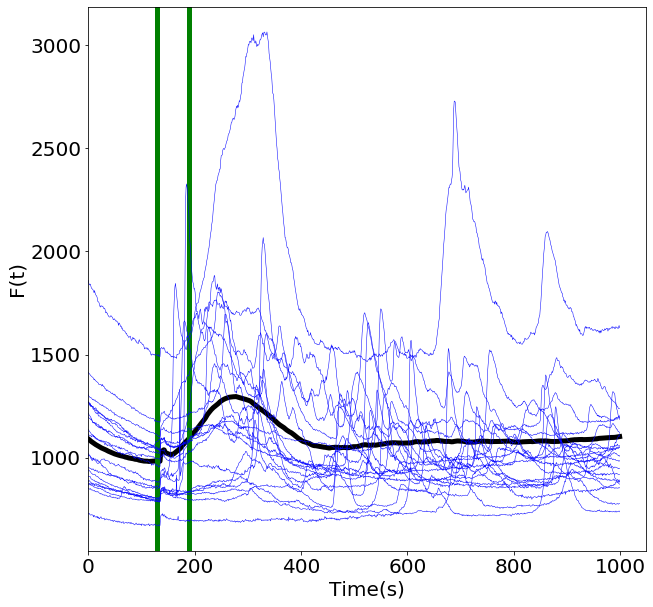

In [62]:
import matplotlib
import matplotlib.pyplot as plt
import peakutils
from peakutils.plot import plot as pplot
import seaborn as sns
import random

plt.rcParams['font.size'] = '20'

fig, ax = plt.subplots(1, 1, sharex=True, figsize=(10,10))

# sample_idxs = random.sample(range(0, len(raw_intensity_matlab_file['intensity'])), 20)

#raw intensity

mean_intensity = np.mean(raw_intensity_matlab_file['intensity'], axis=0)

ax.plot(mean_intensity, color='black', linewidth=5)

ax.axvline(x=130, color='green', linewidth=5)
ax.axvline(x=130+60, color='green', linewidth=5)

for idx in sample_idxs:
    ax.plot(raw_intensity_matlab_file['intensity'][idx], color='blue', linewidth=0.5)

ax.set_xlim(0)
ax.set_ylabel('F(t)')

#r(t) normalized intensity
'''
mean_intensity = np.mean(rel_intensity_matlab_file['intensity'], axis=0)

ax[1].plot(mean_intensity, color='black', linewidth=5)

ax[1].axvline(x=130, color='green', linewidth=5)
ax[1].axvline(x=130+60, color='green', linewidth=5)

for idx in sample_idxs:
    ax[1].plot(rel_intensity_matlab_file['intensity'][idx], color='blue', linewidth=0.5)

ax[1].set_xlim(0)
ax[1].set_ylabel('R(t)')

'''

plt.xlabel('Time(s)')

plt.show()

## Load matlab data

In [6]:
import scipy.io
import numpy as np

intensity_matlab_file = scipy.io.loadmat(intensity_rel_filename)

In [7]:
def plot_4_diffrent_response_curve(intensity_matlab_file, base_path_artifacts):
    import matplotlib
    import matplotlib.pyplot as plt

    def plot_intensity(ax, i):
        ax.plot(intensity_matlab_file['intensity'][i])
        ax.set_title('Cell ' + str(i))
        ax.set_xlabel('Time')
        ax.set_ylabel('Calcium Intensity')
    
    fig, axes = plt.subplots(2, 2, sharex=True, sharey=True)
    plot_intensity(axes[0, 0], 0)
    plot_intensity(axes[0, 1], 1)
    plot_intensity(axes[1, 0], 66)
    plot_intensity(axes[1, 1], 67)

    fig.suptitle('Cell Intensity')

    plt.subplots_adjust(hspace = 0.5)
    fig.savefig(base_path_artifacts + '4_diffrent_response_curve.png')
    plt.clf()
    plt.close(fig)

plot_4_diffrent_response_curve(intensity_matlab_file, base_path_artifacts) 

### Preprocessing - Smooth Signals

In [8]:
from module.preprocessing import smooth

cells_intensity = smooth(intensity_matlab_file['intensity'])

print('The shape of the signal\'s data:' + str(cells_intensity.shape))

The shape of the signal's data:(1040, 809)


## Preprocssing - Numerically Differentiated the Response Curve

In [9]:
from module.preprocessing import first_derive_cells_intensity

normalized_cells_response_curve = first_derive_cells_intensity(cells_intensity)

### Mean Response Curve

In [10]:
def calc_mean_response_curve(cells_intensity):
    avg_intensity = np.zeros((cells_intensity.shape[1]))
    
    min_intensity = np.zeros((cells_intensity.shape[1])) + 1
    max_intensity = np.zeros((cells_intensity.shape[1])) - 1

    for cell_idx,cell_intensity in enumerate(cells_intensity):
        avg_intensity += cell_intensity
        #min_intensity = np.minimum(min_intensity, cell_intensity)
        #max_intensity = np.maximum(max_intensity, cell_intensity)    
    
    std_intensity = np.std(cells_intensity, axis=0)    
    avg_intensity = avg_intensity / cells_intensity.shape[0]
    
    return avg_intensity, std_intensity

mean_normalized_cells_response_curve, std_normalized_cells_response_curve = calc_mean_response_curve(normalized_cells_response_curve)

## Find Peaks Analysis

In [11]:
len(mean_normalized_cells_response_curve)

804

In [12]:
base_path_artifacts

'./artifacts/HUVEC_1cycleon_off_10mins_exp2_'

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


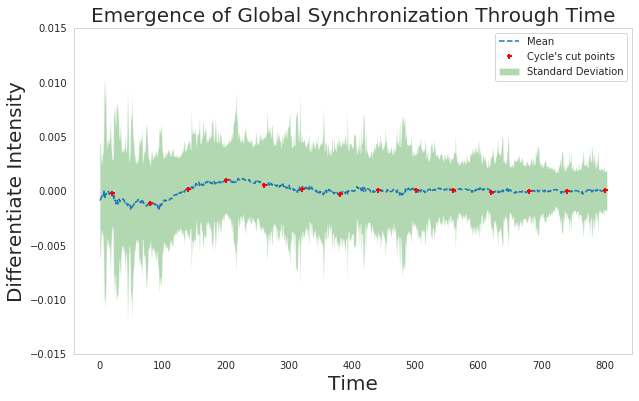

<Figure size 432x288 with 0 Axes>

In [14]:
def plot_peaks_analysis(indexes, mean_normalized_cells_response_curve, std_normalized_cells_response_curve, base_path):
    import matplotlib
    import matplotlib.pyplot as plt
    import peakutils
    from peakutils.plot import plot as pplot
    import seaborn as sns

    sns.set_style("whitegrid", {'axes.grid' : False, 'font_scale': 2})

    x = np.linspace(0, len(mean_normalized_cells_response_curve), len(mean_normalized_cells_response_curve))

    fig, ax = plt.subplots(figsize=(10,6))
    pplot(x, mean_normalized_cells_response_curve, indexes)
    ax.fill_between(x, 
                     y1=mean_normalized_cells_response_curve - std_normalized_cells_response_curve, 
                     y2=mean_normalized_cells_response_curve + std_normalized_cells_response_curve, 
                     facecolor='Green', alpha=0.3)
    ax.set_ylim(-0.015, 0.015)

    plt.legend(['Mean', 'Cycle\'s cut points', 'Standard Deviation'])

    plt.title('Emergence of Global Synchronization Through Time', fontsize=20)
    plt.xlabel('Time', fontsize=20)
    plt.ylabel('Differentiate Intensity', fontsize=20)
    plt.xlim = 0
    #fig.savefig(base_path + 'peaks_analysis.png')
    fig.savefig(base_path + 'peaks_analysis.eps', format='eps')
    plt.show()
    plt.clf()
    plt.close(fig)

indexes = list(range(20, 860, 60))

plot_peaks_analysis(indexes, mean_normalized_cells_response_curve, 

                    std_normalized_cells_response_curve, base_path_artifacts)

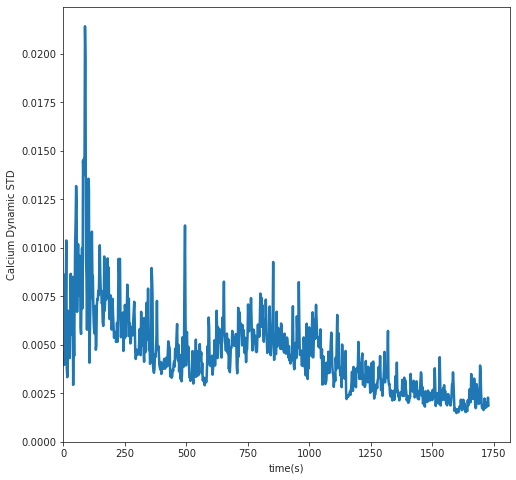

<Figure size 432x288 with 0 Axes>

In [25]:
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("ticks", {'axes.grid' : False, 'font_scale': 2, "xtick.major.size": 20, "ytick.major.size": 20})

fig = plt.figure(figsize=(8,8))

x = np.linspace(0, len(mean_normalized_cells_response_curve), len(mean_normalized_cells_response_curve))

ax = sns.lineplot(y=std_normalized_cells_response_curve, x=x, palette="tab10", linewidth=2.5)

ax.set(xlabel="time(s)", ylabel="Calcium Dynamic STD")

ax.set(ylim=0)
ax.set(xlim=0)

plt.show()

fig.savefig(base_path_artifacts + '_calcium_dynamic_std' + '.eps', format='eps')
fig.savefig(base_path_artifacts + '_calcium_dynamic_std' + '.png')

plt.clf()
plt.close(fig)

## Divide the frames by the peaks

In [10]:
from module.helpers import divide_frames_by_indices

indexes_activation_time = list(range(30, 1000, 60))

cells_response_curve_parts = divide_frames_by_indices(indexes, normalized_cells_response_curve)
cells_response_curve_parts_activiation_time = divide_frames_by_indices(indexes_activation_time, cells_intensity)

activation_time_curve_parts = cells_response_curve_parts_activiation_time

### Validate that the time series is stationary

In [11]:
from module.stathelper import validate_stationary
import warnings

p_value_results_adf, p_value_results_kpss = None, None

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    p_value_results_adf, p_value_results_kpss  = validate_stationary(normalized_cells_response_curve)

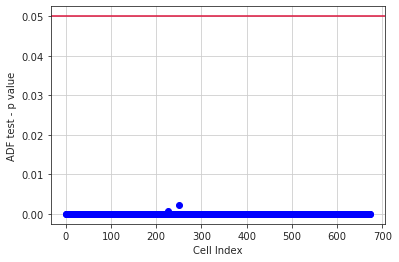

In [12]:
import matplotlib.pyplot as plt

plt.plot(p_value_results_adf, 'bo')

p_line = plt.axhline(0.05, color="crimson")

plt.xlabel('Cell Index')
plt.ylabel('ADF test - p value')
plt.grid(True)

plt.show()

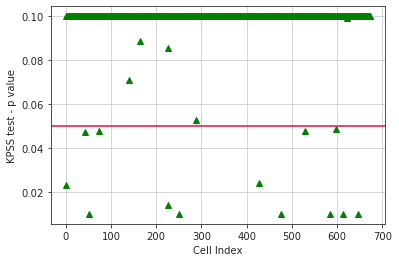

In [13]:
import matplotlib.pyplot as plt

plt.plot(p_value_results_kpss, 'g^')

p_line = plt.axhline(0.05, color="crimson")

plt.xlabel('Cell Index')
plt.ylabel('KPSS test - p value')
plt.grid(True)

plt.show()

### Filter out cells which have non-stationary response curve

In [14]:
kpss_filter = [True if p_value > 0.05 else False for p_value in p_value_results_kpss]
adf_filter = [True if p_value <= 0.05 else False for p_value in p_value_results_adf]

kpss_and_adf_filter = np.logical_and(kpss_filter, adf_filter)

np.sum(kpss_and_adf_filter) / float(len(kpss_and_adf_filter))

0.9807121661721068

## Voronoi diagram

### load centroids data

In [64]:
location_matlab_file = scipy.io.loadmat(location_filename)

centroids = location_matlab_file['centroids']

In [65]:
from scipy.spatial import ConvexHull
from module.topologicalhelper import area_of_rectangle, bounding_box
from module.topologicalhelper import split_to_small_bounding_boxes, filter_edges_in_bb_by_td, in_rect

hull = ConvexHull(centroids)

#print(hull.area)
rect_vert = bounding_box(centroids[hull.vertices])
#print(rect_vert)

#print(split_to_small_bounding_boxes(2, rect_vert))

print(centroids.shape[0])
area = area_of_rectangle(rect_vert[1][0]-rect_vert[0][0], rect_vert[2][1]-rect_vert[1][1])
area = area/(1000**2 * (0.656**2)) #convert to mm
print(1/area)
print(centroids.shape[0]*(1/(area)))

925
The Area of the Rectangle is 1035053.0413868739
0.41576226801226557
384.58009791134566


In [111]:
from scipy.spatial import Voronoi, voronoi_plot_2d
from module.topologicalhelper import voronoi_finite_polygons_2d

vor = Voronoi(centroids)

regions, vertices = voronoi_finite_polygons_2d(vor)

def plot_voronoi(regions, vertices, vor, points):
    
    fig, ax = plt.subplots(figsize=(10, 10))
    
    for region in regions:
        polygon = vertices[region]
        ax.fill(*zip(*polygon), alpha=1, ec='black', fill=False)
    
    #ax.plot(points[:,0], points[:,1], 'ko')
    ax.set_xlim(vor.min_bound[0] - 0.1, vor.max_bound[0] + 0.1)
    ax.set_ylim(vor.min_bound[1] - 0.1, vor.max_bound[1] + 0.1)
    
    fig.savefig(base_path_artifacts + 'voronoi_empty' + '.eps', format='eps')
    fig.savefig(base_path_artifacts + 'voronoi_empty' + '.png')
    #plt.savefig("voronoi.png", dpi=800)
    plt.show()

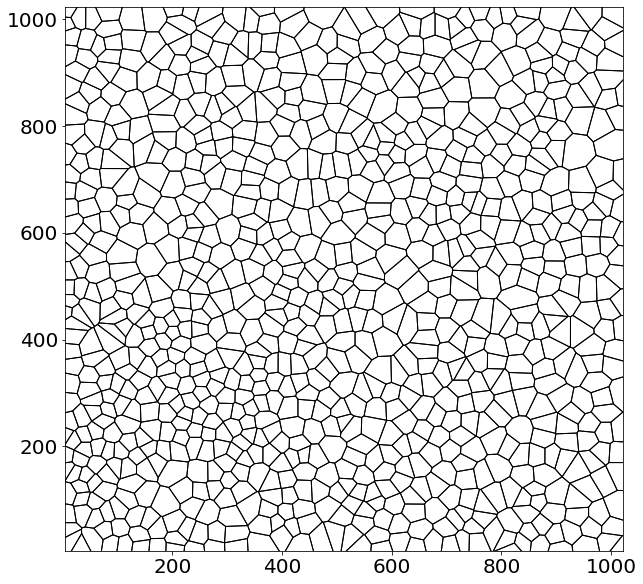

In [112]:
plot_voronoi(regions, vertices, vor, centroids)

## Delaunay triangulation

In [19]:
from scipy.spatial import Delaunay
from module.topologicalhelper import find_neighbors

tri = Delaunay(centroids)

In [20]:
neighbor_indices = find_neighbors(tri, centroids)
#neighbor_indices[0]

## Serialization Stuff

In [21]:
from module.serializationhelper import save_object, load_object

In [22]:
analyze_result_df = load_object(base_path + 'analyze_result_df')

analyze_cell_stats = load_object(base_path + 'analyze_cell_stats')

file is not exist path:./pickle/5-08-Exp2_analyze_cell_stats


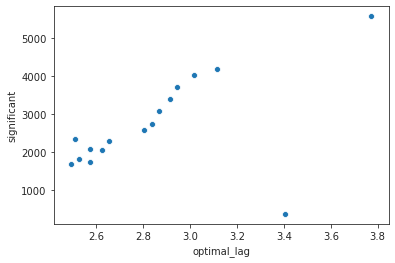

In [23]:
sns.scatterplot(x=analyze_result_df.groupby(['part']).mean().optimal_lag, y=analyze_result_df.groupby(['part']).sum().significant)

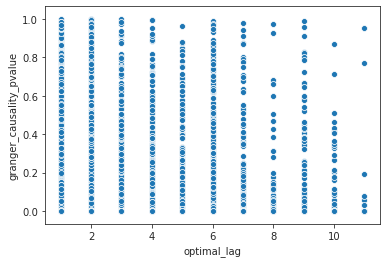

In [24]:
sns.scatterplot(analyze_result_df[analyze_result_df.part == 14.0].optimal_lag, analyze_result_df[analyze_result_df.part == 14.0].granger_causality_pvalue)

In [25]:
from module.stathelper import validate_stationary
import warnings

p_value_results_adf_part, p_value_results_kpss_part = None, None

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    p_value_results_adf_part, p_value_results_kpss_part  = validate_stationary(cells_response_curve_parts[14])

kpss_filter_part = [True if p_value > 0.05 else False for p_value in p_value_results_kpss_part]
adf_filter_part = [True if p_value <= 0.05 else False for p_value in p_value_results_adf_part]

kpss_and_adf_filter_part = np.logical_and(kpss_filter_part, adf_filter_part)

np.sum(kpss_and_adf_filter_part) / float(len(kpss_and_adf_filter_part))

0.13649851632047477

## Analyze GC

In [26]:
import importlib
import modulev2.analyzetools
from modulev2.analyzetools import analyze_network

if analyze_result_df is None:
    analyze_result_df = analyze_network(neighbor_indices, cells_response_curve_parts, kpss_and_adf_filter, 2)
    
    analyze_result_df['total_neighbours'] = analyze_result_df.groupby(['source', 'part'])['destination'].transform(lambda x: x.count())
    analyze_result_df['critical_value'] = 0.05 / analyze_result_df['total_neighbours']
    analyze_result_df['significant'] = analyze_result_df['granger_causality_pvalue'] < analyze_result_df['critical_value']
    analyze_result_df['significant'] = analyze_result_df['significant'].astype(int)
    
    save_object(analyze_result_df, base_path + 'analyze_result_df')

In [27]:
analyze_result_df

,source,destination,part,topological_distance,optimal_lag,granger_causality_mag,granger_causality_pvalue,total_neighbours,critical_value,significant
0,1.0,2.0,0.0,1.0,2.0,-0.270397,7.727845e-04,36.0,0.001389,1
1,1.0,3.0,0.0,1.0,2.0,-0.032793,4.193681e-01,36.0,0.001389,0
2,1.0,36.0,0.0,1.0,6.0,-1.555034,2.207141e-12,36.0,0.001389,1
3,1.0,6.0,0.0,1.0,2.0,-0.191482,6.255608e-03,36.0,0.001389,0
4,1.0,39.0,0.0,1.0,4.0,-0.887405,1.300743e-08,36.0,0.001389,1
...,...,...,...,...,...,...,...,...,...,...
12269,673.0,651.0,15.0,2.0,2.0,-0.161323,1.391128e-02,23.0,0.002174,0
12270,673.0,654.0,15.0,2.0,3.0,-0.082352,2.448839e-01,23.0,0.002174,0
12271,673.0,656.0,15.0,2.0,2.0,-0.003647,9.078754e-01,23.0,0.002174,0
12272,673.0,663.0,15.0,2.0,4.0,-0.187436,6.129889e-02,23.0,0.002174,0


## Figure 3C - This trend of improved synchronization coincided with a gradual increase of the overall information-flow, measured via the mean cells’ edge probability

In [28]:
def divide_frames_by_indices_single_dim(indices, cells_response_curve):
    cells_response_curve_parts = []

    for i in range(0, len(indices) - 1):
        cells_response_curve_parts.append(cells_response_curve[indices[i]:indices[i+1]])
    
    return cells_response_curve_parts

std_normalized_cells_response_curve_parts = divide_frames_by_indices_single_dim(indexes, std_normalized_cells_response_curve)

In [29]:
def plot_scatter_mbar_color(x, y, x_feature_name, y_feature_name, prefix='', 
                            save=False, xlim=None, ylim=None, xlog=False, ylog=False, color_set='Set1', hue=None, hue_name=''):
    import scipy.stats as stats

    sns.set(style='white', font_scale = 2, rc={"lines.linewidth": 3})
    
    df = pd.DataFrame(index=hue, columns=[hue_name, x_feature_name, y_feature_name])
    df[x_feature_name] = x
    df[y_feature_name] = y
    df[hue_name] = hue
    
    if xlog:
        x = np.log(x)
        df['log('+x_feature_name+')'] = np.log(df[x_feature_name])
        x_feature_name = 'log('+x_feature_name+')'
    
    if ylog:
        y = np.log(y)
        df['log('+y_feature_name+')'] = np.log(df[x_feature_name])
        y_feature_name = 'log('+y_feature_name+')'
        
    from matplotlib.colors import ListedColormap
    
    my_color_bar = ListedColormap(sns.color_palette(color_set, len(hue)))

    fig, ax = plt.subplots(figsize=(12,6))
    ax = sns.scatterplot(ax=ax, data=df, x=x_feature_name, y=y_feature_name, hue=hue_name, s=100, palette=my_color_bar)
    
    
    
    if (ylim is not None):
        ax.set(ylim=ylim)
    
    if (xlim is not None):
        ax.set(xlim=xlim)

    ax.set(xlabel=x_feature_name, ylabel=y_feature_name)

    data_correlation = stats.pearsonr(x=x, y=y)

    ax.annotate("n={}, coefficient = {:.4f}, p = {:.4f}".format(len(x),
                data_correlation[0], data_correlation[1]), 
                xy=(.1, .2), xycoords=ax.transAxes, fontsize=11)
    
    #plt.legend(loc="upper left", ncol=len(df.columns), prop={"size":15})
    ax.legend_.remove()
    
    import matplotlib
    
    plt.colorbar(mpl.cm.ScalarMappable(cmap=my_color_bar, norm=matplotlib.colors.Normalize(vmin=0, vmax=11)))
    
    #fig.colorbar(mpl.cm.ScalarMappable(cmap=my_color_bar),
    #         cax=ax, orientation='horizontal', label='Cycles')

    #plt.plot(ticks_range, ticks_range, 'r--')

    plt.tight_layout(pad=0.4, w_pad=2, h_pad=1.0)

    plt.show()
    
    if save:
        fig.savefig(base_path_artifacts + '_' + prefix + '_' + x_feature_name + '_vs_' + y_feature_name + '.eps', format='eps')
        fig.savefig(base_path_artifacts + '_' + prefix + '_' + x_feature_name + '_vs_' + y_feature_name + '.png')
    plt.clf()
    plt.close(fig)

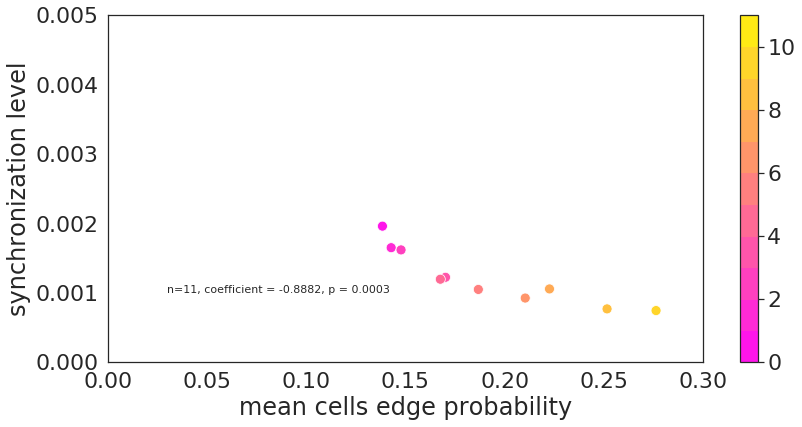

<Figure size 432x288 with 0 Axes>

In [30]:
import seaborn as sns
import pandas as pd
import matplotlib as mpl

plot_scatter_mbar_color(x=np.array(analyze_result_df.groupby(['part'])['significant'].sum()/analyze_result_df.groupby(['part'])['significant'].count())[1:12],
                       y=np.mean(std_normalized_cells_response_curve_parts, axis=1)[1:12],
                       x_feature_name='mean cells edge probability',
                       y_feature_name='synchronization level',
                       save=True, 
                       hue=(analyze_result_df.groupby(['part'])['significant'].sum()/analyze_result_df.groupby(['part'])['significant'].count()).index[1:12],
                       hue_name='Cycle',
                       ylim=[0, 0.005],
                       xlim=[0,0.3],
                       color_set='spring')

In [31]:
from scipy.stats import pearsonr
import seaborn as sns

def corrfunc(x,y, ax=None, **kws):
    """Plot the correlation coefficient in the top left hand corner of a plot."""
    r, _ = pearsonr(x, y)
    ax = ax or plt.gca()
    # Unicode for lowercase rho (ρ)
    rho = '\u03C1'
    ax.annotate(f'{rho} = {r:.2f}', xy=(.01, .9), xycoords=ax.transAxes)

In [32]:
import pandas as pd

from bisect import bisect_left

def find_activation(cells_intensity, threshold):
    from scipy.signal import find_peaks
    violations = 0
    
    intensity_activation_frame = np.zeros((cells_intensity.shape[0]))
    for i in range(cells_intensity.shape[0]):
        min_value = np.min(cells_intensity[i])
        max_value = np.max(cells_intensity[i])
        cell_value_threshold = cells_intensity[i][0] + threshold*(max_value-cells_intensity[i][0])
        
        activation_time_arrival = [idx for idx,value in enumerate(cells_intensity[i]) if value>cell_value_threshold]
        
        if len(activation_time_arrival) < 1:
            violations += 1
            intensity_activation_frame[i] = 0
        else:
            intensity_activation_frame[i] = activation_time_arrival[0]
            
    return intensity_activation_frame, violations

def calc_activation_time_for_parts(activation_time_curve_parts, number_of_parts, threshold):
    violations = {}
    activation_time_scores = {}
    for part in range(0, number_of_parts):
        activation_time_scores[part], violations[part] = find_activation(activation_time_curve_parts[part], threshold=threshold)
    
    print(violations)
    
    return activation_time_scores

def perm_test_feature_cycles(analyze_cell_stats,
                             kpss_and_adf_filter,
                             score_funcs_dict):
    
    number_of_parts = len(analyze_cell_stats.columns.levels[1])
    
    #minus one since it compare part i with part i+1
    perm_test = pd.DataFrame(columns=range(0, number_of_parts))
    cc_score = pd.DataFrame(columns=range(0, number_of_parts))
    
    for score_name, score_funcs in score_funcs_dict.items():        
        score_for_parts_x = score_funcs[0](analyze_cell_stats)
        score_for_parts_y = score_funcs[1](analyze_cell_stats)

        perm_test_leader_scores = {}
        parts_cc_scores = {}

        for part in range(0, number_of_parts):
            xs = score_for_parts_x[part]
            ys = score_for_parts_y[part]        

            xs = apply_custom_filter(xs, kpss_and_adf_filter)
            ys = apply_custom_filter(ys, kpss_and_adf_filter)

            perm_test_leader_scores[part] = exact_mc_perm_test(xs, ys, pearsonr, 1000, None)     

            parts_cc_scores[part] = pearsonr(xs, ys)[0]

        perm_test.loc[score_name] = perm_test_leader_scores
        cc_score.loc[score_name] = parts_cc_scores
    
    return perm_test, cc_score

In [33]:
from scipy.stats import pearsonr
import numpy as np

def exact_mc_perm_test(xs, ys, operator, nmc, custom_filter):
    if custom_filter is not None:
        xs = xs[custom_filter]
        ys = ys[custom_filter]
    
    n, k = len(xs), 0.0
    diff = np.abs(operator(xs, ys)[0])
    zs = np.concatenate([xs, ys])
    for j in range(nmc):
        np.random.shuffle(zs)
        k += diff <= np.abs(operator(zs[:n],zs[n:])[0])
    return k / float(nmc)

def gc_out_score_func(analyze_cell_stats):
    return analyze_cell_stats['gc_out']

def gc_in_score_func(analyze_cell_stats):
    return analyze_cell_stats['gc_in']

def centrality_score_func(analyze_cell_stats):
    return analyze_cell_stats['gc_out'] - analyze_cell_stats['gc_in']

def activation_time_score_func(analyze_cell_stats):
    return analyze_cell_stats['activation_time']

def perm_test_seq_cycles(analyze_cell_stats,
                         kpss_and_adf_filter,
                         score_func_dict, 
                         step):
    
    number_of_parts = len(analyze_cell_stats.columns.levels[1])
    
    #minus one since it compare part i with part i+1
    perm_test = pd.DataFrame(columns=range(0, number_of_parts - step))
    cc_score = pd.DataFrame(columns=range(0, number_of_parts - step))
    
    for score_name, score_func in score_func_dict.items():        
        score_for_parts = score_func(analyze_cell_stats)

        perm_test_leader_scores = {}
        parts_cc_scores = {}

        for part in range(0, number_of_parts - step):
            xs = score_for_parts[part]
            ys = score_for_parts[part + step]

            xs = apply_custom_filter(xs, kpss_and_adf_filter)
            ys = apply_custom_filter(ys, kpss_and_adf_filter)

            perm_test_leader_scores[part] = exact_mc_perm_test(xs, ys, pearsonr, 1000, None)     

            parts_cc_scores[part] = pearsonr(xs, ys)[0]

        perm_test.loc[score_name] = perm_test_leader_scores
        cc_score.loc[score_name] = parts_cc_scores
    
    return perm_test, cc_score

def sample_perm_seq_cycles(analyze_cell_stats,
                           score_func_dict,
                           step):
    number_of_parts = len(analyze_cell_stats.columns.levels[1])
    
    #minus one since it compare part i with part i+1
    cc_score = pd.DataFrame(columns=range(0, number_of_parts - step))
    
    for score_name, score_func in score_func_dict.items():        
        score_for_parts = score_func(analyze_cell_stats)

        parts_cc_scores = {}

        for part in range(0, number_of_parts - step):
            n = len(score_for_parts[part])
            np.random.seed(2)
            zs = np.concatenate([score_for_parts[part], score_for_parts[part + step]])
            np.random.shuffle(zs)
            
            xs = zs[:n]
            ys = zs[n:]

            parts_cc_scores[part] = pearsonr(xs, ys)[0]

        cc_score.loc[score_name] = parts_cc_scores
    
    return cc_score
    

In [34]:
def plot_cell_maintain_memory_of_communication_functional_activation_time(base_path_artifacts, analyze_cell_stats, threshold):
    from plots_analyzetools import color_not_significant_red
    
    steps_df = None
    sample_df = None
    
    for step_corr in range(1, 2, 1):            
        gc_sign_perm_test, gc_sign_cc_score = perm_test_seq_cycles(analyze_cell_stats, None, #already filtered
                                                               {'activation_time': activation_time_score_func},
                                                                step_corr)

        fig, ax = plt.subplots(figsize=(20,6))
        sns.heatmap(gc_sign_perm_test, annot=True, linewidths=.2, cmap = sns.cm.rocket_r)
        fig.savefig(base_path_artifacts + 'activation_time_' + 'threshold_' + str(threshold) + '_cell_maintain_memory_of_communication_functional_perm_test_' + str(step_corr) + '.png')
        fig.savefig(base_path_artifacts + 'activation_time_' + 'threshold_' + str(threshold) + '_cell_maintain_memory_of_communication_functional_perm_test_' + str(step_corr) + '.eps', format='eps')
        plt.show()
        plt.clf()
        plt.close(fig)

        #prepeare data strcuture 
        gc_sign_cc_score_tranpose = gc_sign_cc_score.transpose()[:12][['activation_time']].stack().to_frame(name='vals')
        gc_sign_cc_score_tranpose['Functional'] = gc_sign_cc_score_tranpose.index.get_level_values(1) + ' s:' + str(step_corr) 
        
        if steps_df is None:
            steps_df = gc_sign_cc_score_tranpose
        else:
            steps_df = pd.concat([steps_df, gc_sign_cc_score_tranpose])
        
        # calculate sample cell organization
        sample_cc_score = sample_perm_seq_cycles(analyze_cell_stats,
                                {'activation_time': activation_time_score_func},
                                  step_corr)
        
        #prepare sample data strcuture
        sample_cc_score_tranpose = sample_cc_score.transpose()[:12][['activation_time']].rename(columns={'activation_time':'Sample activation_time'}).stack().to_frame(name='vals')
        sample_cc_score_tranpose['Functional'] = sample_cc_score_tranpose.index.get_level_values(1) + ' s:' + str(step_corr) 
        
        if sample_df is None:
            sample_df = sample_cc_score_tranpose
        else:
            sample_df = pd.concat([sample_df, sample_cc_score_tranpose])
    
    
    
    sns.set(style='white', font_scale = 2, rc={"lines.linewidth": 3})
    #sns.set_palette("terrain")

    fig, ax = plt.subplots(figsize=(24,12))
    
    sns.pointplot(ax=ax, y='vals', x=steps_df.index.get_level_values(0), data=steps_df, hue='Functional', legend=True)
    sns.pointplot(ax=ax, y='vals', x=sample_df.index.get_level_values(0), data=sample_df, hue='Functional', legend=True, linestyles=["--", "--"])
    #ax.text(7, 0.1,'P-value=[0, 0.019]', fontsize=20) #add text
    ax.set(xticks=range(0, 12))
    ax.set_xlim([0, 11])
    ax.set_ylim(-0.15, 0.15)
    #ax.set(xlabel='correlation between cycles', ylabel='level')
    ax.set_title('activation_time threshold: ' + str(threshold))
    
    fig.savefig(base_path_artifacts + 'activation_time_' + 'threshold_' + str(threshold) + '_memory' + str(step_corr) + '.png')
    fig.savefig(base_path_artifacts + 'activation_time_' + 'threshold_' + str(threshold) + '_memory' + str(step_corr) + '.eps', format='eps')
    plt.show()
    plt.clf()
    plt.close(fig)

{0: 8, 1: 65, 2: 41, 3: 43, 4: 48, 5: 40, 6: 26, 7: 93, 8: 114, 9: 169, 10: 164, 11: 130, 12: 85, 13: 79, 14: 100, 15: 93}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


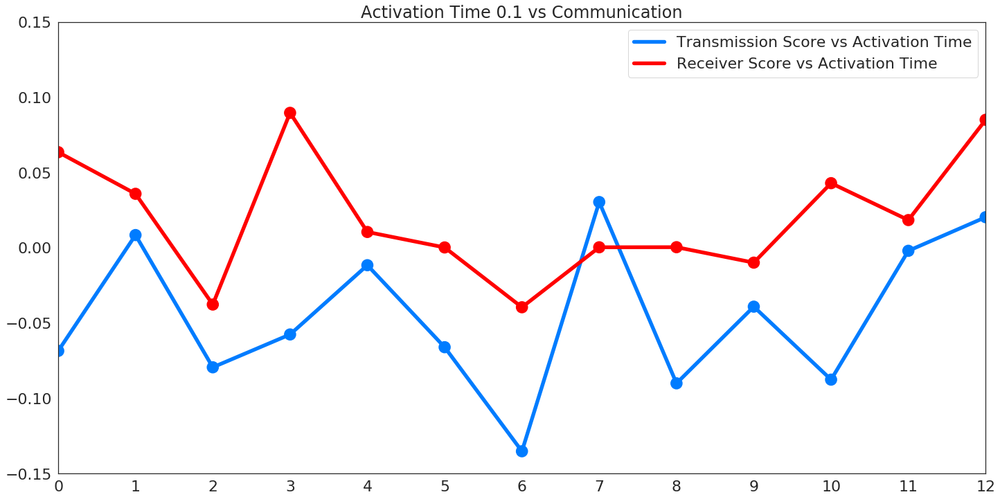

<Figure size 432x288 with 0 Axes>

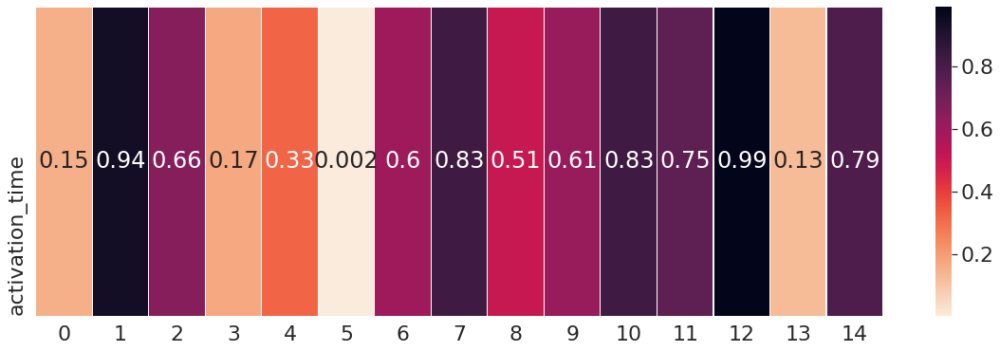

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

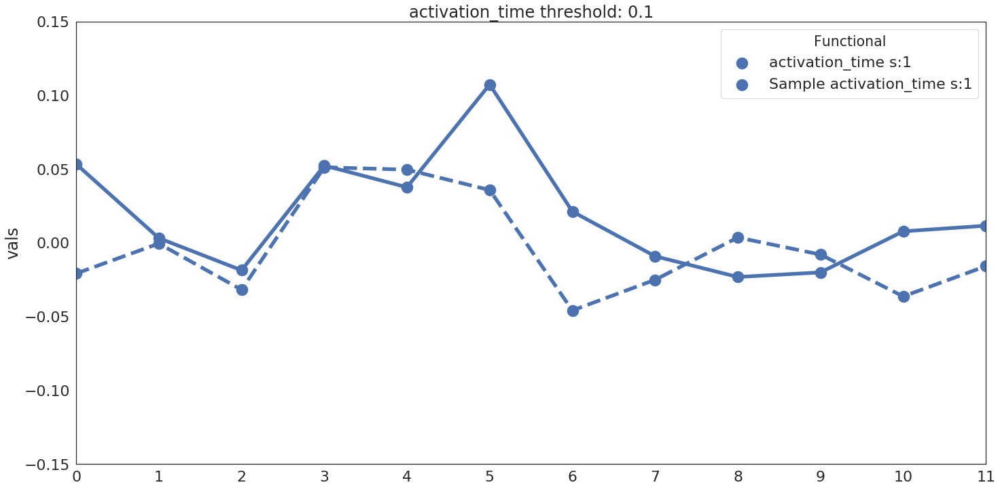

{0: 8, 1: 65, 2: 41, 3: 43, 4: 48, 5: 40, 6: 26, 7: 93, 8: 114, 9: 169, 10: 164, 11: 130, 12: 85, 13: 79, 14: 100, 15: 93}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

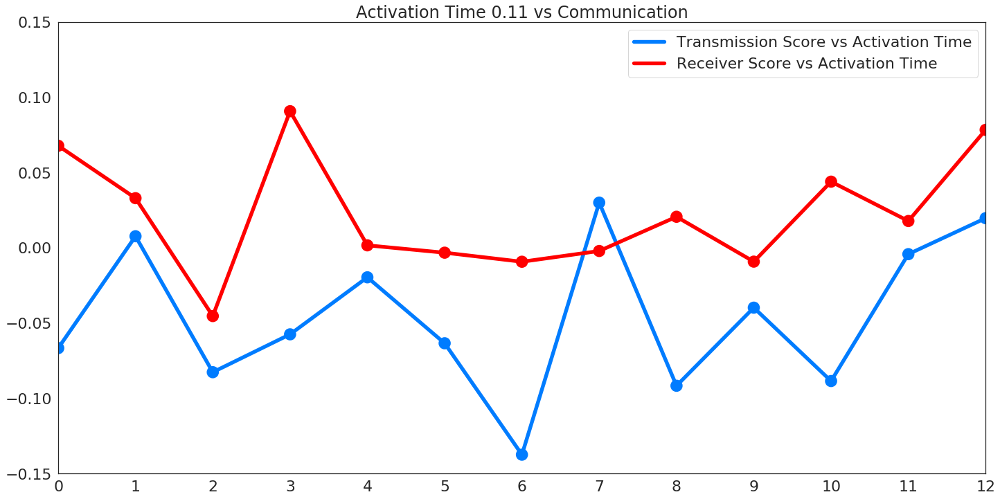

<Figure size 432x288 with 0 Axes>

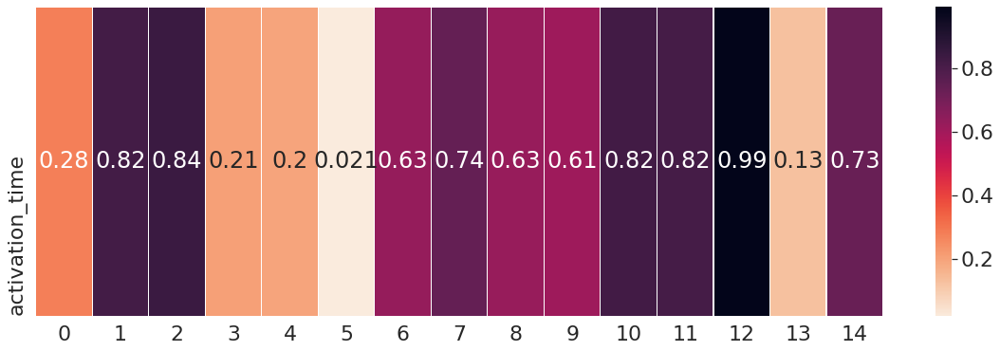

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

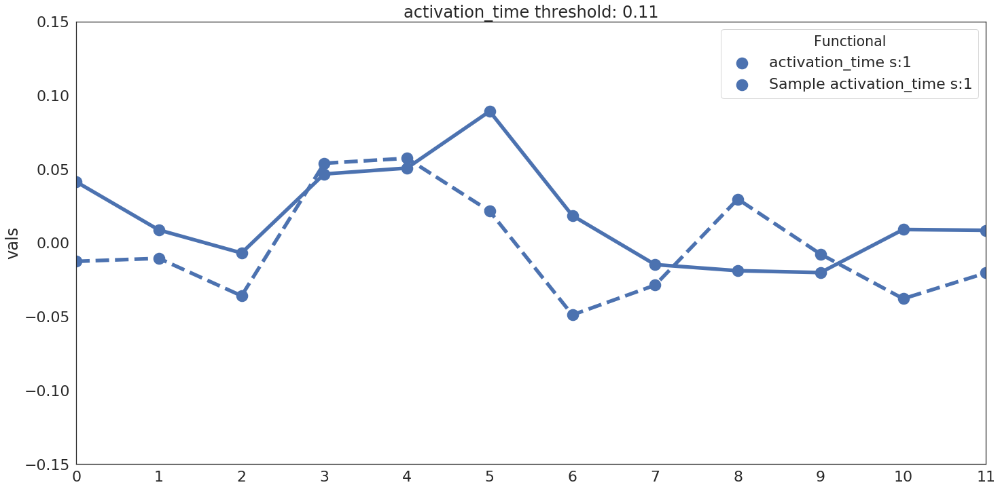

{0: 8, 1: 65, 2: 41, 3: 43, 4: 48, 5: 40, 6: 26, 7: 93, 8: 114, 9: 169, 10: 164, 11: 130, 12: 85, 13: 79, 14: 100, 15: 93}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

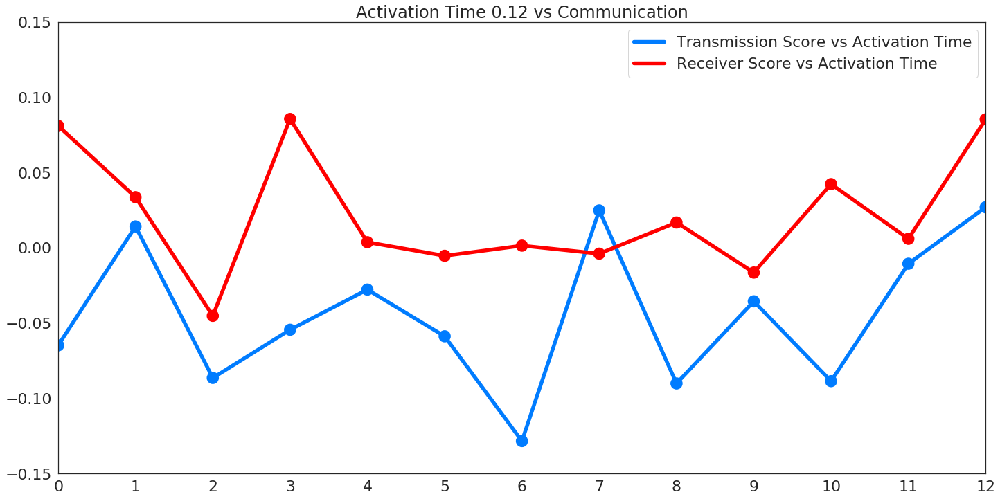

<Figure size 432x288 with 0 Axes>

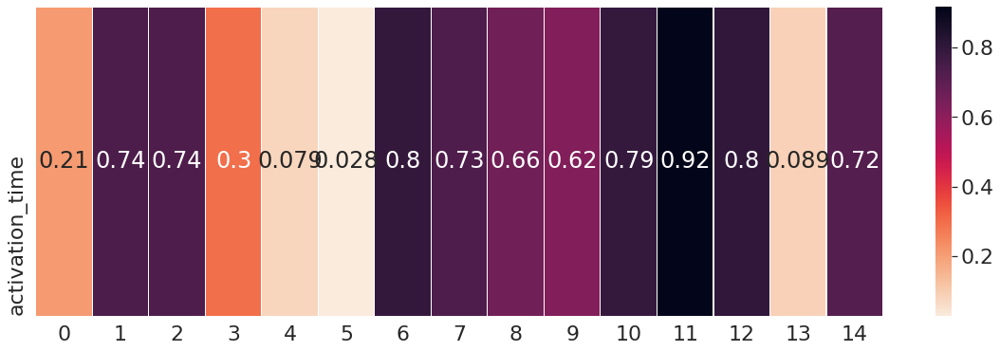

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

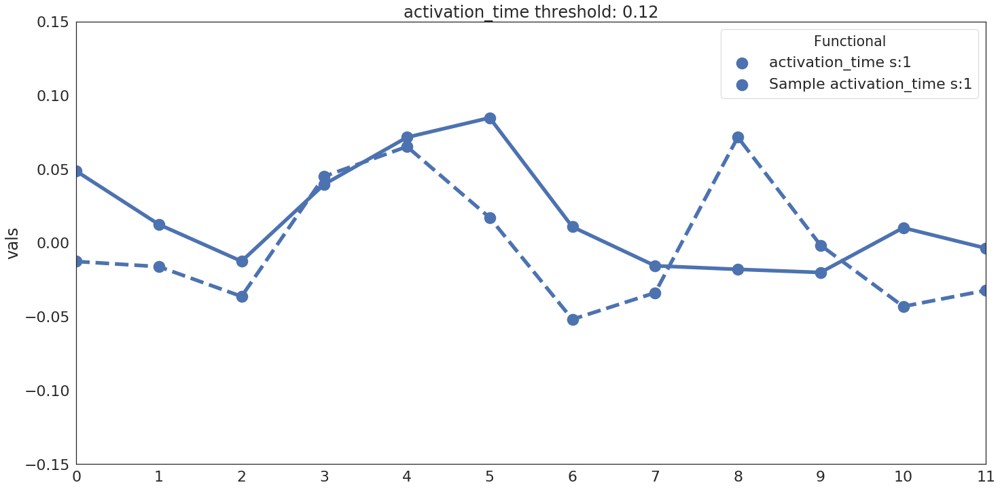

{0: 8, 1: 65, 2: 41, 3: 43, 4: 48, 5: 40, 6: 26, 7: 93, 8: 114, 9: 169, 10: 164, 11: 130, 12: 85, 13: 79, 14: 100, 15: 93}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

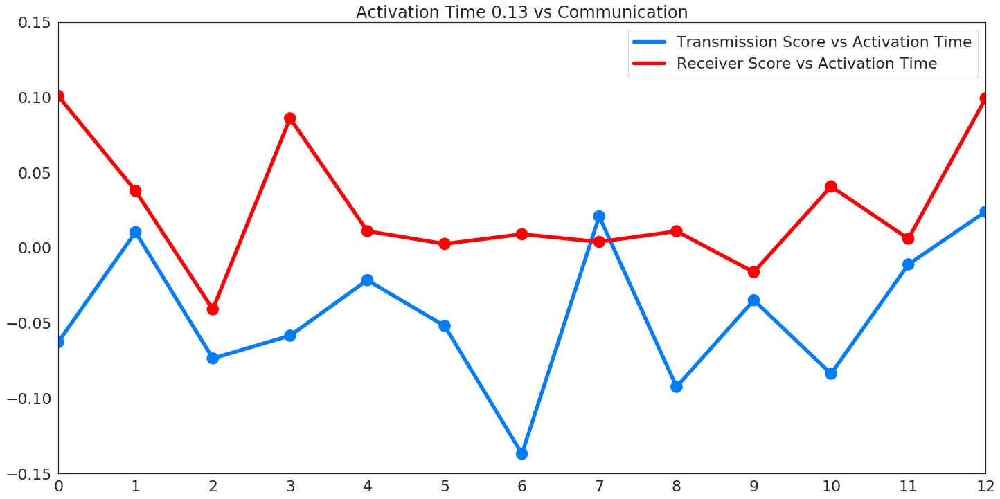

<Figure size 432x288 with 0 Axes>

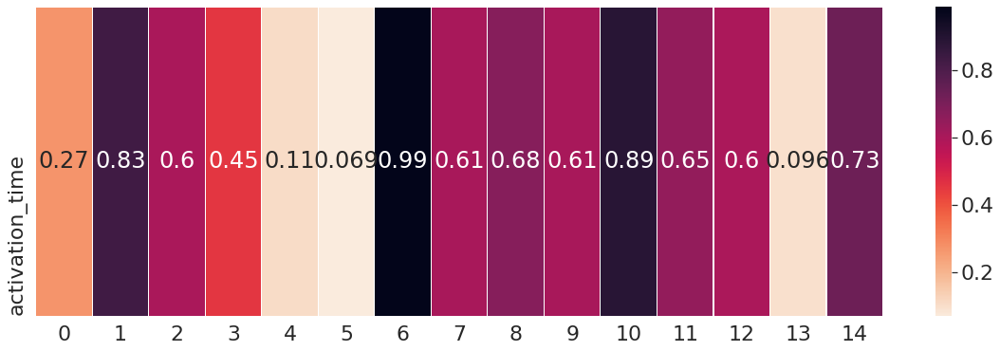

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

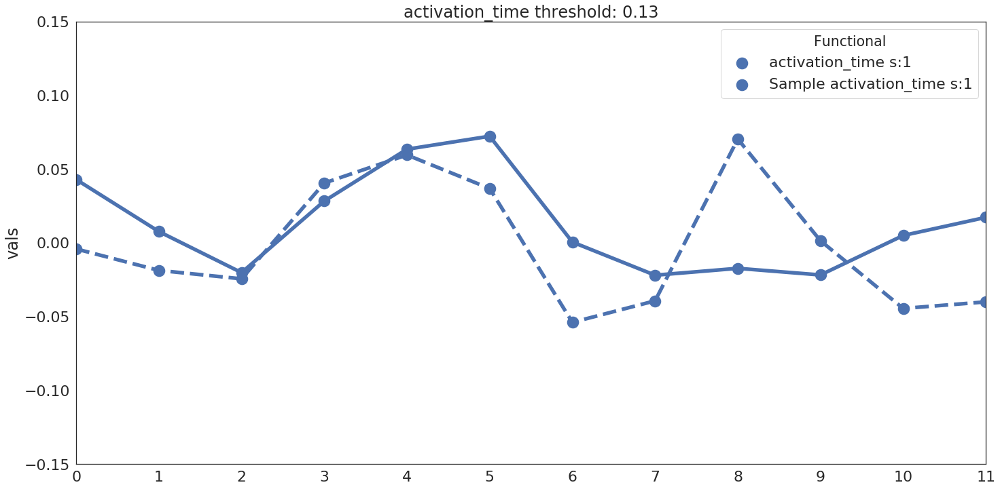

{0: 8, 1: 65, 2: 41, 3: 43, 4: 48, 5: 40, 6: 26, 7: 93, 8: 114, 9: 169, 10: 164, 11: 130, 12: 85, 13: 79, 14: 100, 15: 93}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

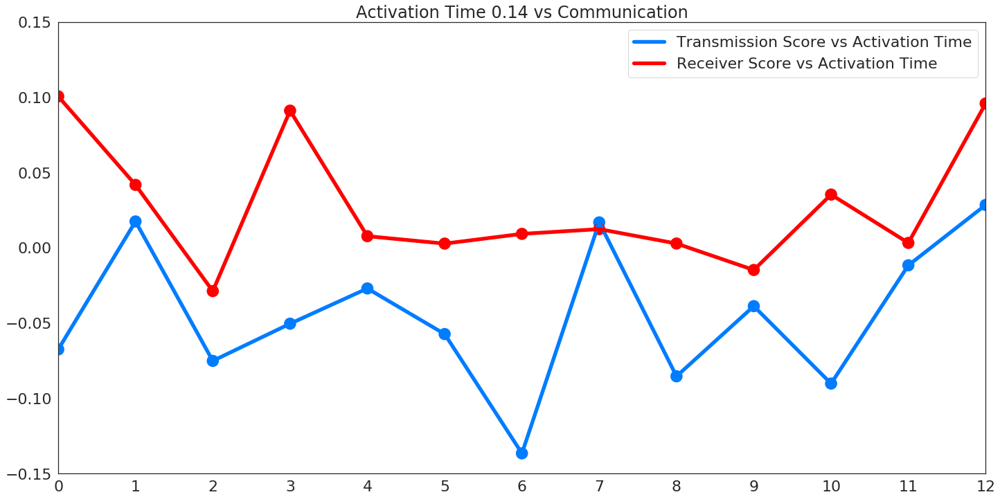

<Figure size 432x288 with 0 Axes>

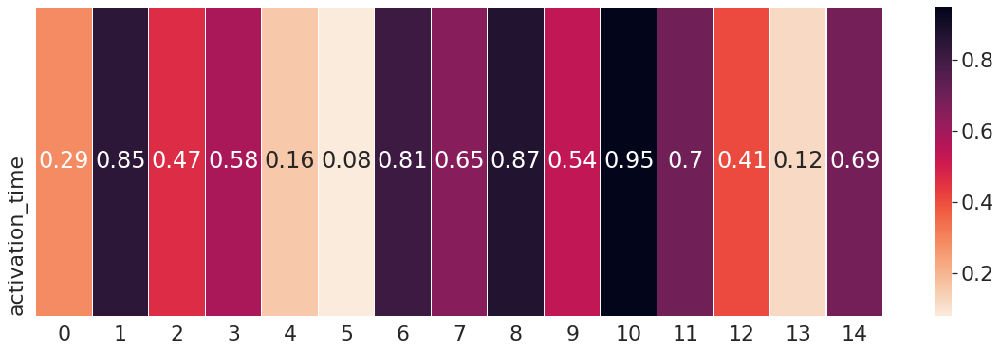

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

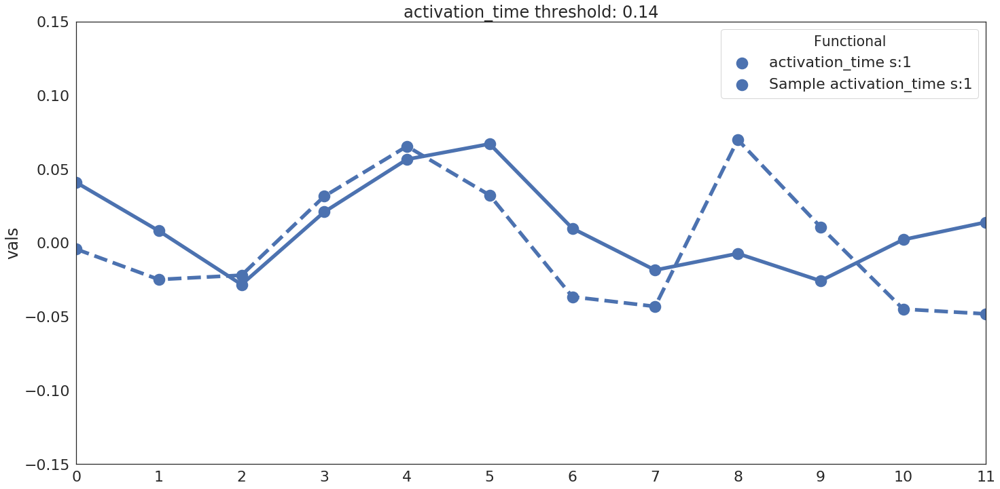

{0: 8, 1: 65, 2: 41, 3: 43, 4: 48, 5: 40, 6: 26, 7: 93, 8: 114, 9: 169, 10: 164, 11: 130, 12: 85, 13: 79, 14: 100, 15: 93}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

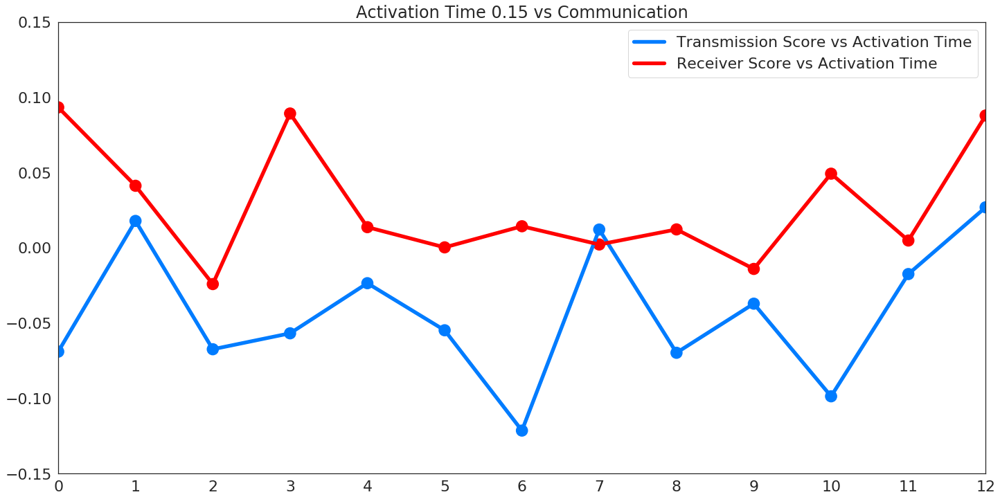

<Figure size 432x288 with 0 Axes>

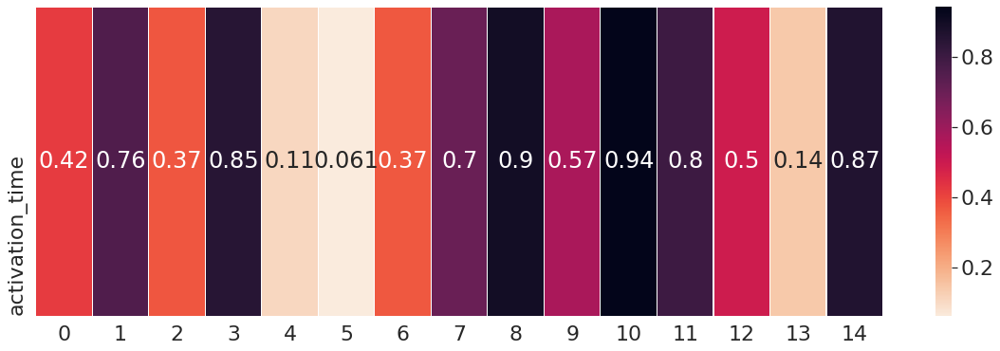

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

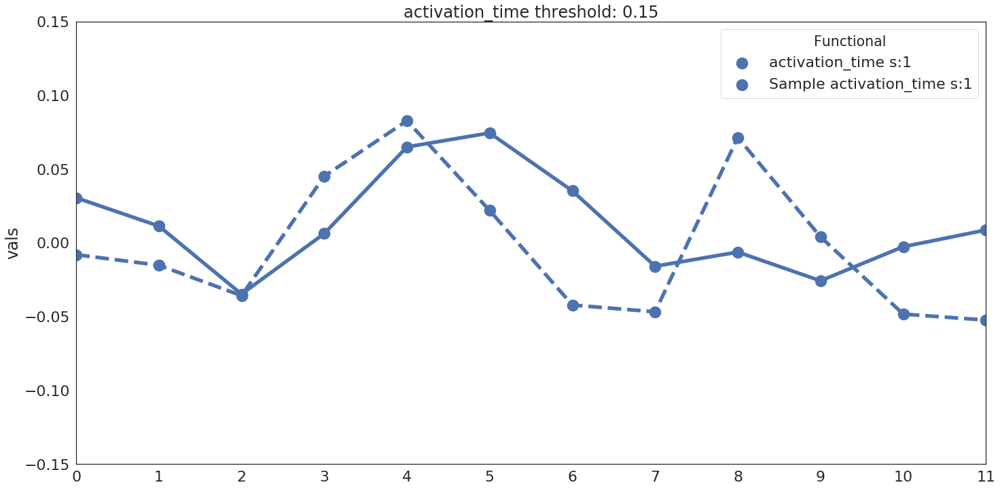

{0: 8, 1: 65, 2: 41, 3: 43, 4: 48, 5: 40, 6: 26, 7: 93, 8: 114, 9: 169, 10: 164, 11: 130, 12: 85, 13: 79, 14: 100, 15: 93}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

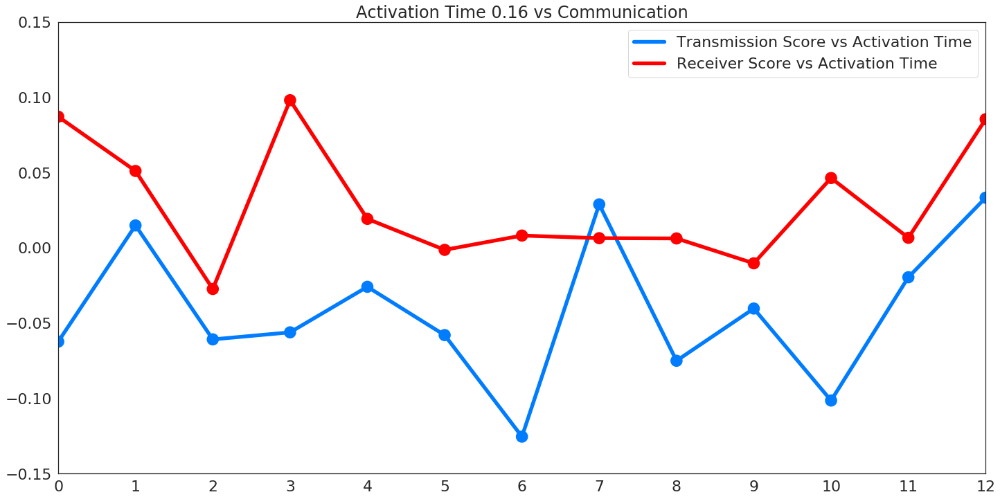

<Figure size 432x288 with 0 Axes>

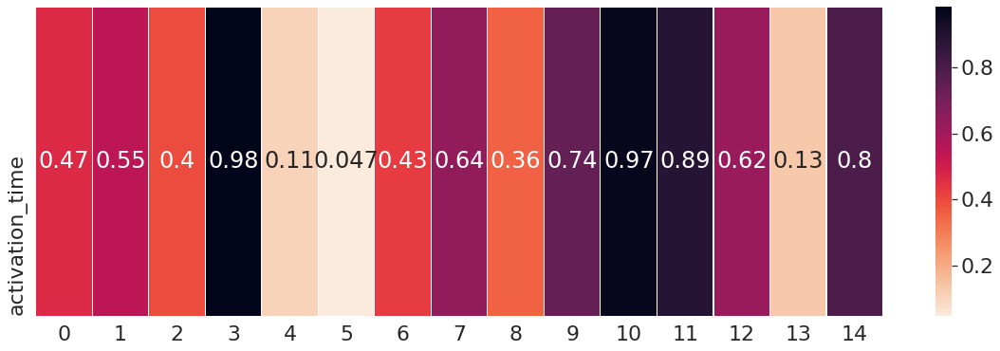

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

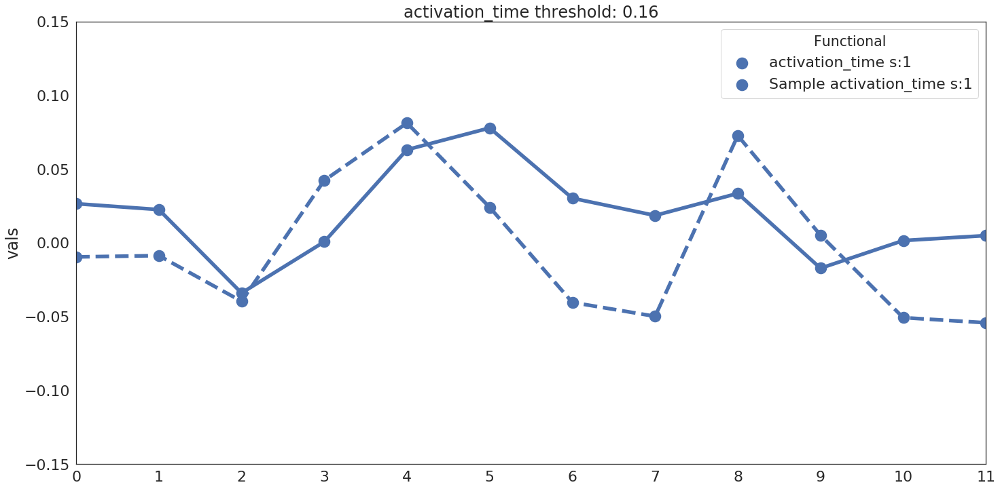

{0: 8, 1: 65, 2: 41, 3: 43, 4: 48, 5: 40, 6: 26, 7: 93, 8: 114, 9: 169, 10: 164, 11: 130, 12: 85, 13: 79, 14: 100, 15: 93}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

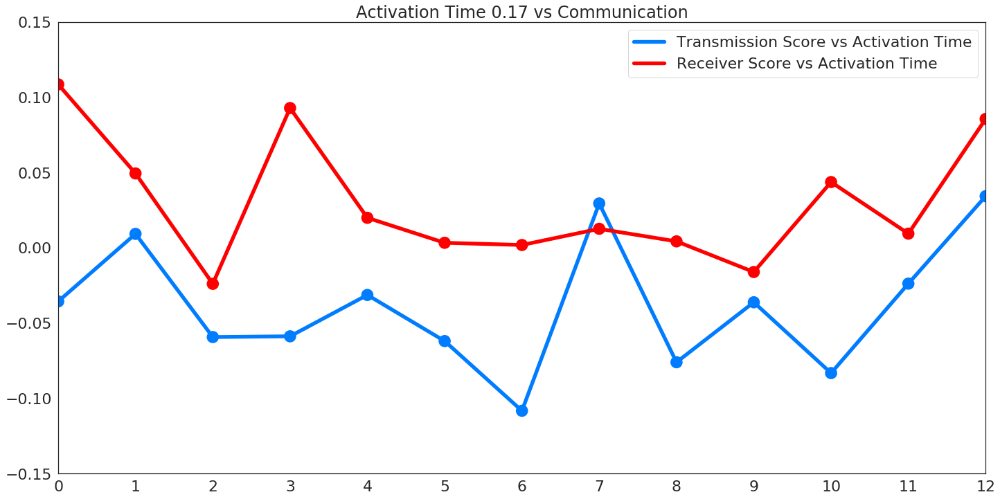

<Figure size 432x288 with 0 Axes>

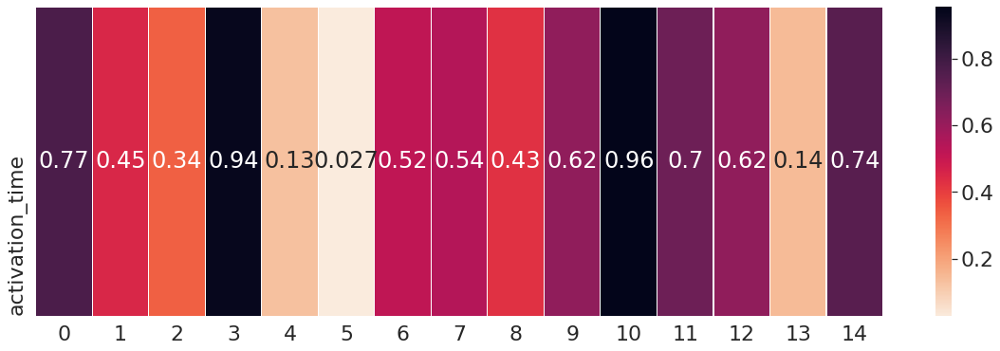

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

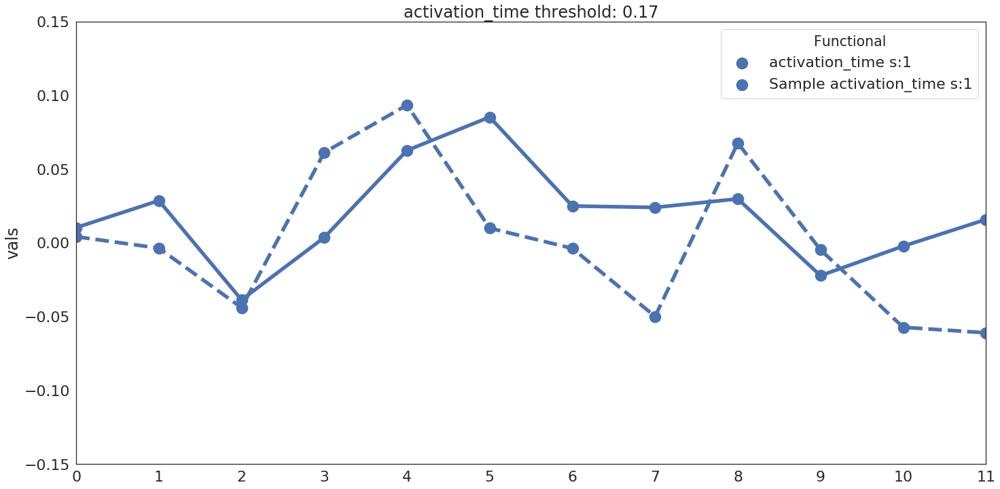

{0: 8, 1: 65, 2: 41, 3: 43, 4: 48, 5: 40, 6: 26, 7: 93, 8: 114, 9: 169, 10: 164, 11: 130, 12: 85, 13: 79, 14: 100, 15: 93}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

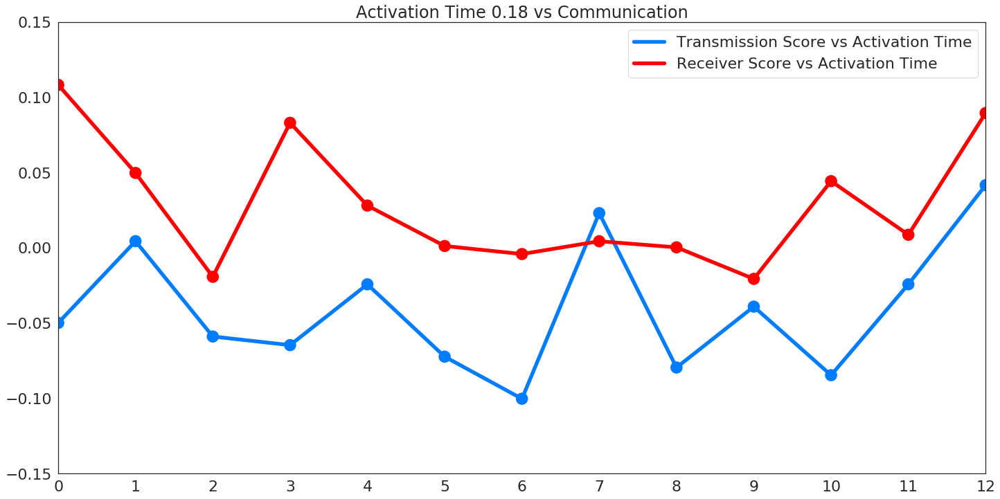

<Figure size 432x288 with 0 Axes>

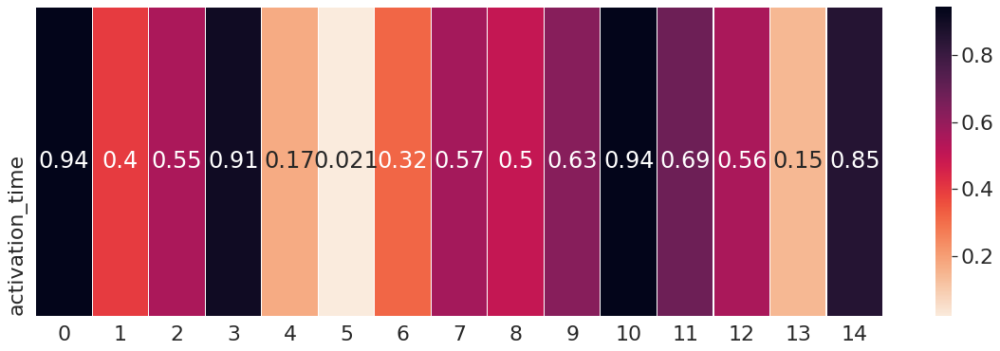

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

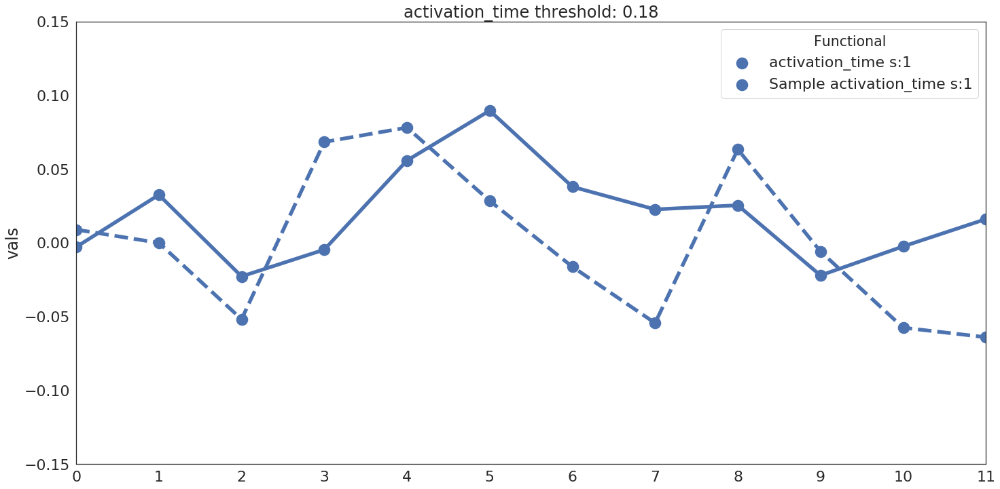

{0: 8, 1: 65, 2: 41, 3: 43, 4: 48, 5: 40, 6: 26, 7: 93, 8: 114, 9: 169, 10: 164, 11: 130, 12: 85, 13: 79, 14: 100, 15: 93}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

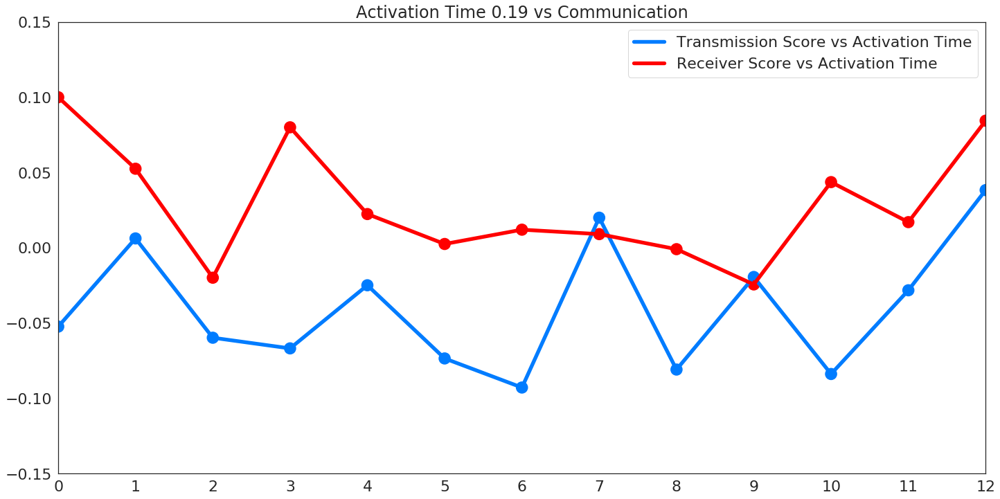

<Figure size 432x288 with 0 Axes>

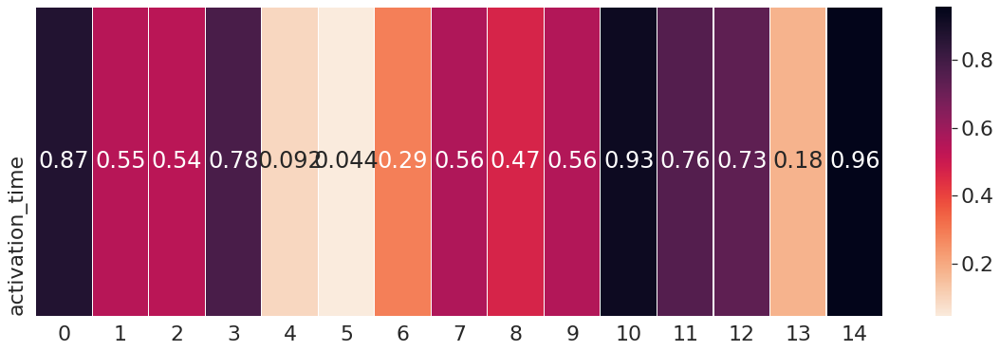

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

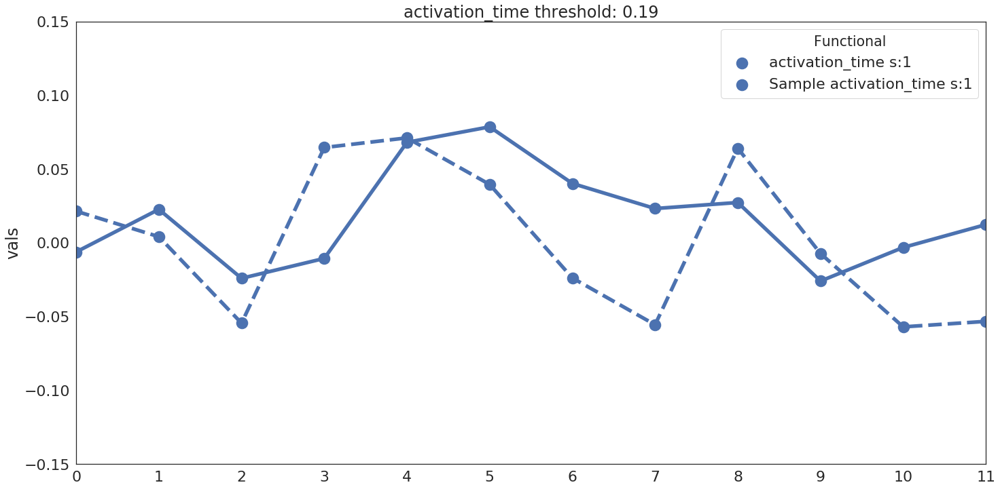

{0: 8, 1: 65, 2: 41, 3: 43, 4: 48, 5: 40, 6: 26, 7: 93, 8: 114, 9: 169, 10: 164, 11: 130, 12: 85, 13: 79, 14: 100, 15: 93}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

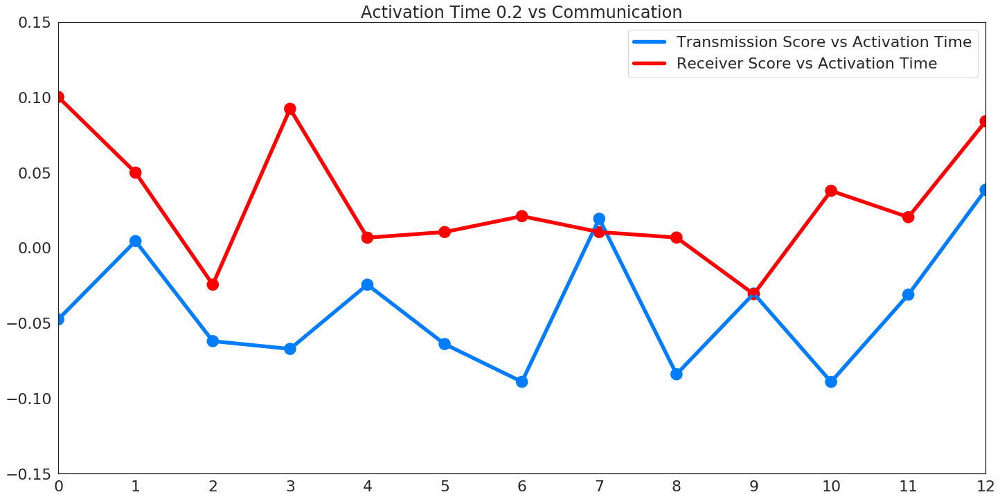

<Figure size 432x288 with 0 Axes>

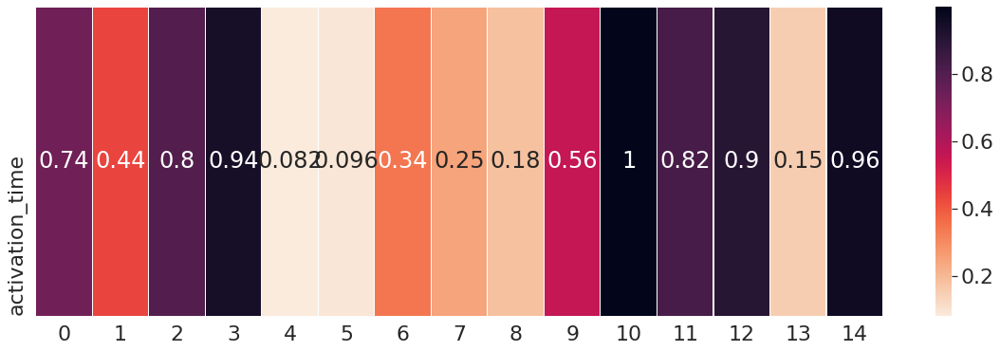

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

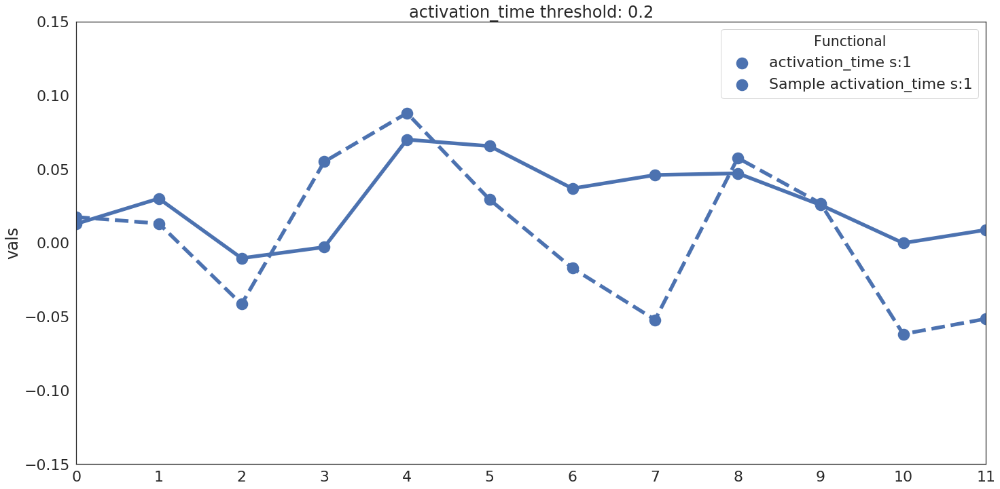

{0: 8, 1: 65, 2: 41, 3: 43, 4: 48, 5: 40, 6: 26, 7: 93, 8: 114, 9: 169, 10: 164, 11: 130, 12: 85, 13: 79, 14: 100, 15: 93}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

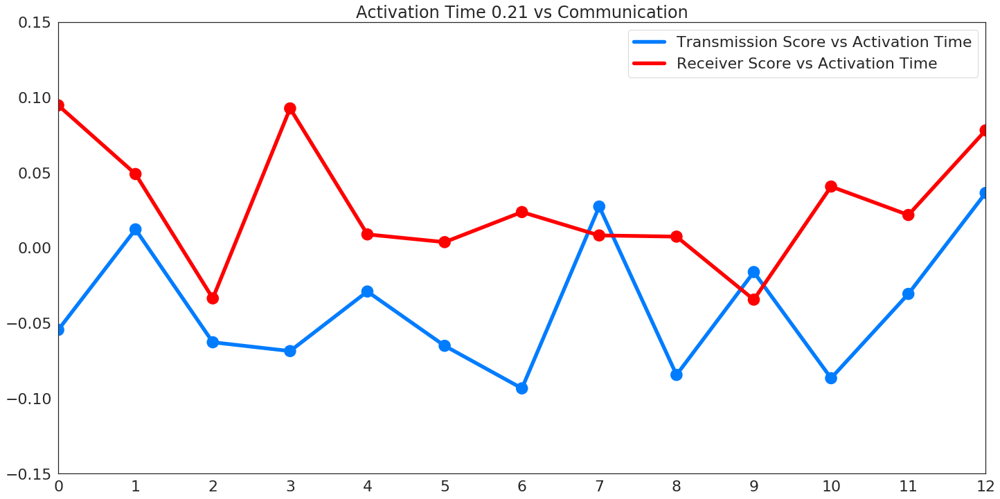

<Figure size 432x288 with 0 Axes>

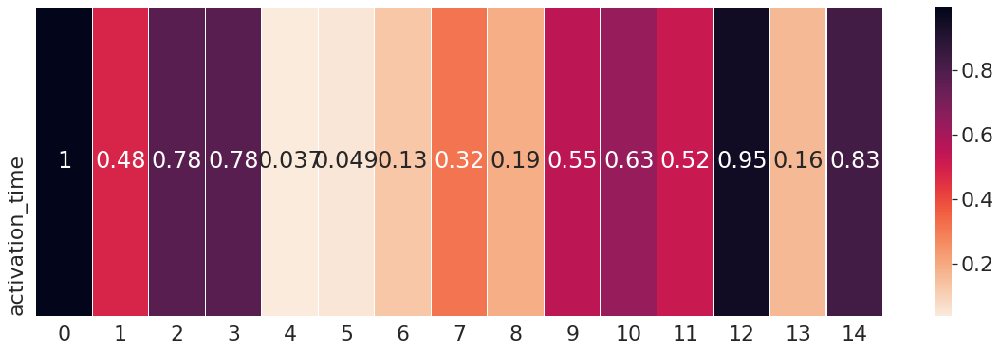

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

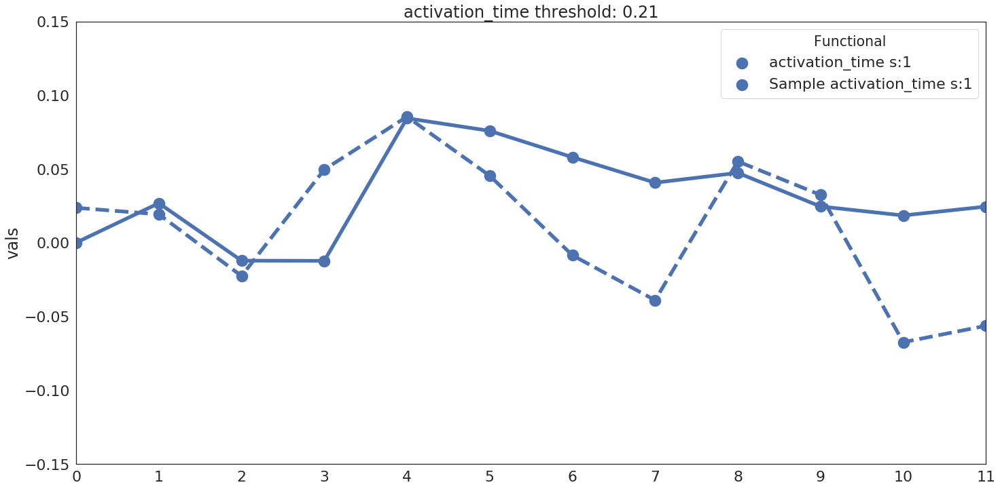

{0: 8, 1: 65, 2: 41, 3: 43, 4: 48, 5: 40, 6: 26, 7: 93, 8: 114, 9: 169, 10: 164, 11: 130, 12: 85, 13: 79, 14: 100, 15: 93}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

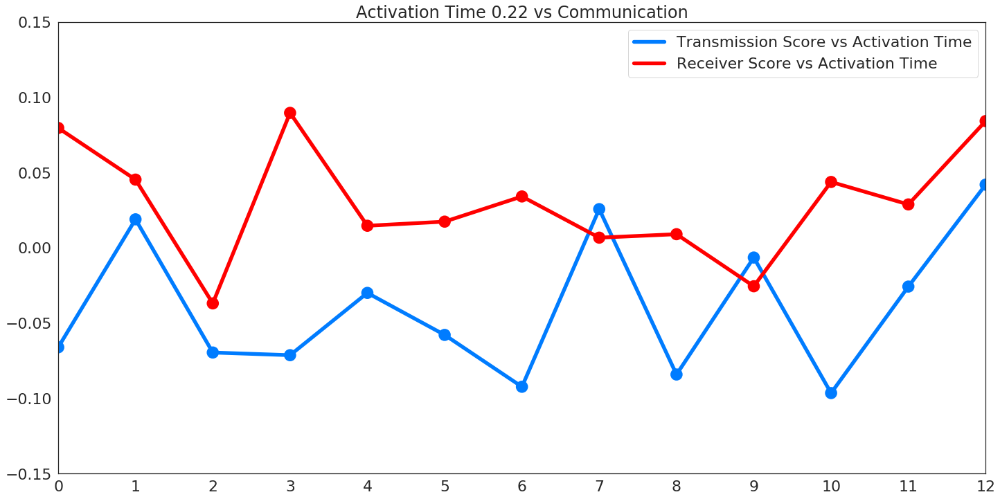

<Figure size 432x288 with 0 Axes>

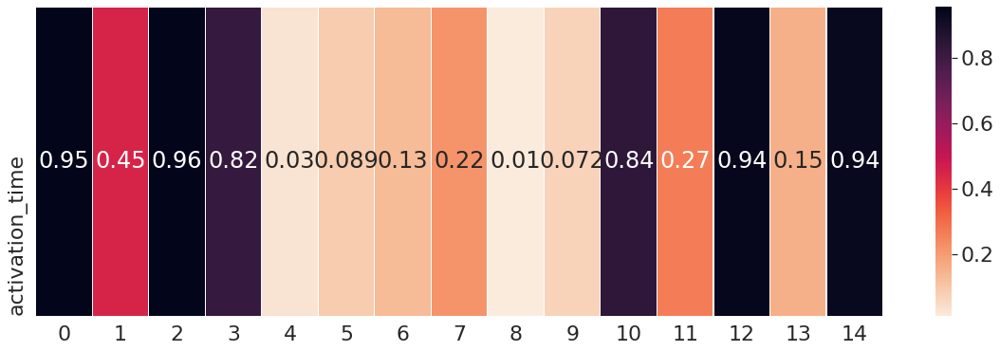

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

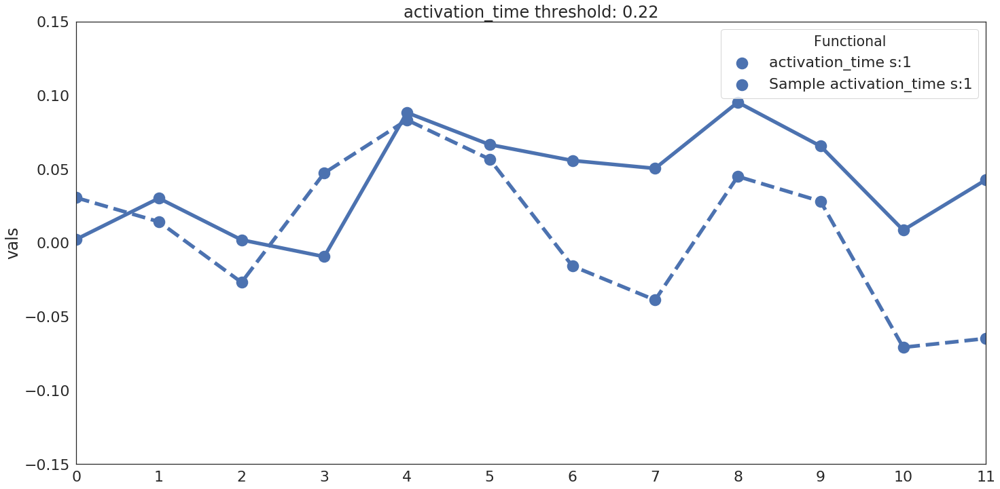

{0: 8, 1: 65, 2: 41, 3: 43, 4: 48, 5: 40, 6: 26, 7: 93, 8: 114, 9: 169, 10: 164, 11: 130, 12: 85, 13: 79, 14: 100, 15: 93}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

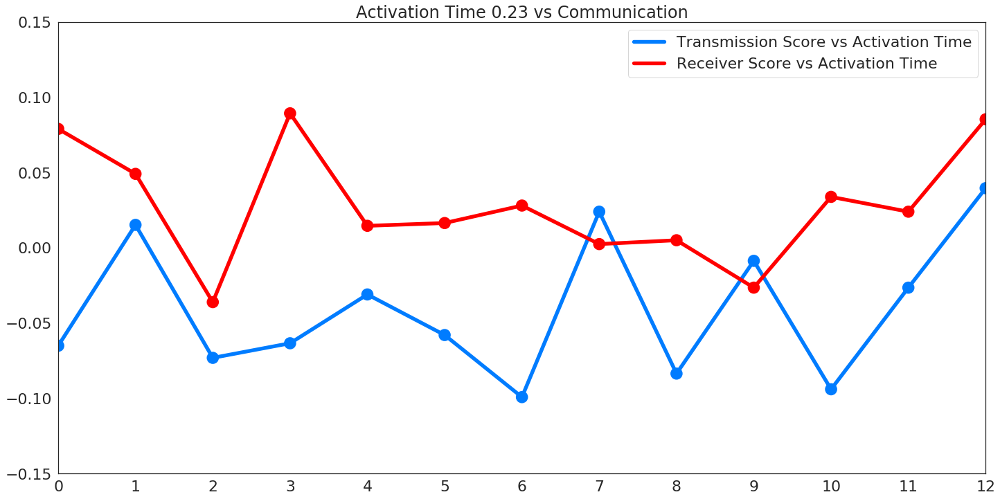

<Figure size 432x288 with 0 Axes>

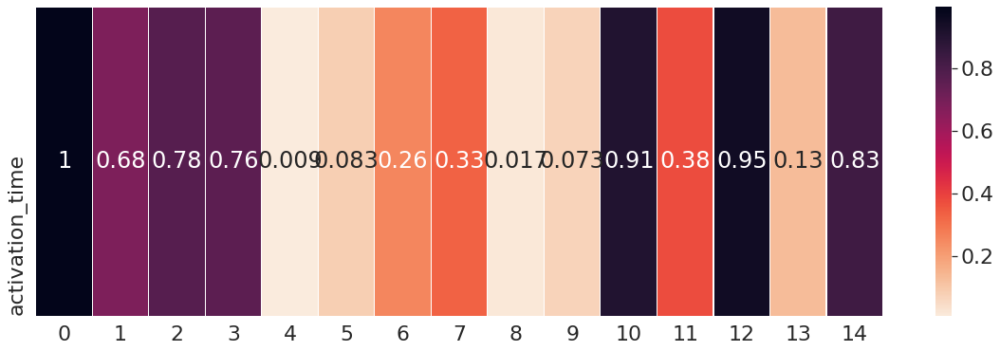

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

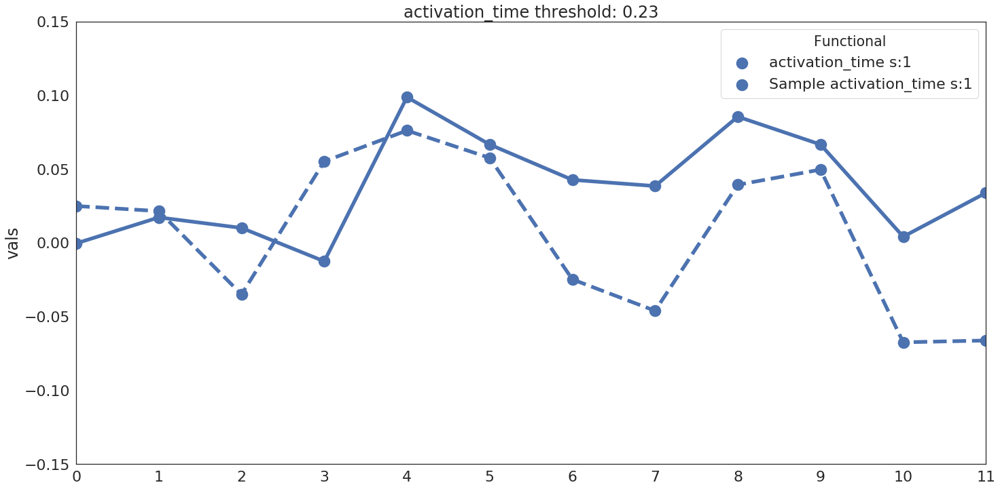

{0: 8, 1: 65, 2: 41, 3: 43, 4: 48, 5: 40, 6: 26, 7: 93, 8: 114, 9: 169, 10: 164, 11: 130, 12: 85, 13: 79, 14: 100, 15: 93}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

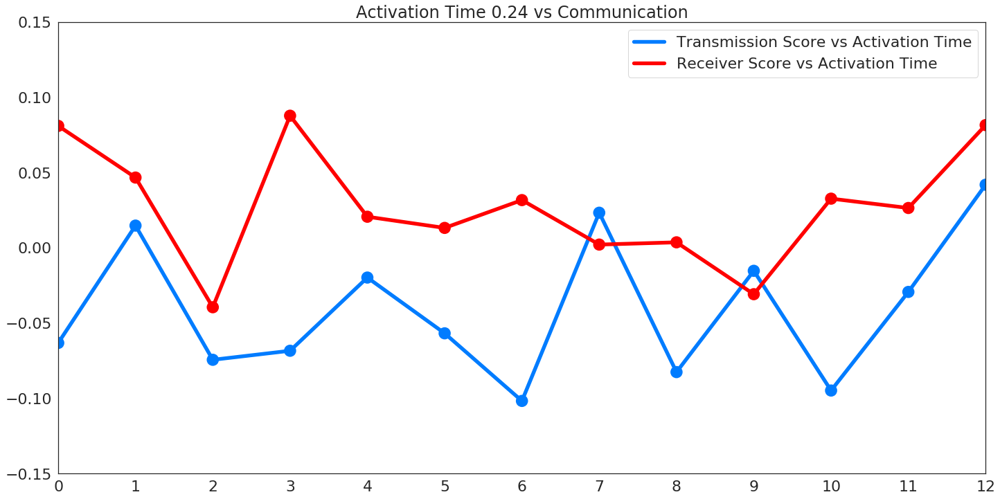

<Figure size 432x288 with 0 Axes>

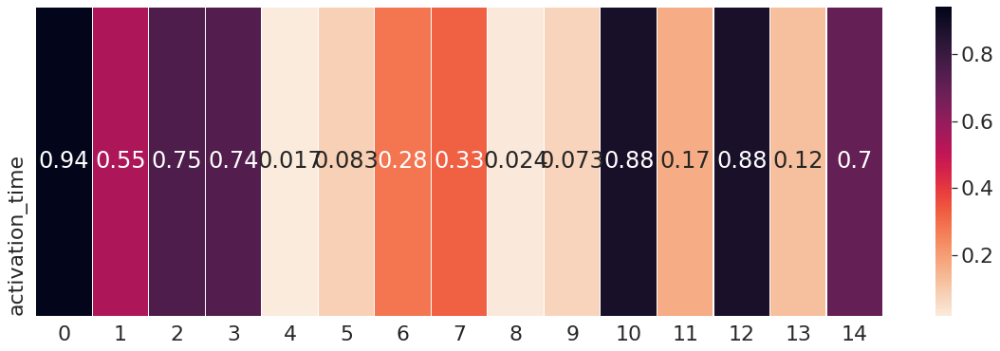

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

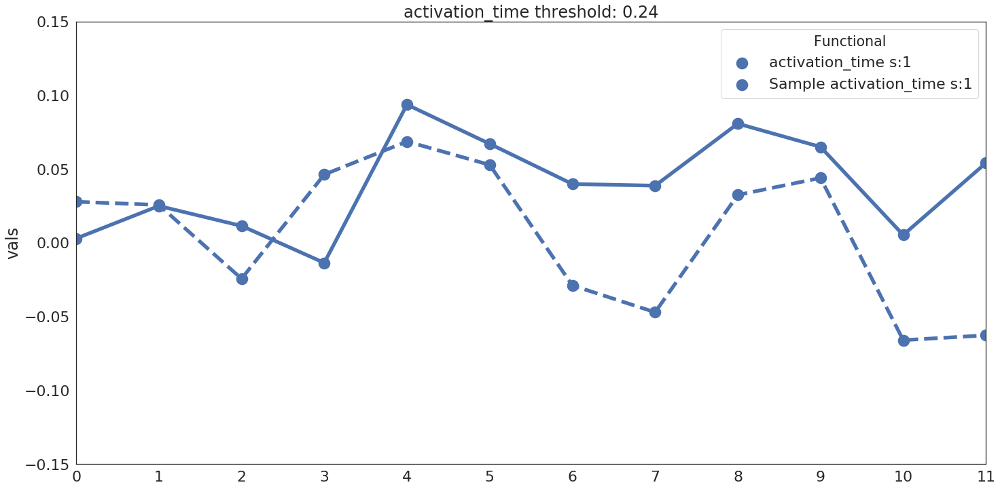

{0: 8, 1: 65, 2: 41, 3: 43, 4: 48, 5: 40, 6: 26, 7: 93, 8: 114, 9: 169, 10: 164, 11: 130, 12: 85, 13: 79, 14: 100, 15: 93}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

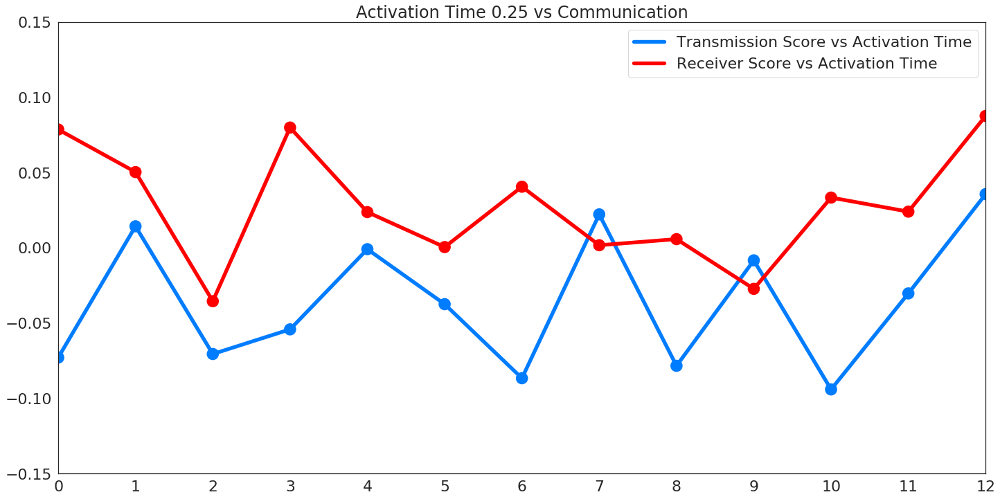

<Figure size 432x288 with 0 Axes>

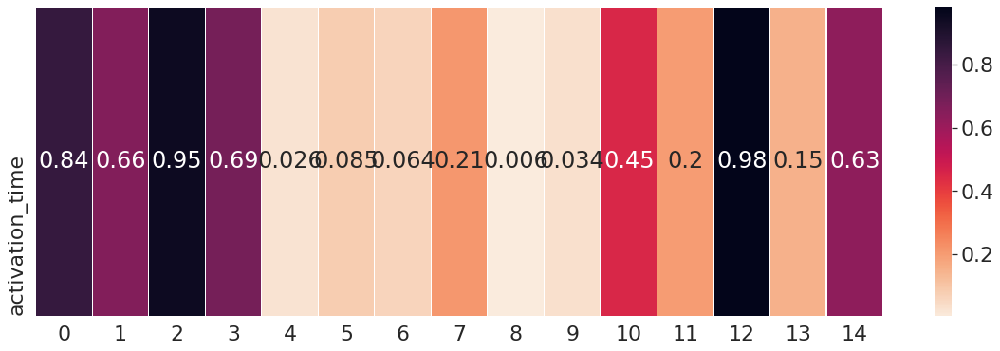

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

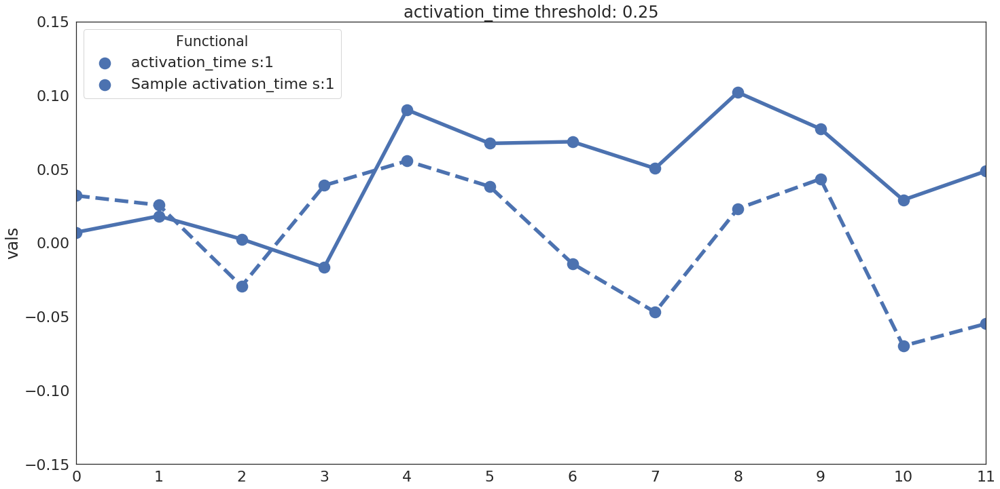

{0: 8, 1: 65, 2: 41, 3: 43, 4: 48, 5: 40, 6: 26, 7: 93, 8: 114, 9: 169, 10: 164, 11: 130, 12: 85, 13: 79, 14: 100, 15: 93}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

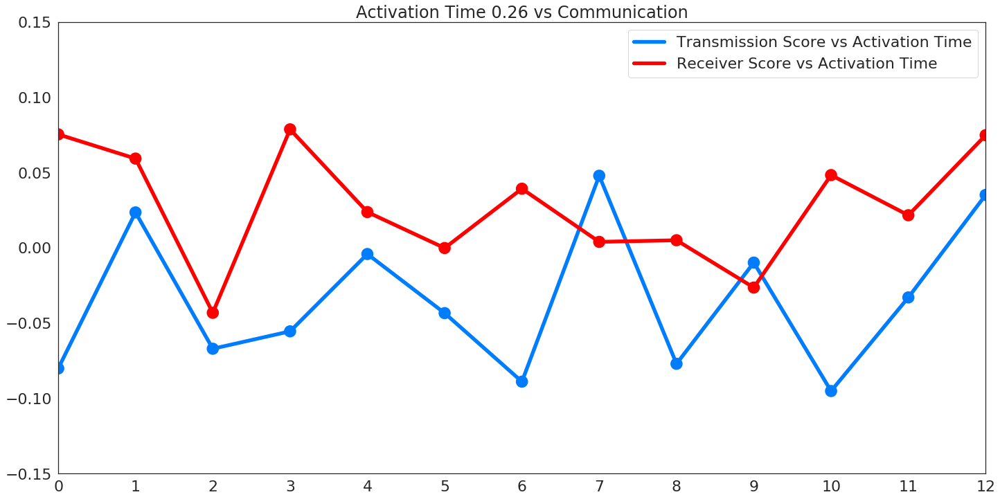

<Figure size 432x288 with 0 Axes>

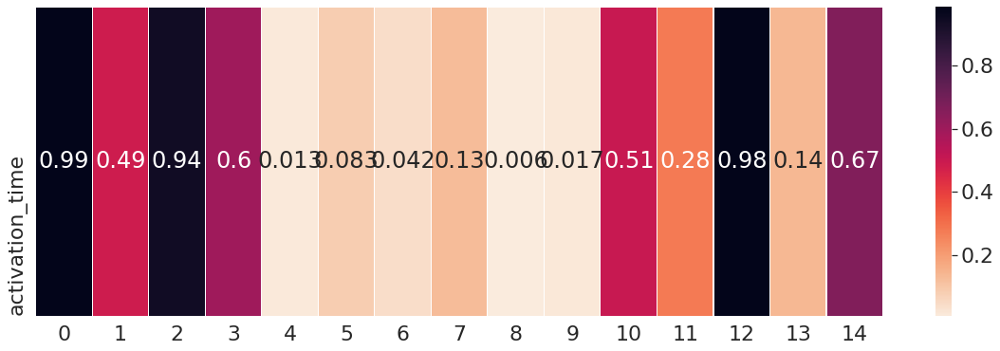

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

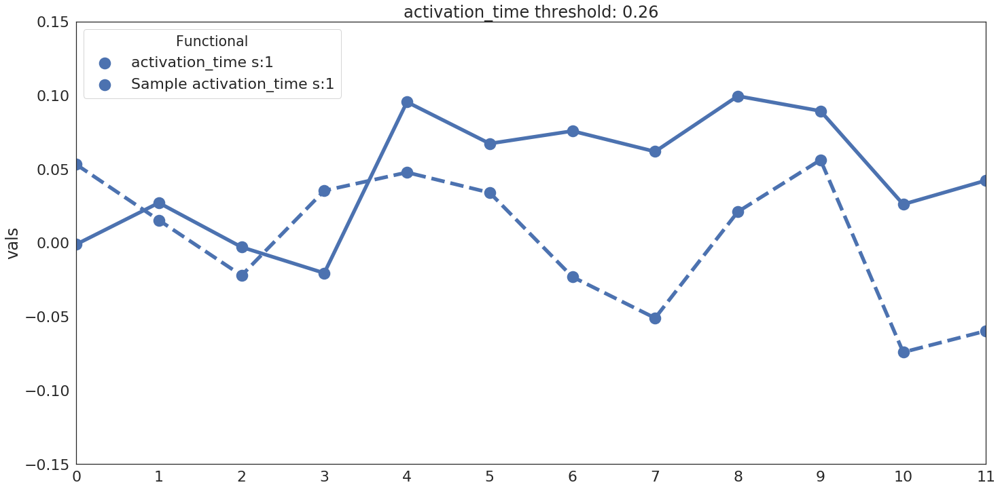

{0: 8, 1: 65, 2: 41, 3: 43, 4: 48, 5: 40, 6: 26, 7: 93, 8: 114, 9: 169, 10: 164, 11: 130, 12: 85, 13: 79, 14: 100, 15: 93}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

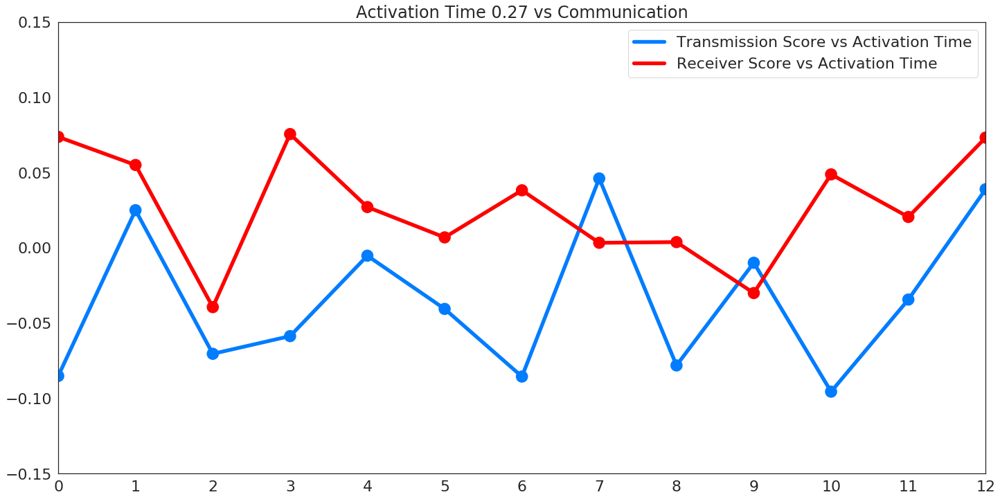

<Figure size 432x288 with 0 Axes>

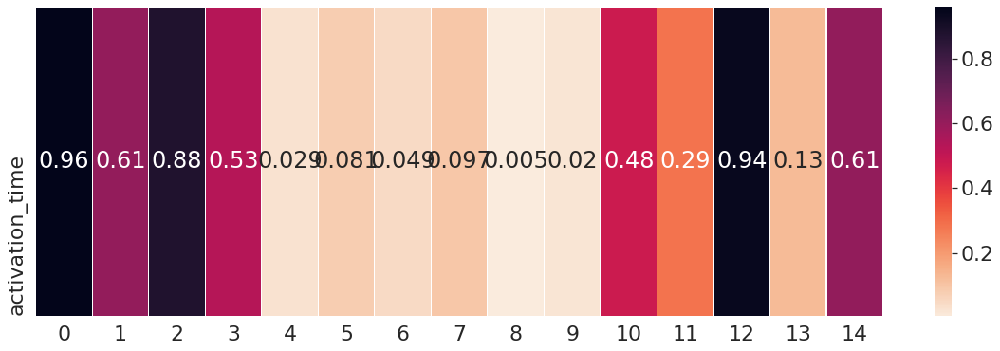

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

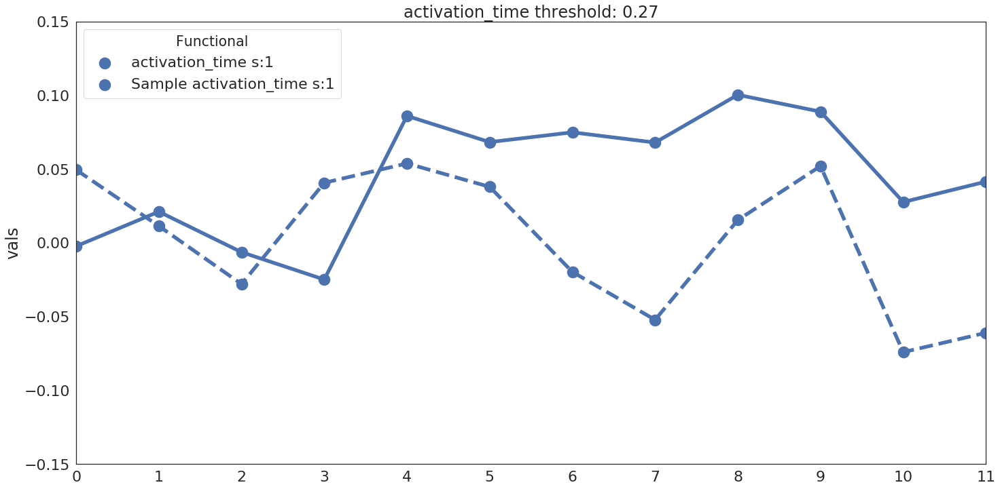

{0: 8, 1: 65, 2: 41, 3: 43, 4: 48, 5: 40, 6: 26, 7: 93, 8: 114, 9: 169, 10: 164, 11: 130, 12: 85, 13: 79, 14: 100, 15: 93}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

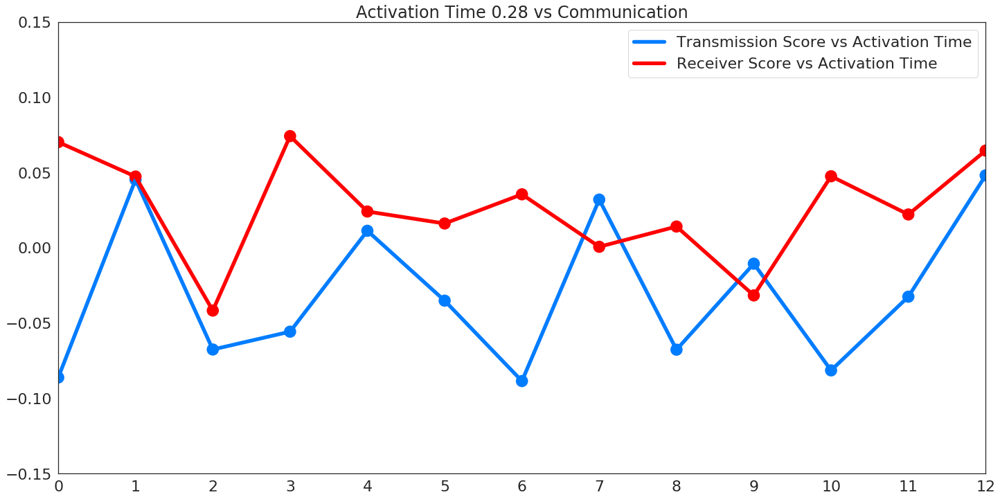

<Figure size 432x288 with 0 Axes>

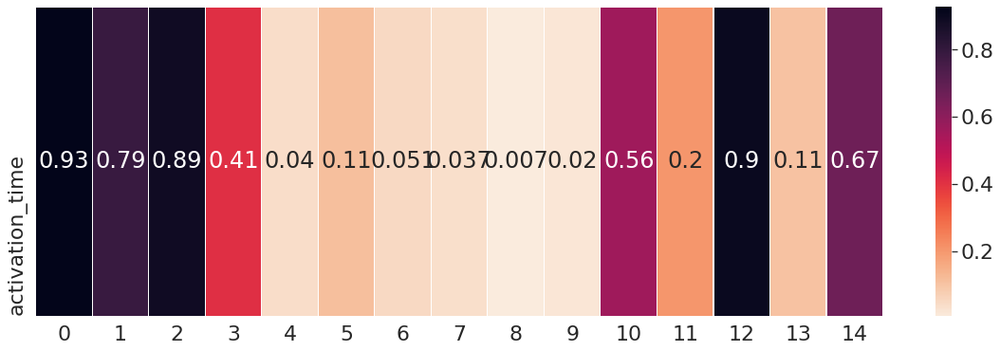

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

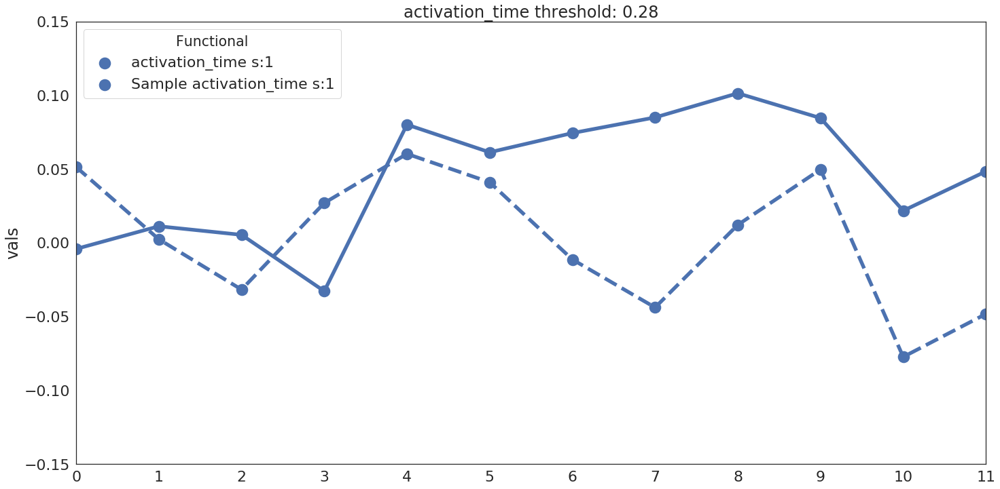

{0: 8, 1: 65, 2: 41, 3: 43, 4: 48, 5: 40, 6: 26, 7: 93, 8: 114, 9: 169, 10: 164, 11: 130, 12: 85, 13: 79, 14: 100, 15: 93}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

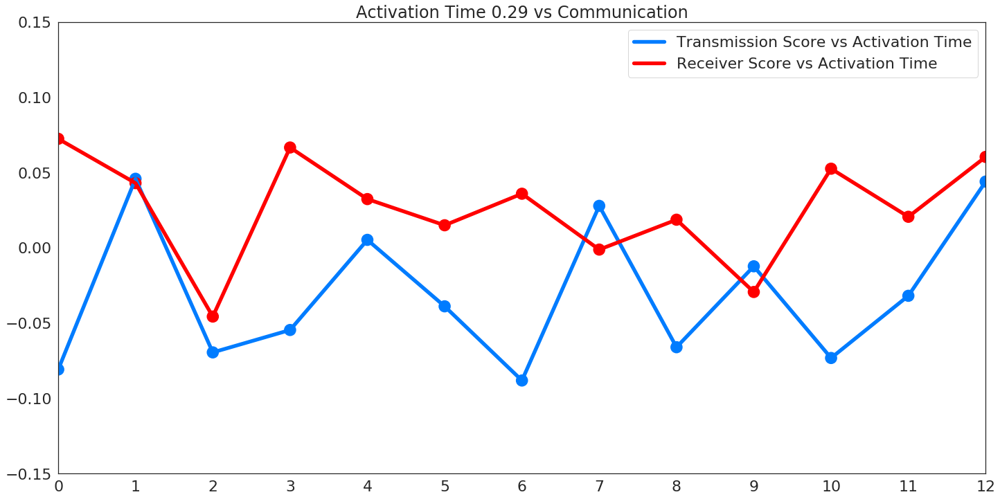

<Figure size 432x288 with 0 Axes>

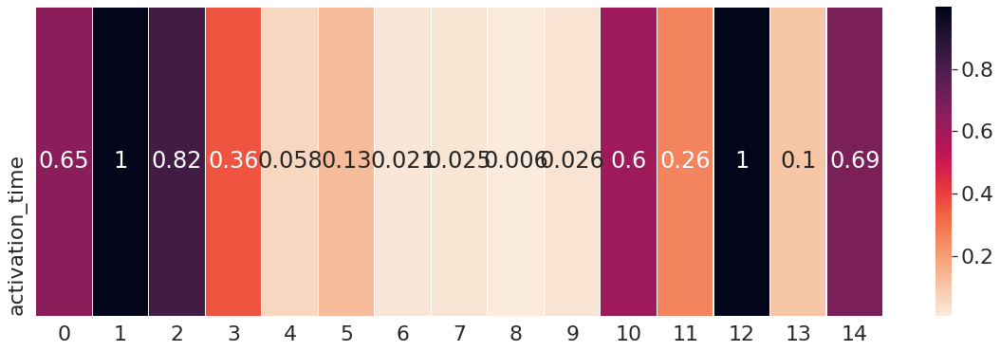

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

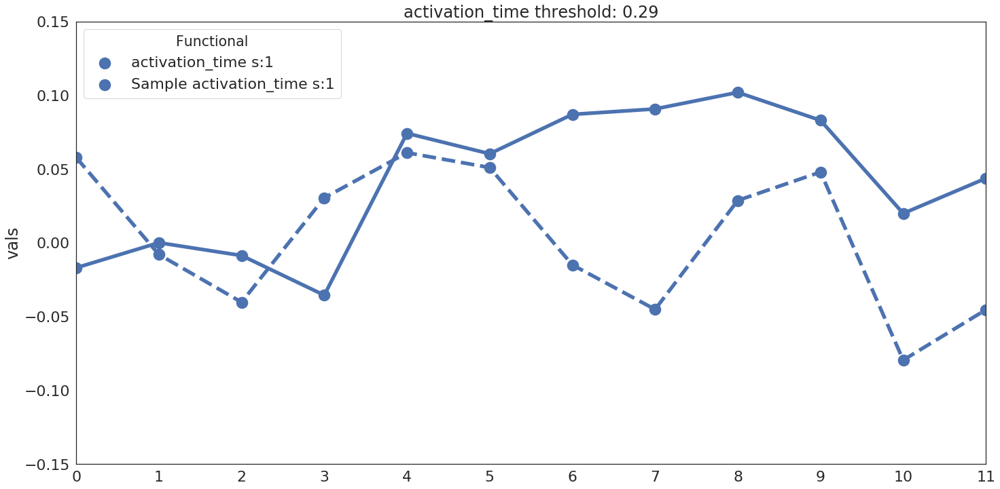

{0: 8, 1: 65, 2: 41, 3: 43, 4: 48, 5: 40, 6: 26, 7: 93, 8: 114, 9: 169, 10: 164, 11: 130, 12: 85, 13: 79, 14: 100, 15: 93}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

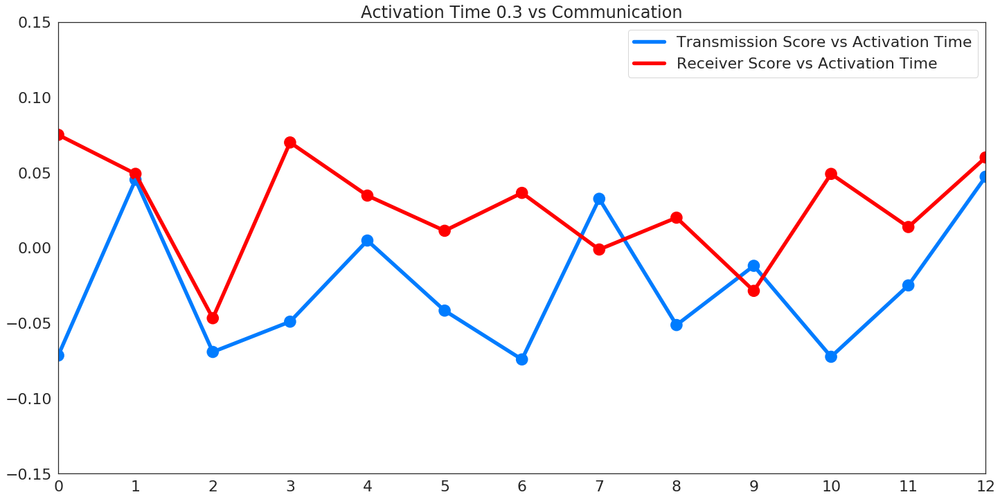

<Figure size 432x288 with 0 Axes>

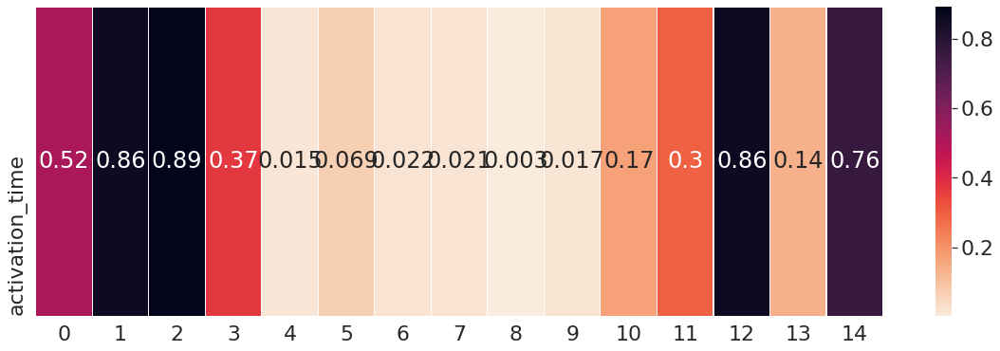

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

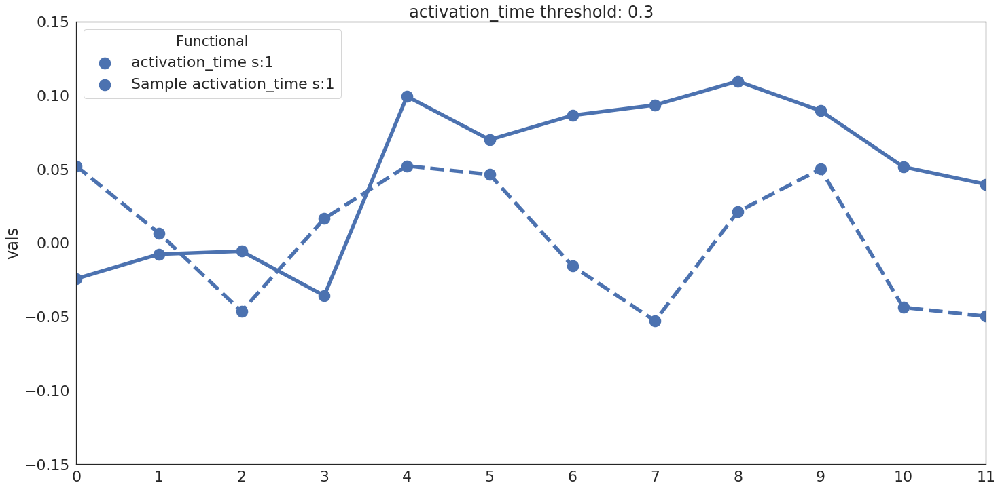

{0: 8, 1: 65, 2: 41, 3: 43, 4: 48, 5: 40, 6: 26, 7: 93, 8: 114, 9: 169, 10: 164, 11: 130, 12: 85, 13: 79, 14: 100, 15: 93}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

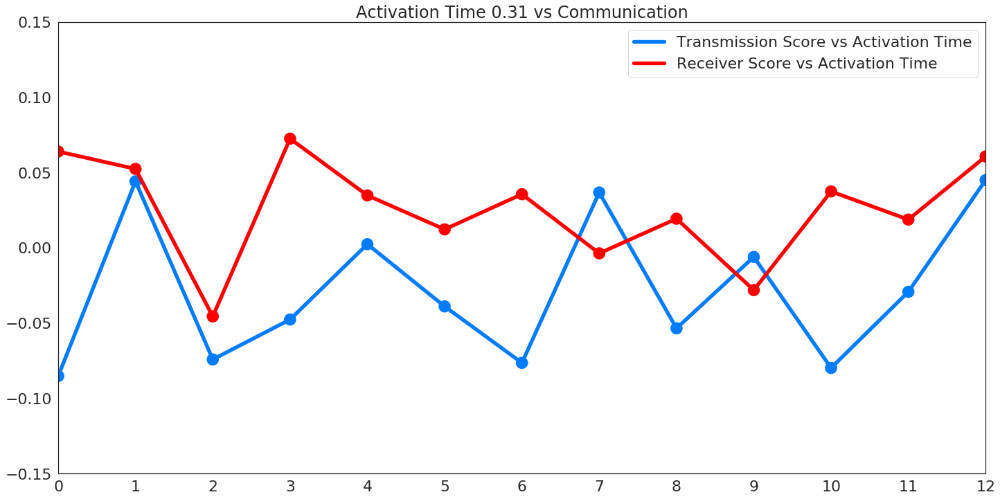

<Figure size 432x288 with 0 Axes>

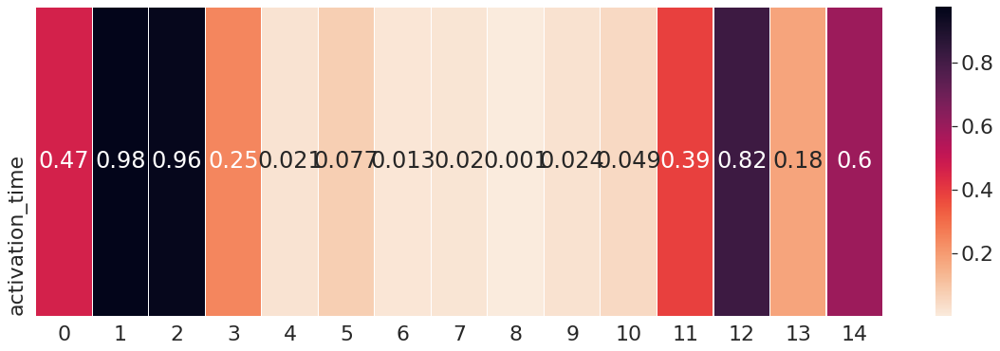

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

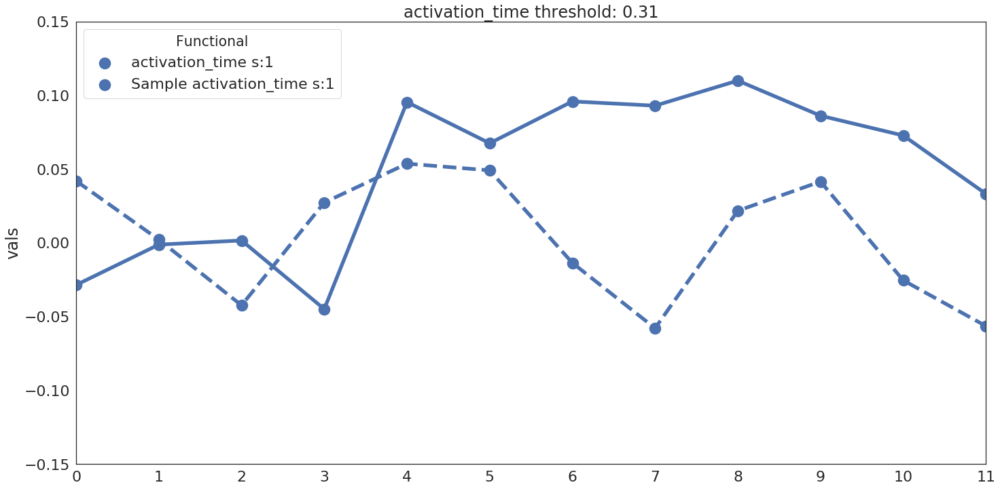

{0: 8, 1: 65, 2: 41, 3: 43, 4: 48, 5: 40, 6: 26, 7: 93, 8: 114, 9: 169, 10: 164, 11: 130, 12: 85, 13: 79, 14: 100, 15: 93}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

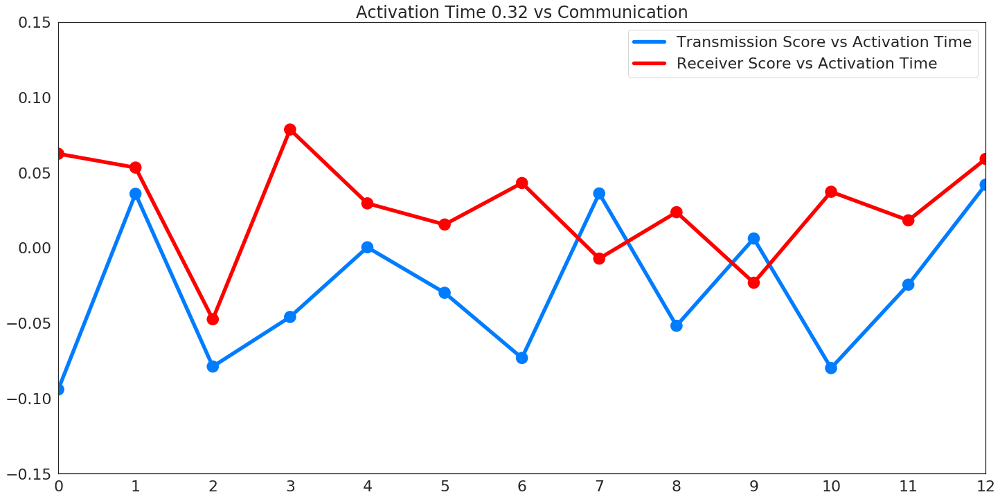

<Figure size 432x288 with 0 Axes>

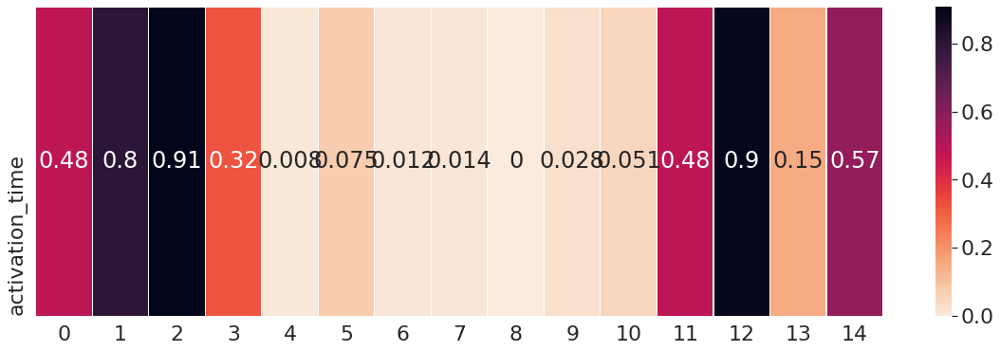

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

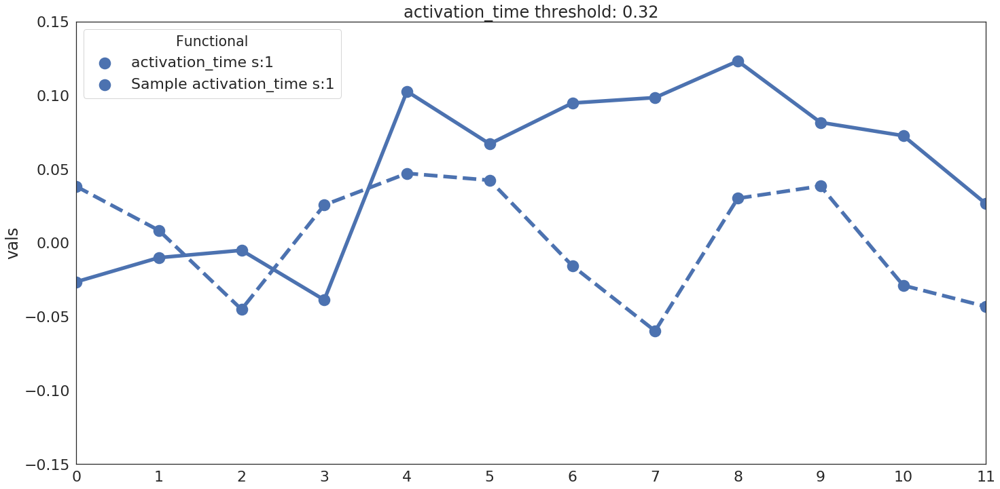

{0: 8, 1: 65, 2: 41, 3: 43, 4: 48, 5: 40, 6: 26, 7: 93, 8: 114, 9: 169, 10: 164, 11: 130, 12: 85, 13: 79, 14: 100, 15: 93}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

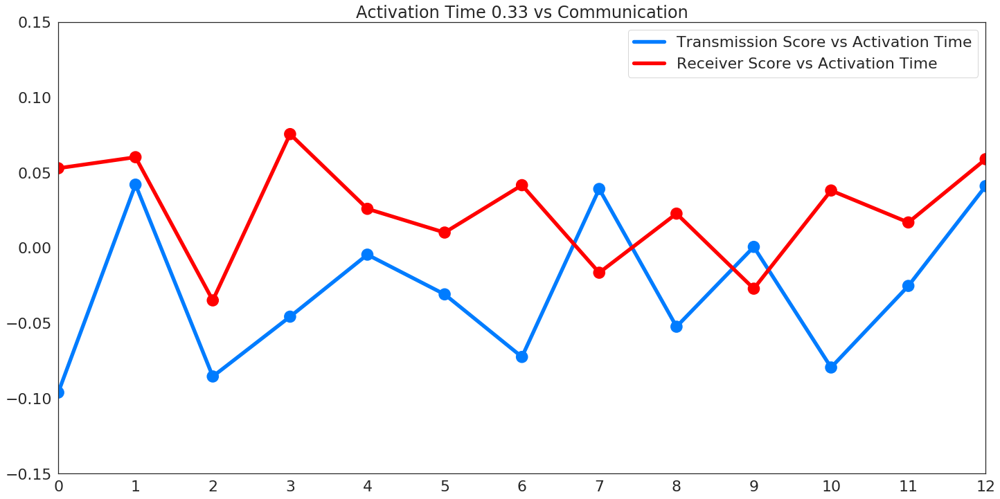

<Figure size 432x288 with 0 Axes>

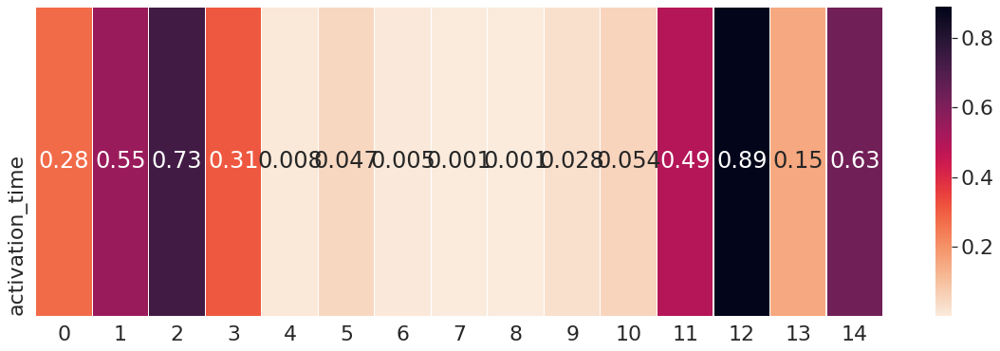

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

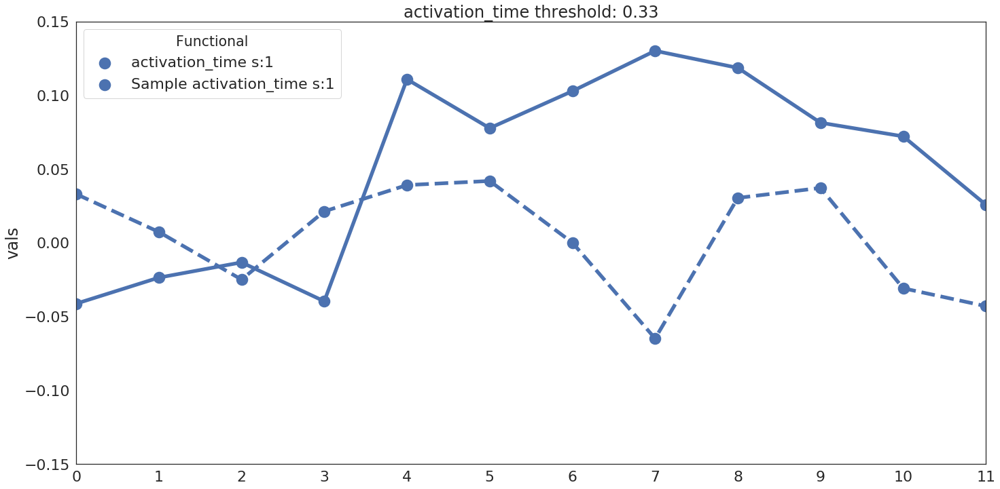

{0: 8, 1: 65, 2: 41, 3: 43, 4: 48, 5: 40, 6: 26, 7: 93, 8: 114, 9: 169, 10: 164, 11: 130, 12: 85, 13: 79, 14: 100, 15: 93}


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

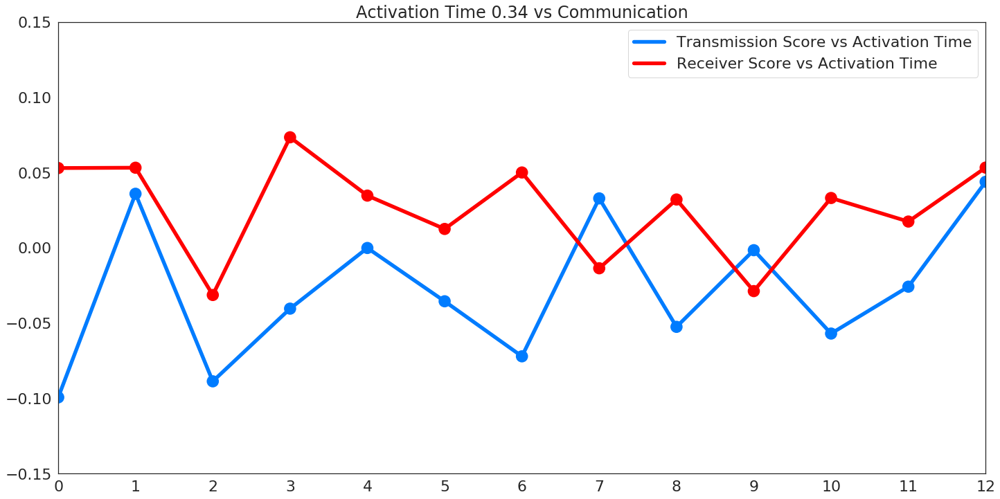

<Figure size 432x288 with 0 Axes>

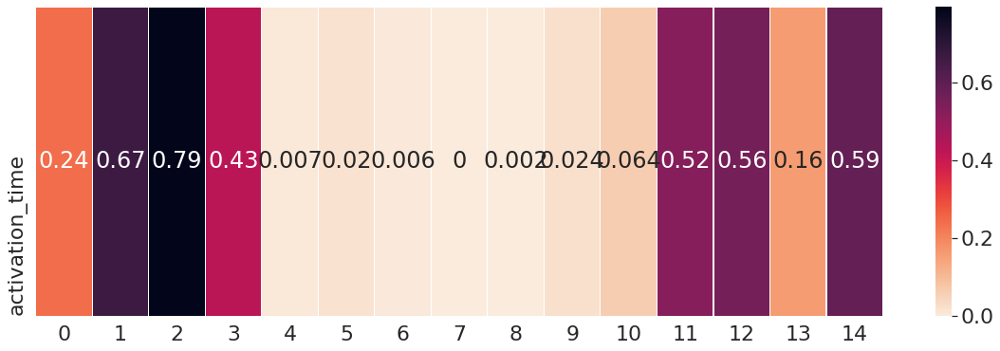

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

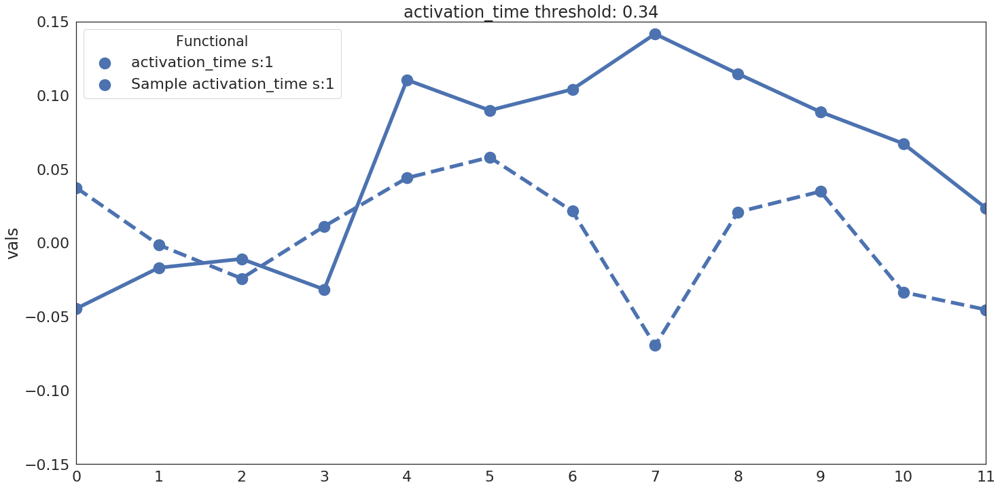

<Figure size 432x288 with 0 Axes>

In [35]:
def apply_custom_filter(ts, custom_filter):
    if custom_filter is not None:
        ts = ts[custom_filter]
        
    return ts
    
def plot_activation_time(threshold):
    #analyze activation time
    analyze_cell_stats = None
    
    analyze_cell_stats_gc_out = analyze_result_df.groupby(['source', 'part']).agg('mean').unstack().loc[:, ['significant']].rename(columns={'significant':'gc_out'})
    analyze_cell_stats_gc_in = analyze_result_df.groupby(['destination', 'part']).agg('mean').unstack().loc[:, ['significant']].rename(columns={'significant':'gc_in'})
    analyze_cell_stats = pd.concat([analyze_cell_stats_gc_in, analyze_cell_stats_gc_out], axis=1, sort=False)
    analyze_cell_stats = analyze_cell_stats.fillna(0)

    activation_time_feature_scores = calc_activation_time_for_parts(activation_time_curve_parts, len(cells_response_curve_parts), threshold)

    for part in activation_time_feature_scores:
        analyze_cell_stats['activation_time', part] = apply_custom_filter(activation_time_feature_scores[part], kpss_and_adf_filter)
    
    gc_sign_perm_test, gc_sign_cc_score = perm_test_seq_cycles(analyze_cell_stats, None, 
                                                               {'gc_out' : gc_out_score_func,
                                                                'gc_in': gc_in_score_func,                                                
                                                                'activation_time': activation_time_score_func}, step=1)
    gc_sign_cc_score

    activation_frame_gc_sign_perm_test, activation_frame_gc_sign_cc_score = perm_test_feature_cycles(analyze_cell_stats, None, 
                                                                            {'gc_out vs activation_time' : [gc_out_score_func, activation_time_score_func],
                                                                             'gc_in vs activation_time': [gc_in_score_func, activation_time_score_func],                                                                         
                                                                             'gc_out vs gc_in': [gc_out_score_func, gc_in_score_func]})

    fig, ax = plt.subplots(figsize=(24,12))

    sns.pointplot(ax=ax, data=activation_frame_gc_sign_cc_score.loc[['gc_out vs activation_time'], :12], color="#007CFF")
    sns.pointplot(ax=ax, data=activation_frame_gc_sign_cc_score.loc[['gc_in vs activation_time'], :12], color="#FF0000")
    #ax.text(7, 0.1,'P-value=[0, 0.019]', fontsize=20) #add text
    ax.set(xticks=range(0, 13))
    ax.set_xlim([0, 12])
    ax.set_ylim([-0.15, 0.15])
    #ax.set(xlabel='correlation between cycles', ylabel='level')
    ax.set_title('Activation Time ' + str(threshold) + ' vs Communication')
    leg = ax.legend(['Transmission Score vs Activation Time', 'Receiver Score vs Activation Time'])
    leg.legendHandles[0].set_color("#007CFF")
    leg.legendHandles[1].set_color("#FF0000")

    fig.savefig(base_path_artifacts + 'activation_time_vs_communication_' + str(threshold) +'.png')
    fig.savefig(base_path_artifacts + 'activation_time_vs_communication_' + str(threshold) + '.eps', format='eps')
    plt.show()
    plt.clf()
    plt.close(fig)

    #plot_memory_extent_over_time(base_path_artifacts, analyze_cell_stats)
    plot_cell_maintain_memory_of_communication_functional_activation_time(base_path_artifacts, analyze_cell_stats, threshold)


for i in range(10, 35):
    plot_activation_time(float(i)/100.0)

## Anslysis of cell state

In [36]:
analyze_cell_stats = None
    
analyze_cell_stats_gc_out = analyze_result_df.groupby(['source', 'part']).agg('mean').unstack().loc[:, ['significant']].rename(columns={'significant':'gc_out'})
analyze_cell_stats_gc_in = analyze_result_df.groupby(['destination', 'part']).agg('mean').unstack().loc[:, ['significant']].rename(columns={'significant':'gc_in'})
analyze_cell_stats = pd.concat([analyze_cell_stats_gc_in, analyze_cell_stats_gc_out], axis=1, sort=False)
analyze_cell_stats = analyze_cell_stats.fillna(0)

In [37]:
gc_sign_perm_test, gc_sign_cc_score = perm_test_seq_cycles(analyze_cell_stats, None, 
                                                           {'gc_out' : gc_out_score_func,
                                                            'gc_in': gc_in_score_func}, step=1)
gc_sign_cc_score

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
gc_out,0.087042,0.181349,0.194978,0.090828,0.175701,0.232887,0.227659,0.302752,0.254356,0.216453,0.234658,0.244282,0.269646,0.049219,-0.009710
gc_in,0.060433,0.216969,0.158115,0.130762,0.147215,0.169725,0.212464,0.247366,0.223843,0.228986,0.223507,0.308651,0.288701,0.011787,-0.023919


In [38]:
def perm_test_feature_cycles(analyze_cell_stats,
                             kpss_and_adf_filter,
                             score_funcs_dict):
    
    number_of_parts = len(analyze_cell_stats.columns.levels[1])
    
    #minus one since it compare part i with part i+1
    perm_test = pd.DataFrame(columns=range(0, number_of_parts))
    cc_score = pd.DataFrame(columns=range(0, number_of_parts))
    
    for score_name, score_funcs in score_funcs_dict.items():        
        score_for_parts_x = score_funcs[0](analyze_cell_stats)
        score_for_parts_y = score_funcs[1](analyze_cell_stats)

        perm_test_leader_scores = {}
        parts_cc_scores = {}

        for part in range(0, number_of_parts):
            xs = score_for_parts_x[part]
            ys = score_for_parts_y[part]        

            xs = apply_custom_filter(xs, kpss_and_adf_filter)
            ys = apply_custom_filter(ys, kpss_and_adf_filter)

            perm_test_leader_scores[part] = exact_mc_perm_test(xs, ys, pearsonr, 1000, None)     

            parts_cc_scores[part] = pearsonr(xs, ys)[0]

        perm_test.loc[score_name] = perm_test_leader_scores
        cc_score.loc[score_name] = parts_cc_scores
    
    return perm_test, cc_score

#### Cross-Correlation map

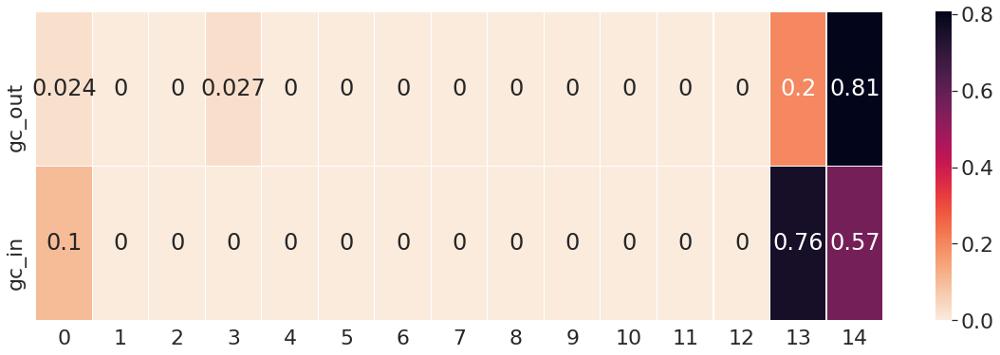

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 432x288 with 0 Axes>

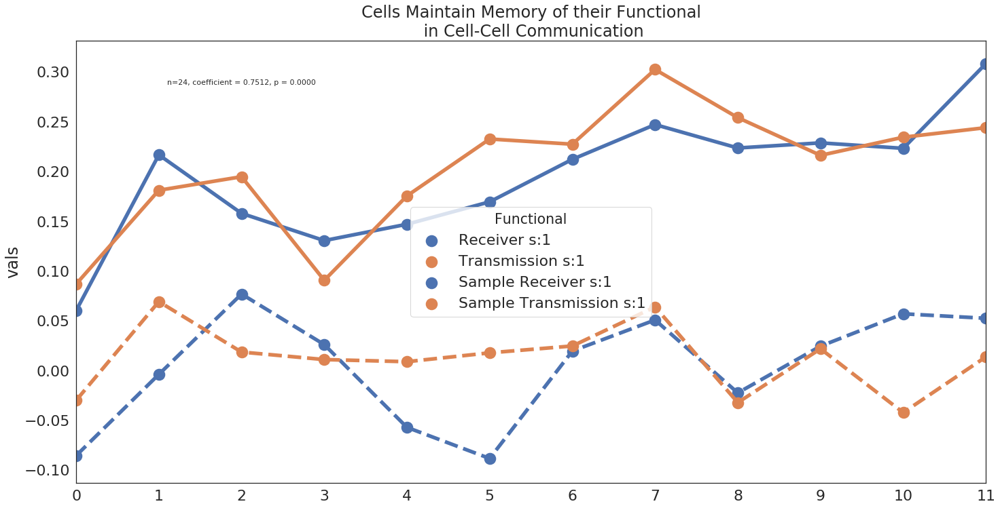

<Figure size 432x288 with 0 Axes>

In [39]:
def plot_memory_extent_over_time_heatmap(base_path_artifacts, suffix, df):
    df_new_index = pd.DataFrame(df, copy=True)
    df_new_index.index=['Δ' + str(i) for i in range(1, df.shape[0] + 1, 1)]
    fig, ax = plt.subplots(figsize=(20,6))
    ax = sns.heatmap(df_new_index, annot=True, cmap="YlGnBu", vmin=0, vmax=0.4)
    fig.savefig(base_path_artifacts + 'memory_extent_over_time_heatmap_' + suffix + '.png')
    fig.savefig(base_path_artifacts + 'memory_extent_over_time_heatmap_' + suffix + '.eps', format='eps')
    plt.clf()
    plt.close(fig)
    
    
def plot_cell_maintain_memory_of_communication_functional(base_path_artifacts, analyze_cell_stats):
    from plots_analyzetools import color_not_significant_red
    
    steps_df = None
    sample_df = None
    
    for step_corr in range(1, 2, 1):            
        gc_sign_perm_test, gc_sign_cc_score = perm_test_seq_cycles(analyze_cell_stats, None, #already filtered
                                                               {'gc_out' : gc_out_score_func,
                                                                'gc_in': gc_in_score_func},
                                                                  step_corr)

        fig, ax = plt.subplots(figsize=(20,6))
        sns.heatmap(gc_sign_perm_test, annot=True, linewidths=.2, cmap = sns.cm.rocket_r)
        fig.savefig(base_path_artifacts + 'cell_maintain_memory_of_communication_functional_perm_test_' + str(step_corr) + '.png')
        fig.savefig(base_path_artifacts + 'cell_maintain_memory_of_communication_functional_perm_test_' + str(step_corr) + '.eps', format='eps')
        plt.show()
        plt.clf()
        plt.close(fig)

        #prepeare data strcuture 
        gc_sign_cc_score_tranpose = gc_sign_cc_score.transpose()[:12][['gc_in', 'gc_out']].rename(columns={'gc_in':'Receiver', 'gc_out':'Transmission'}).stack().to_frame(name='vals')
        gc_sign_cc_score_tranpose['Functional'] = gc_sign_cc_score_tranpose.index.get_level_values(1) + ' s:' + str(step_corr) 
        
        if steps_df is None:
            steps_df = gc_sign_cc_score_tranpose
        else:
            steps_df = pd.concat([steps_df, gc_sign_cc_score_tranpose])
        
        # calculate sample cell organization
        sample_cc_score = sample_perm_seq_cycles(analyze_cell_stats,
                               {'gc_out' : gc_out_score_func,
                                'gc_in': gc_in_score_func},
                                  step_corr)
        
        #prepare sample data strcuture
        sample_cc_score_tranpose = sample_cc_score.transpose()[:12][['gc_in', 'gc_out']].rename(columns={'gc_in':'Sample Receiver', 'gc_out':'Sample Transmission'}).stack().to_frame(name='vals')
        sample_cc_score_tranpose['Functional'] = sample_cc_score_tranpose.index.get_level_values(1) + ' s:' + str(step_corr) 
        
        if sample_df is None:
            sample_df = sample_cc_score_tranpose
        else:
            sample_df = pd.concat([sample_df, sample_cc_score_tranpose])
    
    
    
    sns.set(style='white', font_scale = 2, rc={"lines.linewidth": 3})
    #sns.set_palette("terrain")

    fig, ax = plt.subplots(figsize=(24,12))
    
    sns.pointplot(ax=ax, y='vals', x=steps_df.index.get_level_values(0), data=steps_df, hue='Functional', legend=True)
    sns.pointplot(ax=ax, y='vals', x=sample_df.index.get_level_values(0), data=sample_df, hue='Functional', legend=True, linestyles=["--", "--"])
    #ax.text(7, 0.1,'P-value=[0, 0.019]', fontsize=20) #add text
    ax.set(xticks=range(0, 12))
    ax.set_xlim([0, 11])
    
    import scipy.stats as stats
    
    data_correlation = stats.pearsonr(x=steps_df.index.get_level_values(0), 
                                  y=steps_df['vals'])

    ax.annotate("n={}, coefficient = {:.4f}, p = {:.4f}".format(len(steps_df.index.get_level_values(0)),
                data_correlation[0], data_correlation[1]), 
                xy=(.1, .9), xycoords=ax.transAxes, fontsize=11)
    
    #ax.set(xlabel='correlation between cycles', ylabel='level')
    ax.set_title('Cells Maintain Memory of their Functional\n in Cell-Cell Communication')
    
    fig.savefig(base_path_artifacts + 'cell_maintain_memory_of_communication_functional.png')
    fig.savefig(base_path_artifacts + 'cell_maintain_memory_of_communication_functional.eps', format='eps')
    plt.show()
    plt.clf()
    plt.close(fig)

def plot_memory_extent_over_time(base_path_artifacts, analyze_cell_stats):
    receiver_cycle_df = None
    transmission_cycle_df = None    
    
    for step_corr in range(1, 5, 1):        
        gc_sign_perm_test, gc_sign_cc_score = perm_test_seq_cycles(analyze_cell_stats, None, #already filtered
                                                               {'gc_out' : gc_out_score_func,
                                                                'gc_in': gc_in_score_func},
                                                                  step_corr)

        #prepeare data strcuture
        gc_sign_cc_score = gc_sign_cc_score.transpose()[:12][['gc_in', 'gc_out']].rename(columns={'gc_in':'Receiver ' + str(step_corr), 
                                                                                                  'gc_out':'Transmission ' + str(step_corr)}).transpose()
        gc_sign_cc_score_receiver = pd.DataFrame(gc_sign_cc_score.loc['Receiver ' + str(step_corr), :]).transpose()
        gc_sign_cc_score_transmission = pd.DataFrame(gc_sign_cc_score.loc['Transmission ' + str(step_corr), :]).transpose()
        
        if receiver_cycle_df is None:
            receiver_cycle_df = gc_sign_cc_score_receiver
            transmission_cycle_df = gc_sign_cc_score_transmission        
        else:
            receiver_cycle_df = pd.concat([receiver_cycle_df, gc_sign_cc_score_receiver])
            transmission_cycle_df = pd.concat([transmission_cycle_df, gc_sign_cc_score_transmission])        
    
    #sns.set(style='white', font_scale = 1, rc={"lines.linewidth": 3})
    plot_memory_extent_over_time_heatmap(base_path_artifacts,'Receiver', receiver_cycle_df)
    plot_memory_extent_over_time_heatmap(base_path_artifacts,'Transmission', transmission_cycle_df)

plot_memory_extent_over_time(base_path_artifacts, analyze_cell_stats)
plot_cell_maintain_memory_of_communication_functional(base_path_artifacts, analyze_cell_stats)

## Video of network cell function state over time

In [40]:
import random
import pylab
from matplotlib.pyplot import pause
import networkx as nx
from matplotlib import animation, rc
from IPython.display import HTML
from plots_analyzetools import plot_voronoi, plot_colormap
import matplotlib as mpl

def create_color_mapper(analyze_cell_stats, score_func, cmap):
    minima = 20
    maxima = -20
    
    number_of_parts = len(analyze_cell_stats.columns.levels[1])
    
    for part in range(0, number_of_parts):        
        maxima = np.maximum(maxima, np.max(score_func(analyze_cell_stats)[part]))
        minima = np.minimum(minima, np.min(score_func(analyze_cell_stats)[part]))
    
    norm = mpl.colors.Normalize(vmin=minima, vmax=maxima, clip=True)
    mapper = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
    
    return mapper

def plot_correlation(ax, part):
    sns.set(style='white', font_scale = 2, rc={"lines.linewidth": 4})
    sns.set_palette('Set1')
    
    part_t = 0
    
    if part > 1:
        part_t = part - 1

    sns.lineplot(data=gc_sign_cc_score.transpose().drop(['activation_time', 'centrality'], axis=1)[:part_t],
                markers=True, dashes=False,
                legend=False, 
                ax=ax)
    ax.text(0.6, 0.1,'P-value=[0, 0.019]', fontsize=20, transform=ax.transAxes) #add text
    ax.set(xticks=range(0, 12))
    ax.set_ylim([0, 0.35])
    ax.set_xlim([0, 11])
    ax.set_title("Cross-Correlation(Cycle %d,  Cycle %d)"%(part_t, part_t + 1), fontweight="bold")

    ax.legend(loc='upper left', labels=['Transmission', 'Receiver'])

def make_movie(analyze_cell_stats, score_func, metric_name, base_path_artifacts, colormap=mpl.cm.Blues):
    # Build plot
    fig, axs = plt.subplots(figsize=(12,10), nrows=1, ncols=1)
    
    score_for_parts = score_func(analyze_cell_stats)
    mapper = create_color_mapper(analyze_cell_stats, score_func, cmap=colormap)
    plot_colormap(mapper)
    #plt.suptitle('Cells Maintain Memory of their Functional\n in Cell-Cell Communication')
    #plt.subplots_adjust(top=0.80)

    def update(part):        
        data = score_for_parts[part]
        #data = apply_custom_filter(data, kpss_and_adf_filter)
        #custom_filter = np.greater(data, np.zeros((len(data))))
        custom_filter = data != 0
        
        custom_filter = custom_filter.reindex(list(range(int(np.min(np.hstack(regions))),
                                                         int(np.max(np.hstack(regions)))+1)), fill_value=False)
        
        plot_voronoi(axs, mapper, regions, vertices, vor, centroids, 
                         data,
                         custom_filter)

        # Scale plot ax
        axs.set_title("Cycle %d"%(part), fontweight="bold")
        axs.set_xticks([])
        axs.set_yticks([])
        fig.savefig(base_path_artifacts + metric_name + '_snapshot_' + str(part) + '_cells_memory.png')
        fig.savefig(base_path_artifacts + metric_name + '_snapshot_' + str(part) + '_cells_memory.eps', format='eps')
        
        #plot_correlation(axs[0], part)

    anim = animation.FuncAnimation(fig, update, frames=13, interval=500, repeat=True)
    
    anim.save(base_path_artifacts + metric_name + '_cells_memory.mp4')

    return HTML(anim.to_html5_video())

## Enrichment of Hub

In [41]:
## define the roles
from sklearn.preprocessing import StandardScaler  # For scaling dataset
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline

def standard_df(df):
    pipe_norm = make_pipeline(StandardScaler())
    pipe_norm.fit(df)
    transformed_norm = pipe_norm.transform(df)
    
    return transformed_norm, pipe_norm

def transle_role(role):
    if (role == 0):
        return 'Hub'
    elif (role == 1):
        return 'Leader'        
    elif (role == 2):
        return 'Follower'        
    elif (role == 3):
        return 'Normal'        
    else:
        return 'Individual'        

def get_role(row, threshold):    
    if (row[0] >= threshold and row[1] >= threshold):
        return 0
    elif (row[0] <= -threshold and row[1] <= -threshold):
        return 4
    elif (row[0] >= threshold and row[1] < threshold):
        return 2
    elif (row[0] < threshold and row[1] >= threshold):
        return 1
    else:
        return 3

def plot_data(dpc, con_analyze_cell_stats_flat):
    fig = plt.figure(figsize=(15, 5))
    ax = []    
    ax.append(fig.add_subplot(1, 3, 1))
    ax.append(fig.add_subplot(1, 3, 2))
    ax.append(fig.add_subplot(1, 3, 3))
    ax[0].scatter(con_analyze_cell_stats_flat[:, 0], con_analyze_cell_stats_flat[:, 1], s=40)
    ax[0].scatter(con_analyze_cell_stats_flat[dpc.clusters, 0], con_analyze_cell_stats_flat[dpc.clusters, 1],  s=50, c="red")
    ax[1].scatter(con_analyze_cell_stats_flat[:, 0], con_analyze_cell_stats_flat[:, 1], s=40, c=dpc.density)
    ax[2].scatter(con_analyze_cell_stats_flat[:, 0], con_analyze_cell_stats_flat[:, 1], s=40, c=dpc.membership, cmap=mpl.cm.cool)
    for _ax in ax:
        #_ax.plot([-mux, -mux], [-1.5 * muy, 1.5 * muy], '--', linewidth=2, color="red")
        #_ax.plot([mux, mux], [-1.5 * muy, 1.5 * muy], '--', linewidth=2, color="red")
        #_ax.plot([-1.5 * mux,  1.5 * mux], [-muy, -muy], '--', linewidth=2, color="red")
        #_ax.plot([-1.5 * mux,  1.5 * mux], [muy, muy], '--', linewidth=2, color="red")
        _ax.set_xlabel(r"gc in-degree", fontsize=15)
        _ax.set_ylabel(r"gc out-degree", fontsize=15)    
        _ax.tick_params(labelsize=10)
        #_ax.set_xlim([-7, 7])
        #_ax.set_ylim([-7, 7])
        _ax.set_aspect('equal')
    fig.tight_layout()
    
analyze_cell_stats_flat = analyze_cell_stats.stack()

con_analyze_cell_stats_flat = analyze_cell_stats_flat[['gc_in','gc_out']].values.copy(order='C')

transformed_norm_df, pipe_norm_df = standard_df(analyze_cell_stats_flat[['gc_in','gc_out']].loc[pd.IndexSlice[:, :], :])

analyze_cell_stats_flat['Manual_0.5'] = np.apply_along_axis(lambda row: get_role(row, 0.5), 1, transformed_norm_df)

# Clustring

## Manual

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

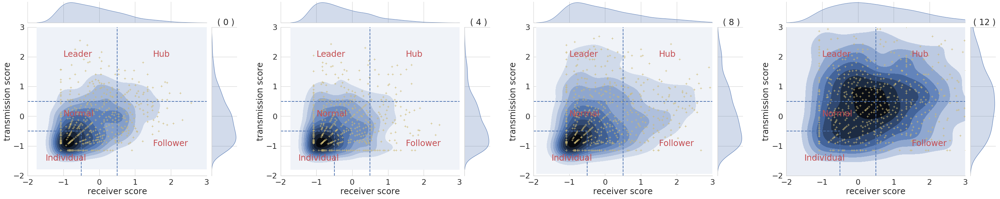

<Figure size 432x288 with 0 Axes>

In [42]:
from module.plothelpers import SeabornFig2Grid as sfg
import matplotlib.gridspec as gridspec
import math

def print_2d_dist(base_path_artifacts, cut, df):
    idx = pd.IndexSlice
    sns.set(style='whitegrid', font_scale = 2, rc={"lines.linewidth": 1})
    cycles = len(df.index.levels[1]) - 1
    
    axis_lim = [-2, 3]
    
    cycle_div_factor = 4
    
    fig = plt.figure(figsize=(40, 8))
    
    gs = gridspec.GridSpec(1, math.ceil(cycles / cycle_div_factor))
    
    for cycle_index in range(0, cycles, cycle_div_factor):        
        g = sns.jointplot(x="gc_in", y="gc_out", 
                          data=df.loc[idx[:, [cycle_index, cycle_index]], ['gc_in', 'gc_out']], kind="kde",
                         xlim=axis_lim,
                         ylim=axis_lim, cbar=True, shade_lowest=True)\
                    .plot_joint(plt.scatter, c="y", s=30, linewidth=1, marker="+")\
                    .set_axis_labels("receiver score", "transmission score")
        
        g.ax_joint.plot([cut,cut], axis_lim, 'b--', linewidth = 2)
        g.ax_joint.plot(axis_lim ,[cut,cut], 'b--', linewidth = 2)
        g.ax_joint.plot([-cut,-cut], [axis_lim[0],-cut], 'b--', linewidth = 2)
        g.ax_joint.plot([axis_lim[0],-cut] ,[-cut,-cut], 'b--', linewidth = 2)
        g.ax_joint.text(-1,2,'Leader', color="r")
        g.ax_joint.text(1.5,-1,'Follower', color="r")
        g.ax_joint.text(1.5,2,'Hub', color="r")
        g.ax_joint.text(-1.5,-1.5,'Individual', color="r")
        g.ax_joint.text(-1,0,'Normal', color="r")
        
        plt.title("  ( " +  str(cycle_index) + " ) ", x=1.10)
    
        sfg(g, fig, gs[(int)(cycle_index / cycle_div_factor)])
    
    gs.tight_layout(fig, pad=0.4, w_pad=2, h_pad=1.0)
    #gs.update(top=6)
    
    fig.savefig(base_path_artifacts + '2d_roles_dist_over_time.png')
    plt.savefig(base_path_artifacts + '2d_roles_dist_over_time.eps', format='eps')
    plt.show()
    plt.clf()
    plt.close(fig)    

print_2d_dist(base_path_artifacts, 0.5, pd.DataFrame(transformed_norm_df, index=analyze_cell_stats_flat.index, columns=analyze_cell_stats_flat[['gc_in','gc_out']].columns))

## Movie of 2D Roles

In [43]:
def make_movie_2d_dist(base_path_artifacts, cut, df, cycles):
    idx = pd.IndexSlice
    sns.set(style='white', font_scale = 2, rc={"lines.linewidth": 1})
    axis_lim = [-2, 3]
    
    def get_data(df, cycle_index):
        return df.loc[idx[:, [cycle_index, cycle_index]], ['gc_in', 'gc_out']]
    
    def prep_axes(g, xlim, ylim):
        g.ax_joint.clear()
        g.ax_joint.set_xlim(xlim)
        g.ax_joint.set_ylim(ylim)
        g.ax_marg_x.clear()
        g.ax_marg_x.set_xlim(xlim)
        g.ax_marg_y.clear()
        g.ax_marg_y.set_ylim(ylim)        
        plt.setp(g.ax_marg_x.get_xticklabels(), visible=False)
        plt.setp(g.ax_marg_y.get_yticklabels(), visible=False)
        plt.setp(g.ax_marg_x.yaxis.get_majorticklines(), visible=False)
        plt.setp(g.ax_marg_x.yaxis.get_minorticklines(), visible=False)
        plt.setp(g.ax_marg_y.xaxis.get_majorticklines(), visible=False)
        plt.setp(g.ax_marg_y.xaxis.get_minorticklines(), visible=False)
        plt.setp(g.ax_marg_x.get_yticklabels(), visible=False)
        plt.setp(g.ax_marg_y.get_xticklabels(), visible=False)
                      
    # Build plot
    fig = plt.figure(figsize=(10,10))
    
    g = sns.JointGrid(x=get_data(df, 0)['gc_in'], y=get_data(df, 0)['gc_out'])
    
    def plot_roles_grid(ax, cycle_index):
        ax.plot([cut,cut], axis_lim, 'b--', linewidth = 2)
        ax.plot(axis_lim ,[cut,cut], 'b--', linewidth = 2)
        ax.plot([-cut,-cut], [axis_lim[0],-cut], 'b--', linewidth = 2)
        ax.plot([axis_lim[0],-cut] ,[-cut,-cut], 'b--', linewidth = 2)
        ax.text(-2,2.8,'leader', color="r")
        ax.text(1.3,-2,'follower', color="r")
        ax.text(1.3,2.8,'hub', color="r")
        ax.text(-2,-2,'individual', color="r")
        ax.text(-1,0,'common', color="r")

    def update(cycle_index):
        if cycle_index >= cycles:
            cycle_index = cycles - (cycle_index - (cycles - 2))
        data = get_data(df, cycle_index)
        g.x = data['gc_in']
        g.y = data['gc_out']
        prep_axes(g, axis_lim, axis_lim)
        g.plot_joint(sns.kdeplot, legend=False)
        g.plot_joint(plt.scatter, c="y", s=30, linewidth=1, marker="+")
        g.plot_marginals(sns.kdeplot, color="m", shade=True, legend=False)
        g.set_axis_labels("Receiver score", "Transmission score")
        
        plot_roles_grid(g.ax_joint, cycle_index)
        plt.title("C: %d"%(cycle_index), fontweight="bold")
        
    anim = animation.FuncAnimation(g.fig, update, frames=cycles, interval=500, repeat=True)
    
    anim.save(base_path_artifacts + '_2d_dist_movie.mp4')

    return HTML(anim.to_html5_video())

<Figure size 720x720 with 0 Axes>

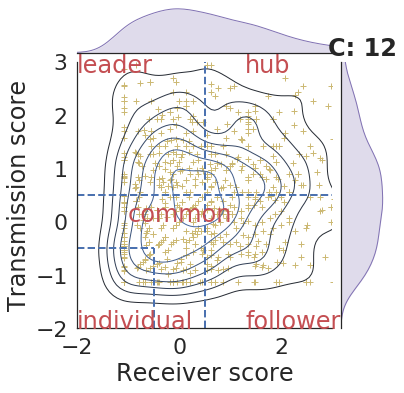

In [44]:
make_movie_2d_dist(base_path_artifacts, 
                   0.5, 
                   pd.DataFrame(transformed_norm_df, 
                                index=analyze_cell_stats_flat.index, 
                                columns=analyze_cell_stats_flat[['gc_in','gc_out']].columns), 13)

## 2D Heatmap Roles Distribution

In [45]:
from module.plothelpers import SeabornFig2Grid as sfg
import matplotlib.gridspec as gridspec
import math

def unifi_color_map(vmin, vmax):
    import matplotlib as mpl
    
    norm = mpl.colors.LogNorm(vmin=vmin, vmax=vmax)
    
    return norm

def print_2d_heatmap(base_path_artifacts, cut, df):    
    idx = pd.IndexSlice
    #sns.set(style='whitegrid', font_scale = 2, rc={"lines.linewidth": 1})
    cycles = len(df.index.levels[1]) - 1
    
    axis_lim = [-2, 3]
    
    cycle_div_factor = 4
    
    bins = np.linspace(-2, 3, num=25)
    
    maximum_value_bin = 0.0
    
    #get maximum.minimum value
    for cycle_index in range(0, cycles, cycle_div_factor):
        cycle_data = df.loc[idx[:, [cycle_index, cycle_index]], ['gc_in', 'gc_out']]
        h, xed, yed = np.histogram2d(x=cycle_data['gc_in'],y=cycle_data['gc_out'], bins=bins)
        maximum_value_bin = max(maximum_value_bin, np.max(h))
        
    norm = unifi_color_map(vmin=1, vmax=maximum_value_bin)
    
    
    fig, ax = plt.subplots(figsize=(40, 8), ncols=math.ceil(cycles / cycle_div_factor), nrows=1 , sharey=True)
    
    #color_map_hist = plt.cm.jet
    #color_map_hist.set_under('w',0)
    
    for cycle_index in range(0, cycles, cycle_div_factor):
        cycle_data = df.loc[idx[:, [cycle_index, cycle_index]], ['gc_in', 'gc_out']]        
        
        plot_index = (int)(cycle_index / cycle_div_factor)
        
        g = ax[plot_index].hist2d(x=cycle_data['gc_in'],y=cycle_data['gc_out'], bins=(bins, bins), cmap='Blues', norm=norm)
        
        ax[plot_index].plot([cut,cut], axis_lim, 'b--', linewidth = 2)
        ax[plot_index].plot(axis_lim ,[cut,cut], 'b--', linewidth = 2)
        ax[plot_index].plot([-cut,-cut], [axis_lim[0],-cut], 'b--', linewidth = 2)
        ax[plot_index].plot([axis_lim[0],-cut] ,[-cut,-cut], 'b--', linewidth = 2)
        ax[plot_index].text(-1,2,'Leader', color="r")
        ax[plot_index].text(1.5,-1,'Follower', color="r")
        ax[plot_index].text(1.5,2,'Hub', color="r")
        ax[plot_index].text(-1.5,-1.5,'Individual', color="r")
        ax[plot_index].text(-1,0,'Normal', color="r")
        
        #plt.title("  ( " +  str(cycle_index) + " ) ", x=1.10)
    
    #fig.colorbar(ax[1].collections[0], cax=ax[2])
        
    plt.colorbar(g[3], ax=ax[(int)(cycles / cycle_div_factor)])
    plt.tight_layout()
    
    fig.savefig(base_path_artifacts + '2d_roles_2d_heatmap_over_time.png')
    plt.clf()
    plt.close(fig)

print_2d_heatmap(base_path_artifacts, 0.5, pd.DataFrame(transformed_norm_df, index=analyze_cell_stats_flat.index, columns=analyze_cell_stats_flat[['gc_in','gc_out']].columns))

## Roles Over Time

[0.10631649 0.16008734 0.15822538 0.36758212 0.20778867]
[0.10631649 0.16008734 0.15822538 0.36758212 0.20778867]
[0.12651286 0.15081316 0.14948941 0.33254539 0.24063918]
[[0.0160055  0.0190798  0.01891233 0.04207127 0.03044395]
 [0.0190798  0.02274461 0.02254497 0.05015222 0.03629156]
 [0.01891233 0.02254497 0.02234708 0.04971201 0.03597301]
 [0.04207127 0.05015222 0.04971201 0.11058643 0.08002345]
 [0.03044395 0.03629156 0.03597301 0.08002345 0.05790722]]
[[0.12651286 0.15081316 0.14948941 0.33254539 0.24063918]
 [0.12651286 0.15081316 0.14948941 0.33254539 0.24063918]
 [0.12651286 0.15081316 0.14948941 0.33254539 0.24063918]
 [0.12651286 0.15081316 0.14948941 0.33254539 0.24063918]
 [0.12651286 0.15081316 0.14948941 0.33254539 0.24063918]]


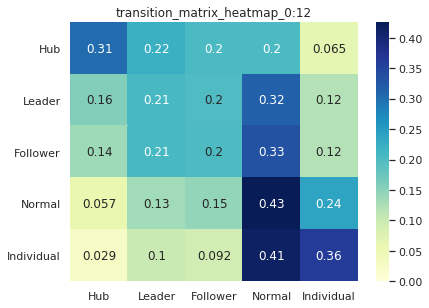

<Figure size 432x288 with 0 Axes>

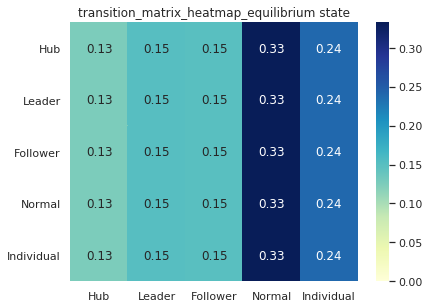

<Figure size 432x288 with 0 Axes>

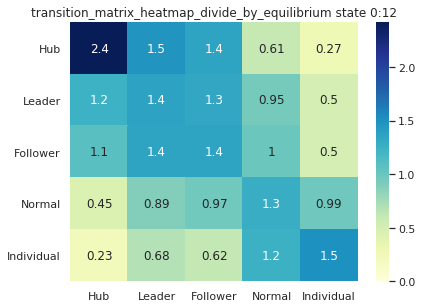

<Figure size 432x288 with 0 Axes>

In [46]:
def transition_matrix(data):
    number_of_states = data.values.max() + 1
    
    M = np.zeros((number_of_states, number_of_states))
    
    for node_idx in range(data.shape[1]):
        for (i,j) in zip(data.iloc[:, node_idx], data.iloc[1:, node_idx]):
            M[i][j] += 1

    #now convert to probabilities:
    for row in M:
        s = sum(row)
        if s > 0:
            row[:] = [f/s for f in row]
    return M

def distribution_cell_states(cell_states):
    return cell_states / sum(cell_states)

def plot_frequency_of_roles(base_path_artifacts, analyze_cell_stats_flat, threshold_i=0.5):
    state_matrix = analyze_cell_stats_flat.unstack()['Manual_' + str(threshold_i)].transpose()
    
    ## frequency_of_roles
    unique_elements, counts_elements = np.unique(state_matrix.values.flatten(), return_counts=True)

    sns.set(style='whitegrid', font_scale = 2, rc={"lines.linewidth": 4})

    fig, ax = plt.subplots(figsize=(12,6))
    plt.title('Threshold ' + str(threshold_i))
    ax = sns.barplot(x=unique_elements, y=counts_elements / sum(counts_elements))
    plt.ylabel('Frequency')
    plt.xlabel('Cluster')
    
    fig.savefig(base_path_artifacts + 'frequency_of_roles.png')
    plt.clf()
    plt.close(fig)

def plot_roles_lines_over_time(base_path_artifacts, analyze_cell_stats_flat, cycles, threshold_i=0.5):
    import scipy.stats as stats
    state_matrix = analyze_cell_stats_flat.unstack()['Manual_' + str(threshold_i)].transpose()

    ## frequency_of_roles
    unique_elements, counts_elements = np.unique(state_matrix.values.flatten(), return_counts=True)
    
    ## Frequency mode during time
    state_matrix_pp = state_matrix.transpose().apply(lambda cell_states:                               
                                   np.bincount(cell_states, minlength=len(unique_elements)), 
                               axis=0)

    state_matrix_pp = state_matrix_pp.round(2).apply(lambda cell_states: distribution_cell_states(cell_states), axis=0).round(2)
    
    state_matrix_pp_t = state_matrix_pp.transpose()
    
    state_matrix_pp_t = state_matrix_pp_t.rename(columns={0: transle_role(0), 
                                                          1: transle_role(1), 
                                                          2: transle_role(2),
                                                          3: transle_role(3),
                                                          4: transle_role(4)})
    
    state_matrix_pp_t['Cycle'] = state_matrix_pp_t.index.astype(int)
    
    state_matrix_pp_t = state_matrix_pp_t[state_matrix_pp_t['Cycle'] < cycles]
    
    #plot roles
    state_matrix_pp_t_melt = pd.melt(state_matrix_pp_t, id_vars=['Cycle'], value_vars=['Hub', 'Individual', 'Follower', 'Leader', 'Normal'],
                               var_name='Role', value_name='Portion')
    
    sns.set(style='whitegrid', font_scale = 2, rc={"lines.linewidth": 2})

    fig, ax = plt.subplots(figsize=(12,8))
    ax = sns.pointplot(ax=ax, x='Cycle', y='Portion', hue='Role' ,data=state_matrix_pp_t_melt[state_matrix_pp_t_melt['Cycle'] < cycles], legend=True)
    
    fig.savefig(base_path_artifacts + 'roles_lines_over_time.png')
    fig.savefig(base_path_artifacts + 'roles_lines_over_time.eps', format='eps')
    plt.show()
    plt.clf()
    plt.close(fig)
    
    sns.set(style='white', font_scale = 1.5, rc={"lines.linewidth": 3})
        
    #plot p(leader) * p(follower) vs p(hub)    
    state_matrix_pp_t['P(Leader+Hub)*P(Follower+Hub)'] = (state_matrix_pp_t['Follower'] + state_matrix_pp_t['Hub'])*(state_matrix_pp_t['Leader']+state_matrix_pp_t['Hub'])

    fig, ax = plt.subplots(figsize=(8,8))
    ax = sns.scatterplot(ax=ax, x='P(Leader+Hub)*P(Follower+Hub)', y='Hub', hue='Cycle', data=state_matrix_pp_t, s=100, palette=sns.color_palette('spring', state_matrix_pp_t.shape[0]))
    
    ticks_range = np.arange(0.0, 0.5, step=0.1)
    
    ax.set(xlim=(0.0, 0.3), ylim=(0.0, 0.3), xticks=ticks_range, yticks=ticks_range)
    
    plt.plot(ticks_range, ticks_range, 'r--')
    
    data_correlation = stats.pearsonr(x=state_matrix_pp_t['P(Leader+Hub)*P(Follower+Hub)'], 
                                  y=state_matrix_pp_t['Hub'])

    ax.annotate("n={}, coefficient = {:.4f}, p = {:.4f}".format(len(state_matrix_pp_t),
                data_correlation[0], data_correlation[1]), 
                xy=(.3, .9), xycoords=ax.transAxes, fontsize=11)
    
    from scipy.stats import wilcoxon
    
    ax.annotate("wilcoxon p = {:.4f}".format(wilcoxon(state_matrix_pp_t['P(Leader+Hub)*P(Follower+Hub)'],
                                                state_matrix_pp_t['Hub'])[1]),
                xy=(.3, .6), xycoords=ax.transAxes, fontsize=11)
    
    plt.tight_layout(pad=0.4, w_pad=2, h_pad=1.0)

    
    fig.savefig(base_path_artifacts + 'roles_leadership_followership_vs_hub.png')
    plt.savefig(base_path_artifacts + 'roles_leadership_followership_vs_hub.eps', format='eps')
    plt.show()
    plt.clf()
    plt.close(fig)
    
    #plot p(leader) vs p(follower)    
    sns.set(style='whitegrid', font_scale = 2, rc={"lines.linewidth": 4})

    fig, ax = plt.subplots(figsize=(12,6))
    ax = sns.scatterplot(ax=ax, x='Follower', y='Leader' ,data=state_matrix_pp_t, s=100)
    
    ticks_range = np.arange(0.0, 0.5, step=0.1)
    
    ax.set(xlim=(0.0, 0.4), ylim=(0.0, 0.4), xticks=ticks_range, yticks=ticks_range)
    
    fig.savefig(base_path_artifacts + 'roles_leadership_vs_followership.png')
    plt.clf()
    plt.close(fig)

def plot_transition_matrix_heatmap(base_path_artifacts, suffix, df):
    sns.set(style='white', font_scale = 1, rc={"lines.linewidth": 1})
    
    roles_list = [transle_role(x) for x in range(5)]
    fig, ax = plt.subplots()
    ax = sns.heatmap(pd.DataFrame(df, index=roles_list, columns=roles_list) , annot=True, cmap="YlGnBu", vmin=0)
    plt.tight_layout(pad=0.4, w_pad=2, h_pad=1.0)
    fig.savefig(base_path_artifacts + 'transition_matrix_heatmap_' + suffix + '.png')
    plt.savefig(base_path_artifacts + 'transition_matrix_heatmap_.' + suffix + '.eps', format='eps')
    plt.title('transition_matrix_heatmap_' + suffix)
    plt.show()
    plt.clf()
    plt.close(fig)
    
def calc_stat_dist(transition_matrix):
    'https://stackoverflow.com/questions/31791728/python-code-explanation-for-stationary-distribution-of-a-markov-chain'
    Q = transition_matrix
    
    #We have to transpose so that Markov transitions correspond to right multiplying by a column vector.  np.linalg.eig finds right eigenvectors.
    evals, evecs = np.linalg.eig(Q.T)
    evec1 = evecs[:,np.isclose(evals, 1)]

    #Since np.isclose will return an array, we've indexed with an array
    #so we still have our 2nd axis.  Get rid of it, since it's only size 1.
    evec1 = evec1[:,0]

    stationary = evec1 / evec1.sum()

    #eigs finds complex eigenvalues and eigenvectors, so you'll want the real part.
    stationary = stationary.real
    
    print(stationary)
    print(stationary.dot(Q))
    
def plot_transition_matrix(base_path_artifacts, analyze_cell_stats_flat, upper_bound_cycle, threshold_i=0.5):
    state_matrix = analyze_cell_stats_flat.unstack()['Manual_' + str(threshold_i)].transpose()

    ## frequency_of_roles
    unique_elements, counts_elements = np.unique(state_matrix.values.flatten(), return_counts=True)
    
    pd.DataFrame(transition_matrix(state_matrix.iloc[:upper_bound_cycle, :])).to_excel(base_path_artifacts + "transition_matrix.xlsx")
    
    calc_stat_dist(transition_matrix(state_matrix.iloc[:upper_bound_cycle, :]))
    
    global_frequency_matrix = counts_elements / sum(counts_elements)
    
    expected_frequency_matrix = np.outer(global_frequency_matrix,global_frequency_matrix)
    
    print(global_frequency_matrix)
    
    print(expected_frequency_matrix)
    
    expected_frequency_matrix /= global_frequency_matrix[:, None]
    
    print(expected_frequency_matrix)
    
    #pd.DataFrame(transition_matrix(state_matrix.iloc[:-1, :])).to_excel(base_path_artifacts + "transition_matrix_without_last_cycle.xlsx")
    
    #plot_transition_matrix_heatmap(base_path_artifacts, 'without_last_cycle', transition_matrix(state_matrix.iloc[:-1, :]))
    
    plot_transition_matrix_heatmap(base_path_artifacts, str(0) + ':' + str(upper_bound_cycle - 1), transition_matrix(state_matrix.iloc[:upper_bound_cycle, :]))
    
    plot_transition_matrix_heatmap(base_path_artifacts, 'equilibrium state', expected_frequency_matrix)
    
    plot_transition_matrix_heatmap(base_path_artifacts, 'divide_by_equilibrium state ' +  str(0) + ':' + str(upper_bound_cycle - 1), 
                                   np.divide(transition_matrix(state_matrix.iloc[:upper_bound_cycle, :]), expected_frequency_matrix))
    
    return np.divide(transition_matrix(state_matrix.iloc[:upper_bound_cycle, :]), expected_frequency_matrix)
    
    #for cycle_i in range(0, upper_bound_cycle - 1):
    #    plot_transition_matrix_heatmap(base_path_artifacts, str(cycle_i) + ':' + str(cycle_i + 1), transition_matrix(state_matrix.iloc[cycle_i:cycle_i+2, :]))
    
    
def plot_transition_matrix_normalize(base_path_artifacts, analyze_cell_stats_flat, upper_bound_cycle, threshold_i=0.5):    
    state_matrix = analyze_cell_stats_flat.unstack()['Manual_' + str(threshold_i)].transpose()

    ## frequency_of_roles
    unique_elements, counts_elements = np.unique(state_matrix.values.flatten(), return_counts=True)
    
    frequency_of_roles = counts_elements / sum(counts_elements)
    
    #pd.DataFrame(transition_matrix(state_matrix.iloc[:-1, :]) / frequency_of_roles).to_excel(base_path_artifacts + "transition_matrix_normalize_without_last_cycle.xlsx")
    
    pd.DataFrame(transition_matrix(state_matrix.iloc[:upper_bound_cycle, :])/ frequency_of_roles).to_excel(base_path_artifacts + "transition_matrix_normalize.xlsx")
    
    #plot_transition_matrix_heatmap(base_path_artifacts, 'without_last_cycle_normalize', transition_matrix(state_matrix.iloc[:-1, :]) / frequency_of_roles)
    plot_transition_matrix_heatmap(base_path_artifacts, 'normalize', transition_matrix(state_matrix.iloc[:, :])/ frequency_of_roles)
    

def plot_roles_lines_over_time_i(base_path_artifacts, analyze_cell_stats_flat, threshold_i=0.5):
    state_matrix = analyze_cell_stats_flat.unstack()['Manual_' + str(threshold_i)]
    
    state_matrix = state_matrix.iloc[:, 0]
    
    state_matrix[state_matrix != 0] = -1
    
    print(state_matrix)
    
non_equilibrium_state_vs_equilibrium_state_matrix = plot_transition_matrix(base_path_artifacts, analyze_cell_stats_flat, 13)
#plot_transition_matrix_normalize(base_path_artifacts, analyze_cell_stats_flat, 13)
#plot_roles_lines_over_time(base_path_artifacts, analyze_cell_stats_flat, 13)

# Transition Matrix Network X

In [47]:
non_equilibrium_state_vs_equilibrium_state_matrix

array([[2.41521342, 1.47349356, 1.36266311, 0.6125591 , 0.26934439],
       [1.23654676, 1.3696995 , 1.33557473, 0.95125467, 0.50283828],
       [1.08862096, 1.36698354, 1.3504766 , 1.0032269 , 0.50123139],
       [0.45000555, 0.89148967, 0.97469122, 1.27867392, 0.9877735 ],
       [0.23084591, 0.68136127, 0.61503748, 1.24740513, 1.50131978]])

{'Hub': array([1., 0.]), 'Leader': array([0.30901695, 0.95105657]), 'Follower': array([-0.80901706,  0.58778526]), 'Normal': array([-0.809017  , -0.58778532]), 'Individual': array([ 0.3090171 , -0.95105651])}
['Hub', 'Leader', 'Follower', 'Normal', 'Individual']


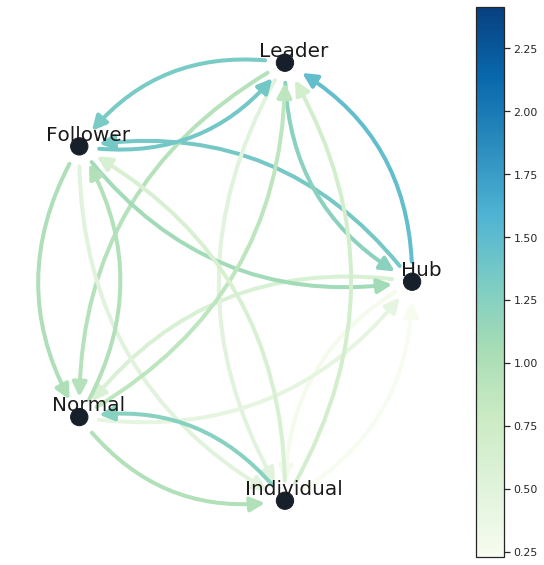

In [48]:
import matplotlib.pyplot as plt
import networkx as nx

vector_names = ['Hub', 'Leader', 'Follower', 'Normal', 'Individual']

non_equilibrium_state_vs_equilibrium_state_matrix_dataframe = pd.DataFrame(non_equilibrium_state_vs_equilibrium_state_matrix, 
                          columns=vector_names, index=vector_names)

#extracts the indices from the correlation matrix, which are the stocks
measures = non_equilibrium_state_vs_equilibrium_state_matrix_dataframe.index.values

#Changes from dataframe to matrix, so it is easier to create a graph with networkx
cor_matrix = np.asmatrix(non_equilibrium_state_vs_equilibrium_state_matrix_dataframe)

G = nx.from_numpy_matrix(cor_matrix, create_using=nx.MultiDiGraph)
G = nx.relabel_nodes(G,lambda x: measures[x])
#shows the edges with their corresponding weights
G.edges(data=True)

def create_corr_network_1(G):
    #crates a list for edges and for the weights
    edges,weights = zip(*nx.get_edge_attributes(G,'weight').items())

    #positions
    positions=nx.circular_layout(G)
    
    print(positions)
    
    #Figure size
    plt.figure(figsize=(8,8))
    
    print(G.nodes())
    colors_map = ['#17202A', '#17202A', '#17202A', '#17202A', '#17202A']

    #draws nodes
    nx.draw_networkx_nodes(G,positions,node_color=colors_map,
                           node_size=300,alpha=1)
    
    #Styling for labels
    nx.draw_networkx_labels(G, dict((key, value + 0.05) for key, value in positions.items()), 
                            font_size=20, 
                            font_family='sans-serif')
        
    #draws the edges
    nx.draw_networkx_edges(G, positions, edgelist=edges,style='solid',
                      ###adds width=weights and edge_color = weights 
                      ###so that edges are based on the weight parameter 
                      ###edge_cmap is for the color scale based on the weight
                      ### edge_vmin and edge_vmax assign the min and max weights for the width
                      width=4, edge_color = weights, edge_cmap = plt.cm.GnBu,
                      edge_vmin = min(weights), edge_vmax=max(weights), 
                      arrows=True, arrowsize=30, connectionstyle='arc3,rad=0.3', 
                      min_source_margin=20, 
                      min_target_margin=20)
    
    sm = plt.cm.ScalarMappable(cmap=plt.cm.GnBu, norm=plt.Normalize(vmin = min(weights), vmax=max(weights)))
    sm._A = []
    plt.colorbar(sm)
    
    plt.tight_layout(pad=1, w_pad=4, h_pad=1.0)
    
    # displays the graph without axis
    plt.axis('off')    
    #saves image
    #plt.savefig(images_eps_base_path + 'measures_corr.eps', format='eps')
    plt.show()

create_corr_network_1(G)

In [49]:
nx.write_gml(G, base_path_artifacts + 'non_equilibrium_state_vs_equilibrium_state_matrix.gml')

## Figure 4

### hub/indivdual ratio over cycle

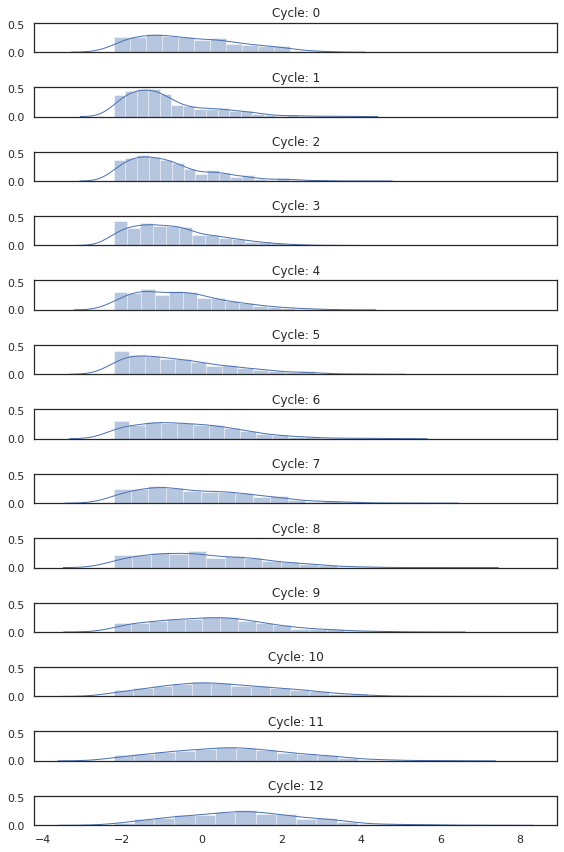

In [50]:
f, axes = plt.subplots(13, 1, figsize=(8, 12), sharex=True, sharey=True)

for cycle in range(0, 13):
    df_tr_re_score_cycle = pd.DataFrame(transformed_norm_df, 
                                    index=analyze_cell_stats_flat.index, 
                                    columns=analyze_cell_stats_flat[['gc_in','gc_out']].columns).loc[pd.IndexSlice[:,cycle:cycle], :]
    df_tr_re_score_cycle = df_tr_re_score_cycle['gc_out'] + df_tr_re_score_cycle['gc_in']
    
    sns.distplot(df_tr_re_score_cycle, ax=axes[cycle])
    axes[cycle].title.set_text('Cycle: ' + str(cycle))

plt.tight_layout()

/home/zamiram/anaconda3/envs/cyclic-synchronization-research-env/lib/python3.7/site-packages/ipykernel_launcher.py:43: FutureWarning: This dataframe has a column name that matches the 'value_name' column name of the resulting Dataframe. In the future this will raise an error, please set the 'value_name' parameter of DataFrame.melt to a unique name.


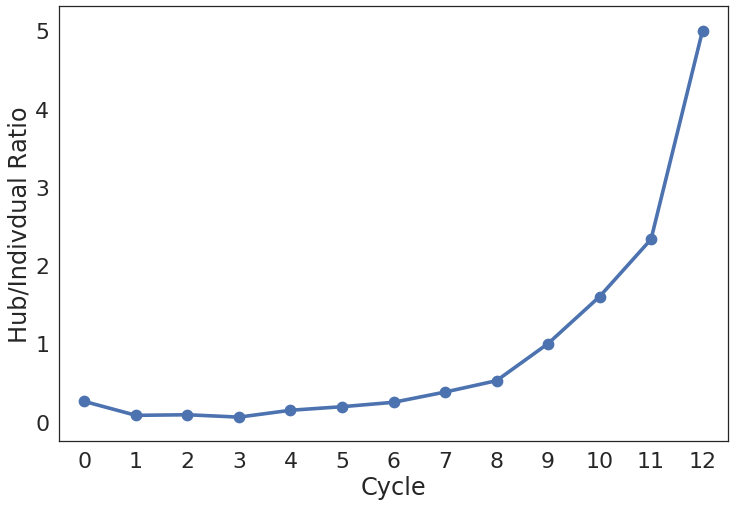

<Figure size 432x288 with 0 Axes>

In [51]:
def plot_hub_indivdual_ratio_over_cycles(base_path_artifacts, analyze_cell_stats_flat, cycles, threshold_i=0.5):
    import scipy.stats as stats
    state_matrix = analyze_cell_stats_flat.unstack()['Manual_' + str(threshold_i)].transpose()

    ## frequency_of_roles
    unique_elements, counts_elements = np.unique(state_matrix.values.flatten(), return_counts=True)
    
    ## Frequency mode during time
    state_matrix_pp = state_matrix.transpose().apply(lambda cell_states:                               
                                   np.bincount(cell_states, minlength=len(unique_elements)), 
                               axis=0)

    state_matrix_pp = state_matrix_pp.round(2).apply(lambda cell_states: distribution_cell_states(cell_states), axis=0).round(2)
    
    state_matrix_pp_t = state_matrix_pp.transpose()
    
    state_matrix_pp_t = state_matrix_pp_t.rename(columns={0: transle_role(0), 
                                                          1: transle_role(1), 
                                                          2: transle_role(2),
                                                          3: transle_role(3),
                                                          4: transle_role(4)})
    
    state_matrix_pp_t['Cycle'] = state_matrix_pp_t.index.astype(int)
    
    state_matrix_pp_t['Hub/Indivdual Ratio'] = state_matrix_pp_t['Hub'] / state_matrix_pp_t['Individual']
    
    #plot roles
    state_matrix_pp_t_melt = pd.melt(state_matrix_pp_t, id_vars=['Cycle'], value_vars=['Hub/Indivdual Ratio'],
                               var_name='Role', value_name='Hub/Indivdual Ratio')
    
    sns.set(style='white', font_scale = 2, rc={"lines.linewidth": 2})

    fig, ax = plt.subplots(figsize=(12,8))
    ax = sns.pointplot(ax=ax, x='Cycle', y='Hub/Indivdual Ratio', hue='Role' ,data=state_matrix_pp_t_melt[state_matrix_pp_t_melt['Cycle'] < cycles], legend=False)
    
    ax.get_legend().remove()
    fig.savefig(base_path_artifacts + 'roles_hub_individual_ratio_over_time.png')
    fig.savefig(base_path_artifacts + 'roles_hub_individual_ratio_over_time.eps', format='eps')
    plt.show()
    plt.clf()
    plt.close(fig)
    
plot_hub_indivdual_ratio_over_cycles(base_path_artifacts, analyze_cell_stats_flat, 13)

### Check the correlation between the Hub role and the expected

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


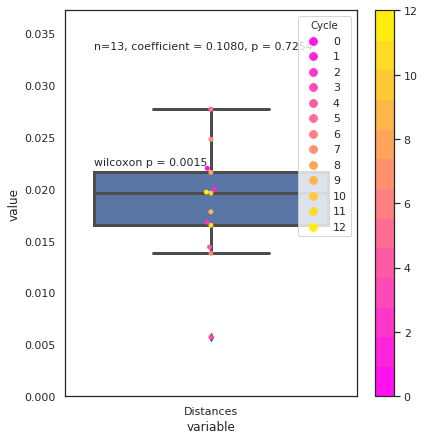

<Figure size 432x288 with 0 Axes>

In [52]:
def plot_roles_dots_over_cycles(base_path_artifacts, analyze_cell_stats_flat, cycles, threshold_i=0.5):
    import scipy.stats as stats
    state_matrix = analyze_cell_stats_flat.unstack()['Manual_' + str(threshold_i)].transpose()

    ## frequency_of_roles
    unique_elements, counts_elements = np.unique(state_matrix.values.flatten(), return_counts=True)
    
    ## Frequency mode during time
    state_matrix_pp = state_matrix.transpose().apply(lambda cell_states:                               
                                   np.bincount(cell_states, minlength=len(unique_elements)), 
                               axis=0)

    state_matrix_pp = state_matrix_pp.round(2).apply(lambda cell_states: distribution_cell_states(cell_states), axis=0).round(2)
    
    state_matrix_pp_t = state_matrix_pp.transpose()
    
    state_matrix_pp_t = state_matrix_pp_t.rename(columns={0: transle_role(0), 
                                                          1: transle_role(1), 
                                                          2: transle_role(2),
                                                          3: transle_role(3),
                                                          4: transle_role(4)})
    
    state_matrix_pp_t['Cycle'] = state_matrix_pp_t.index.astype(int)
    
    #plot roles
    state_matrix_pp_t_melt = pd.melt(state_matrix_pp_t, id_vars=['Cycle'], value_vars=['Hub', 'Individual', 'Follower', 'Leader', 'Normal'],
                               var_name='Role', value_name='Portion')
    
    #plot p(leader) * p(follower) vs p(hub)    
    state_matrix_pp_t['P(Leader+Hub)*P(Follower+Hub)'] = (state_matrix_pp_t['Follower'] + state_matrix_pp_t['Hub'])*(state_matrix_pp_t['Leader']+state_matrix_pp_t['Hub'])
    
    state_matrix_pp_t['Distances'] = state_matrix_pp_t['Hub'] - state_matrix_pp_t['P(Leader+Hub)*P(Follower+Hub)']
    
    state_matrix_pp_t = state_matrix_pp_t[state_matrix_pp_t['Cycle'] < cycles]
    
    from scipy.stats import wilcoxon
    
    
    sns.set(style='white', font_scale = 1, rc={"lines.linewidth": 3})
    
    distances_melt = pd.melt(state_matrix_pp_t[['Distances']])
    distances_melt['Cycle'] = distances_melt.index
    
    from matplotlib.colors import ListedColormap
    
    color_pattle = sns.color_palette('spring', state_matrix_pp_t.shape[0])
    my_color_bar = ListedColormap(color_pattle)

    fig, ax = plt.subplots(figsize=(6,6))
    ax = sns.swarmplot(ax=ax, x='variable', y='value', data=distances_melt, hue='Cycle', palette=color_pattle)
    ax = sns.boxplot(ax=ax, x='variable', y='value', data=distances_melt)
    
    #ticks_range = np.arange(0.0, 0.5, step=0.1)
    
    ax.set(ylim=(0.0))
    
    data_correlation = stats.pearsonr(x=state_matrix_pp_t['Cycle'], 
                                  y=state_matrix_pp_t['Distances'])

    ax.annotate("n={}, coefficient = {:.4f}, p = {:.4f}".format(len(state_matrix_pp_t),
                data_correlation[0], data_correlation[1]), 
                xy=(.1, .9), xycoords=ax.transAxes, fontsize=11)
    
    ax.annotate("wilcoxon p = {:.4f}".format(wilcoxon(state_matrix_pp_t['Distances'])[1]),    
                xy=(.1, .6), xycoords=ax.transAxes, fontsize=11)
    
    plt.tight_layout(pad=0.4, w_pad=2, h_pad=1.0)
    
    import matplotlib as mpl
    
    plt.colorbar(mpl.cm.ScalarMappable(cmap=my_color_bar, norm=matplotlib.colors.Normalize(vmin=0, vmax=12)))

    
    fig.savefig(base_path_artifacts + 'roles_leadership_followership_vs_hub_relative_to_expected_box_plot.png')
    plt.savefig(base_path_artifacts + 'roles_leadership_followership_vs_hub_relative_to_expected_box_plot.eps', format='eps')
    plt.show()
    plt.clf()
    plt.close(fig)

#plot_roles_dots_over_cycles(base_path_artifacts, analyze_cell_stats_flat, 13)
plot_roles_dots_over_cycles(base_path_artifacts, analyze_cell_stats_flat, 13)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


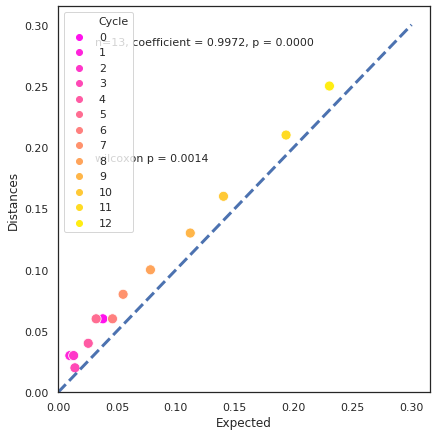

<Figure size 432x288 with 0 Axes>

In [53]:
def rotate(p, origin=(0, 0), degrees=0):
    angle = np.deg2rad(degrees)
    R = np.array([[np.cos(angle), -np.sin(angle)],
                  [np.sin(angle),  np.cos(angle)]])
    o = np.atleast_2d(origin)
    p = np.atleast_2d(p)
    return np.squeeze((R @ (p.T-o.T) + o.T).T)

def convert_series(y, x):
    rotate_x = np.zeros(len(x))
    rotate_y = np.zeros(len(x))
    
    for idx in range(0, len(x)):
        rotate_y[idx], rotate_x[idx] = rotate((y[idx], x[idx]), degrees=45)
    
    return rotate_y, rotate_x

def plot_roles_dots_over_cycles(base_path_artifacts, analyze_cell_stats_flat, cycles, threshold_i=0.5):
    import scipy.stats as stats
    state_matrix = analyze_cell_stats_flat.unstack()['Manual_' + str(threshold_i)].transpose()

    ## frequency_of_roles
    unique_elements, counts_elements = np.unique(state_matrix.values.flatten(), return_counts=True)
    
    ## Frequency mode during time
    state_matrix_pp = state_matrix.transpose().apply(lambda cell_states:                               
                                   np.bincount(cell_states, minlength=len(unique_elements)), 
                               axis=0)

    state_matrix_pp = state_matrix_pp.round(2).apply(lambda cell_states: distribution_cell_states(cell_states), axis=0).round(2)
    
    state_matrix_pp_t = state_matrix_pp.transpose()
    
    state_matrix_pp_t = state_matrix_pp_t.rename(columns={0: transle_role(0), 
                                                          1: transle_role(1), 
                                                          2: transle_role(2),
                                                          3: transle_role(3),
                                                          4: transle_role(4)})
    
    state_matrix_pp_t['Cycle'] = state_matrix_pp_t.index.astype(int)
    
    #plot roles
    state_matrix_pp_t_melt = pd.melt(state_matrix_pp_t, id_vars=['Cycle'], value_vars=['Hub', 'Individual', 'Follower', 'Leader', 'Normal'],
                               var_name='Role', value_name='Portion')
    
    #plot p(leader) * p(follower) vs p(hub)    
    state_matrix_pp_t['P(Leader+Hub)*P(Follower+Hub)'] = (state_matrix_pp_t['Follower'] + state_matrix_pp_t['Hub'])*(state_matrix_pp_t['Leader']+state_matrix_pp_t['Hub'])
    
    state_matrix_pp_t['Distances'], state_matrix_pp_t['Expected'] = state_matrix_pp_t['Hub'], state_matrix_pp_t['P(Leader+Hub)*P(Follower+Hub)']
    
    state_matrix_pp_t = state_matrix_pp_t[state_matrix_pp_t['Cycle'] < cycles]
    
    from scipy.stats import wilcoxon
    
    
    sns.set(style='white', font_scale = 1, rc={"lines.linewidth": 3})

    fig, ax = plt.subplots(figsize=(6,6))
    ax = sns.scatterplot(ax=ax, x='Expected', y='Distances', hue='Cycle', data=state_matrix_pp_t, s=100, palette=sns.color_palette('spring', state_matrix_pp_t.shape[0]))
    
    #ticks_range = np.arange(0.0, 0.5, step=0.1)
    
    #ax.set(xlim=(0.0, 0.4), ylim=(0.0, 0.4), xticks=ticks_range, yticks=ticks_range)
    
    data_correlation = stats.pearsonr(x=state_matrix_pp_t['Expected'], 
                                  y=state_matrix_pp_t['Distances'])
    
    plt.plot(np.arange(0.0, 0.4, step=0.1), np.arange(0.0, 0.4, step=0.1), linestyle='--')

    ax.annotate("n={}, coefficient = {:.4f}, p = {:.4f}".format(len(state_matrix_pp_t),
                data_correlation[0], data_correlation[1]), 
                xy=(.1, .9), xycoords=ax.transAxes, fontsize=11)
    
    ax.annotate("wilcoxon p = {:.4f}".format(wilcoxon(state_matrix_pp_t['Distances'])[1]),      
                xy=(.1, .6), xycoords=ax.transAxes, fontsize=11)
    
    ax.set(xlim=(0.0), ylim=(0.0))
    
    plt.tight_layout(pad=0.4, w_pad=2, h_pad=1.0)

    
    fig.savefig(base_path_artifacts + 'roles_leadership_followership_vs_hub_relative_to_expected.png')
    plt.savefig(base_path_artifacts + 'roles_leadership_followership_vs_hub_relative_to_expected.eps', format='eps')
    plt.show()
    plt.clf()
    plt.close(fig)

#plot_roles_dots_over_cycles(base_path_artifacts, analyze_cell_stats_flat, 13)
plot_roles_dots_over_cycles(base_path_artifacts, analyze_cell_stats_flat, 13)

### Movie - Hubs role proprgation through cycles.

max cycle index:15
max cycle index:15
max cycle index:15
max cycle index:15
max cycle index:15


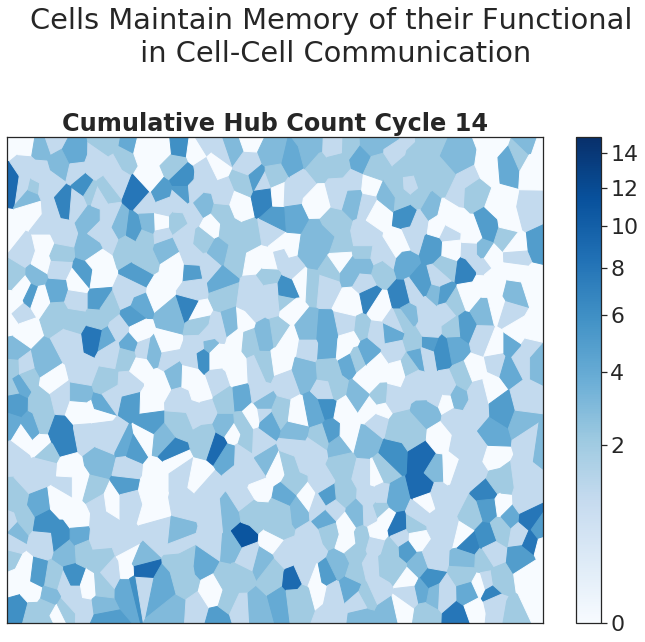

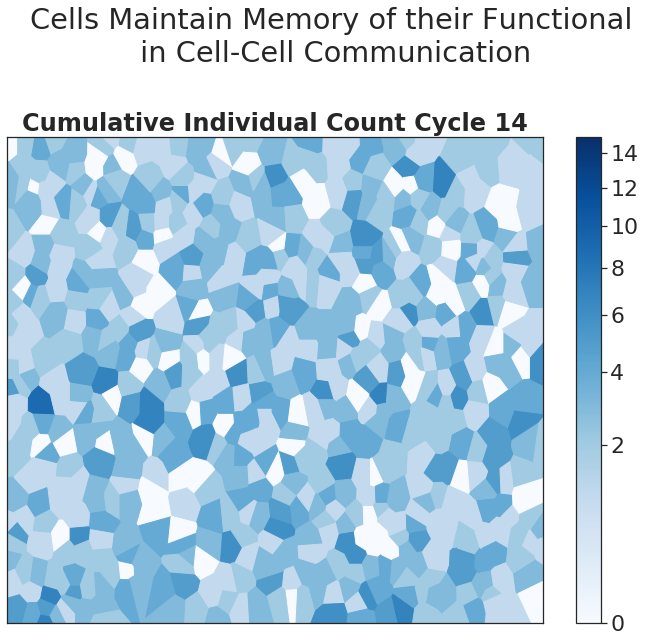

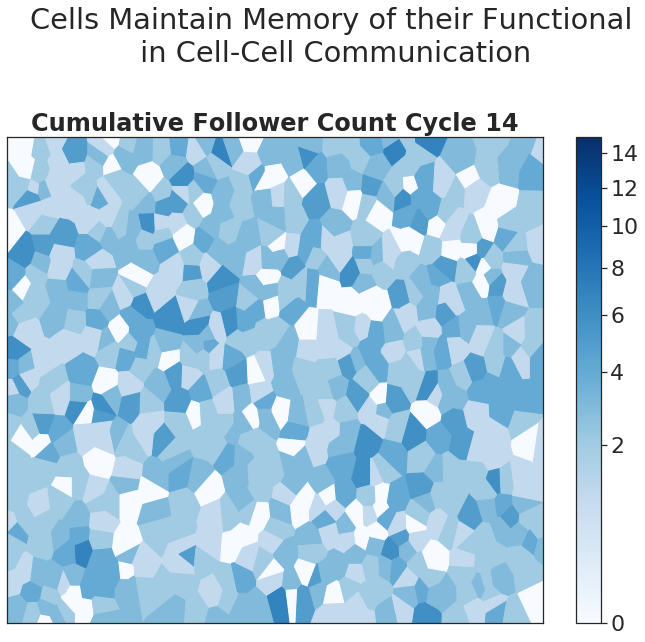

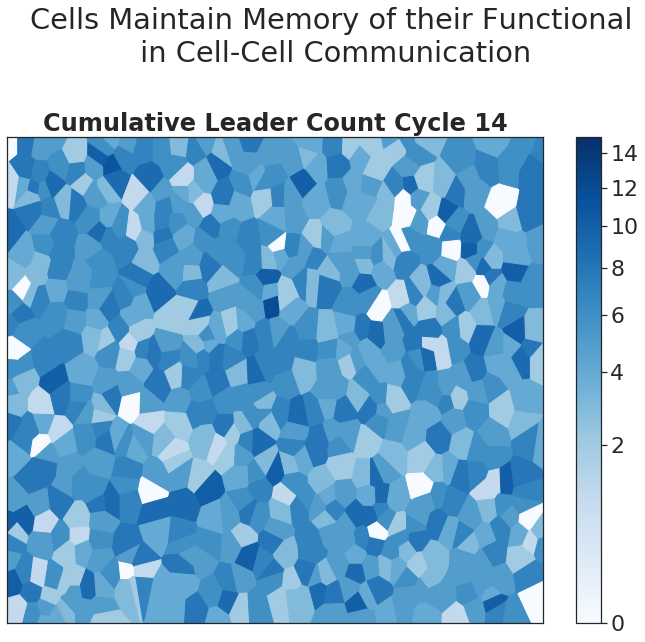

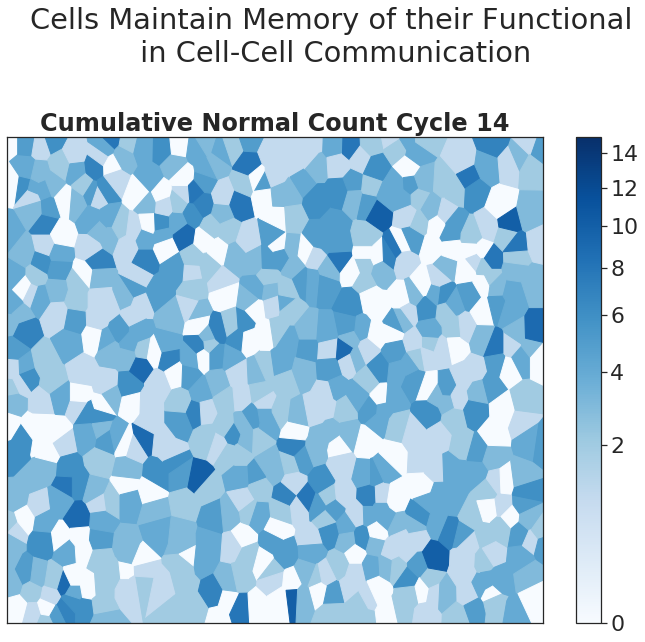

In [54]:
import random
import pylab
from matplotlib.pyplot import pause
import networkx as nx
from matplotlib import animation, rc
from IPython.display import HTML
from plots_analyzetools import plot_voronoi, plot_colormap
import matplotlib as mpl

def create_hub_color_mapper(cmap, max_cycles):
    cnorm =  mpl.colors.PowerNorm(gamma=1./2., vmin=0, vmax=max_cycles)
    mapper = mpl.cm.ScalarMappable(norm=cnorm, cmap=cmap)
    
    return mapper

def make_role_movie(analyze_cell_stats_flat, role_index, metric_name, base_path_artifacts, colormap=mpl.cm.Blues, threshold_i=0.5):
    max_cycles = (len(list(indexes)) - 2)
    # Build plot
    fig, axs = plt.subplots(figsize=(12,10), nrows=1, ncols=1)
    
    cells_roles = analyze_cell_stats_flat.unstack()['Manual_' + str(threshold_i)]
    plt.suptitle('Cells Maintain Memory of their Functional\n in Cell-Cell Communication')
    plt.subplots_adjust(top=0.80)
    mapper = create_hub_color_mapper(colormap, max_cycles)
    plot_colormap(mapper)
    date_index2 = range(1, len(centroids) + 1)
    cells_roles = cells_roles.reindex(date_index2, fill_value = -1)
    print('max cycle index:' + str(max_cycles))
    
    def init():
        #do nothing
        pass

    def update(part):       
        
        cells_roles.iloc[:, part] = np.where(cells_roles.iloc[:, part] == role_index, 1, 0)
        
        if part > 0:
            cells_roles.iloc[:, part] = cells_roles.iloc[:, part - 1] + cells_roles.iloc[:, part]
        
        data = cells_roles.iloc[:, part]
        data = data.values
        
        #data = apply_custom_filter(data, kpss_and_adf_filter)
        #custom_filter = np.greater(data, np.zeros((len(data))))
        custom_filter = data != 0
        
        axs.set_facecolor('w')
        
        plot_voronoi(axs, mapper, regions, vertices, vor, centroids, 
                         data,
                         custom_filter)

        # Scale plot ax
        axs.set_title(metric_name + " Cycle %d"%(part), fontweight="bold")
        axs.set_xticks([])
        axs.set_yticks([])
        
        #plot_correlation(axs[0], part)

    anim = animation.FuncAnimation(fig, update, frames=max_cycles, interval=500, repeat=True, init_func=init)
    
    anim.save(base_path_artifacts + metric_name + '_cells_memory.mp4')

    return None #HTML(anim.to_html5_video())

def plot_hub_movies(analyze_cell_stats_flat, base_path_artifacts):
    sns.set(style='white', font_scale = 2, rc={"lines.linewidth": 4})

    make_role_movie(analyze_cell_stats_flat, 0, 'Cumulative Hub Count', base_path_artifacts)
    
    make_role_movie(analyze_cell_stats_flat, 1, 'Cumulative Individual Count', base_path_artifacts)
    
    make_role_movie(analyze_cell_stats_flat, 2, 'Cumulative Follower Count', base_path_artifacts)
    
    make_role_movie(analyze_cell_stats_flat, 3, 'Cumulative Leader Count', base_path_artifacts)
    
    make_role_movie(analyze_cell_stats_flat, 4, 'Cumulative Normal Count', base_path_artifacts)

    sns.set()

movie1 = plot_hub_movies(analyze_cell_stats_flat, base_path_artifacts)

max cycle index:15
max cycle index:15
max cycle index:15
max cycle index:15
max cycle index:15


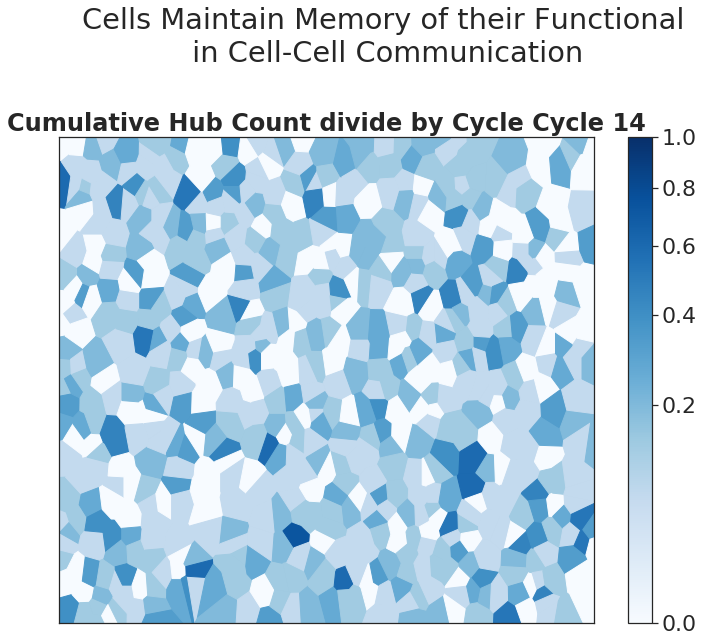

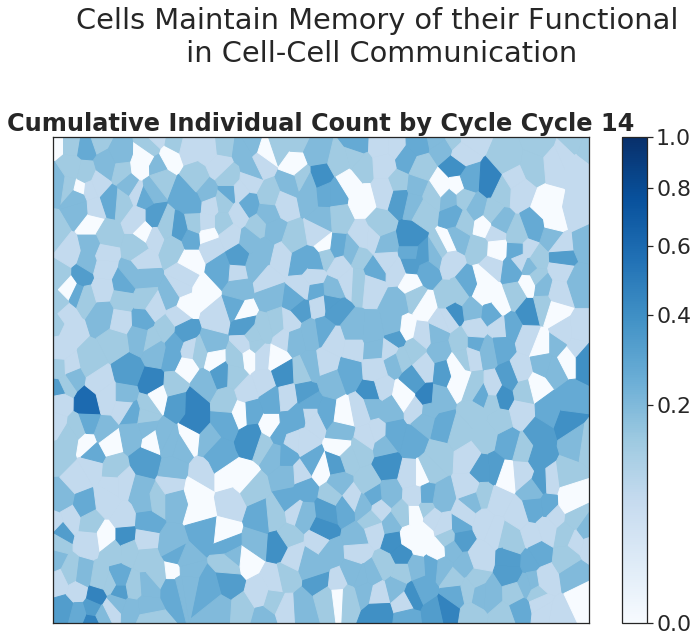

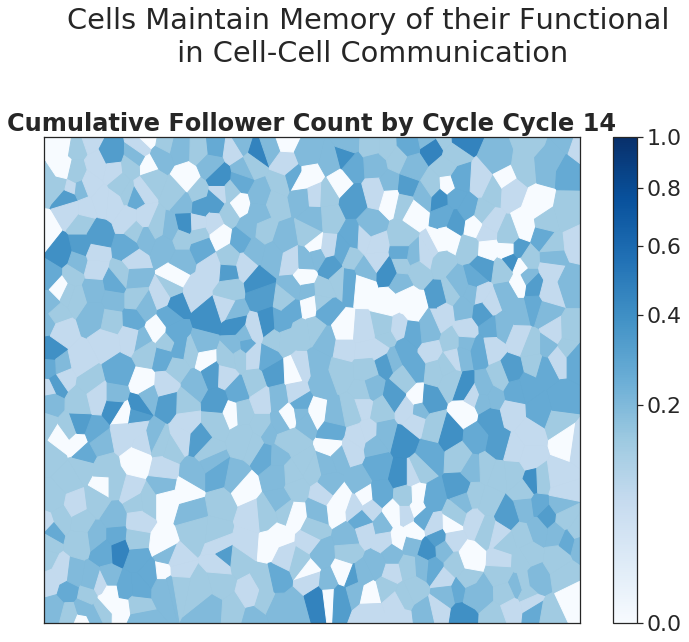

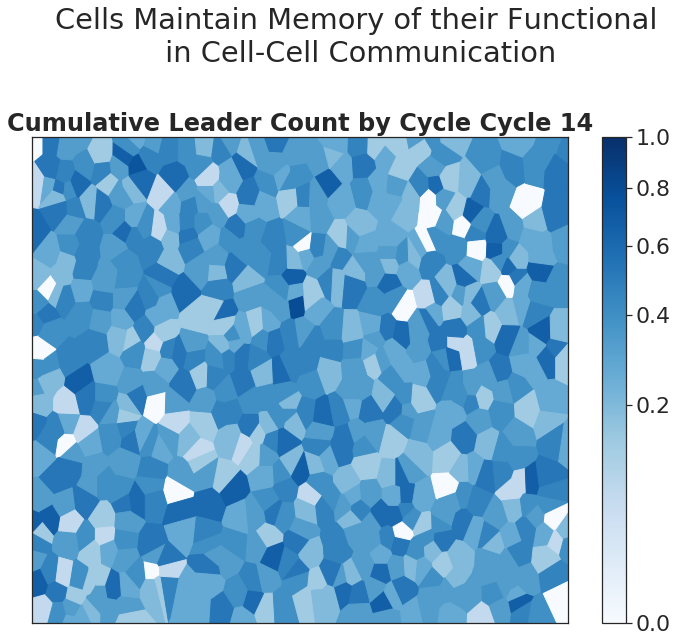

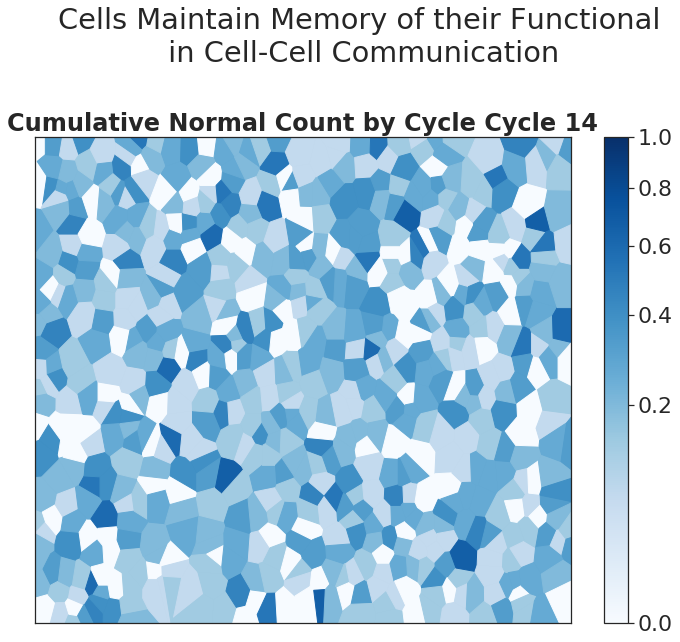

In [55]:
import random
import pylab
from matplotlib.pyplot import pause
import networkx as nx
from matplotlib import animation, rc
from IPython.display import HTML
from plots_analyzetools import plot_voronoi, plot_colormap
import matplotlib as mpl

def create_hub_color_mapper(cmap):
    cnorm =  mpl.colors.PowerNorm(gamma=1./2., vmin=0, vmax=1)
    mapper = mpl.cm.ScalarMappable(norm=cnorm, cmap=cmap)
    
    return mapper

def make_role_movie(analyze_cell_stats_flat, role_index, metric_name, base_path_artifacts, colormap=mpl.cm.Blues, threshold_i=0.5):
    max_cycles = (len(list(indexes)) - 2)
    # Build plot
    fig, axs = plt.subplots(figsize=(12,10), nrows=1, ncols=1)
    
    cells_roles = analyze_cell_stats_flat.unstack()['Manual_' + str(threshold_i)]
    plt.suptitle('Cells Maintain Memory of their Functional\n in Cell-Cell Communication')
    plt.subplots_adjust(top=0.80)
    mapper = create_hub_color_mapper(colormap)
    plot_colormap(mapper)
    date_index2 = range(1, len(centroids) + 1)
    cells_roles = cells_roles.reindex(date_index2, fill_value = -1)
    print('max cycle index:' + str(max_cycles))
    
    def init():
        #do nothing
        pass

    def update(part):    
        
        cells_roles.iloc[:, part] = np.where(cells_roles.iloc[:, part] == role_index, 1, 0)
        
        if part > 0:
            cells_roles.iloc[:, part] = cells_roles.iloc[:, part - 1] + cells_roles.iloc[:, part]
        
        data = cells_roles.iloc[:, part]
        data = data.values / (part + 1)
        
        #data = apply_custom_filter(data, kpss_and_adf_filter)
        #custom_filter = np.greater(data, np.zeros((len(data))))
        custom_filter = data != 0
        
        axs.set_facecolor('w')
        
        plot_voronoi(axs, mapper, regions, vertices, vor, centroids, 
                         data,
                         custom_filter)

        # Scale plot ax
        axs.set_title(metric_name + " Cycle %d"%(part), fontweight="bold")
        axs.set_xticks([])
        axs.set_yticks([])
        
        #plot_correlation(axs[0], part)

    anim = animation.FuncAnimation(fig, update, frames=max_cycles, interval=500, repeat=True, init_func=init)
    
    anim.save(base_path_artifacts + metric_name + '_cells_memory.mp4')

    return None #HTML(anim.to_html5_video())

def plot_hub_movies(analyze_cell_stats_flat, base_path_artifacts):
    sns.set(style='white', font_scale = 2, rc={"lines.linewidth": 4})

    make_role_movie(analyze_cell_stats_flat, 0, 'Cumulative Hub Count divide by Cycle', base_path_artifacts)
    
    make_role_movie(analyze_cell_stats_flat, 1, 'Cumulative Individual Count by Cycle', base_path_artifacts)
    
    make_role_movie(analyze_cell_stats_flat, 2, 'Cumulative Follower Count by Cycle', base_path_artifacts)
    
    make_role_movie(analyze_cell_stats_flat, 3, 'Cumulative Leader Count by Cycle', base_path_artifacts)
    
    make_role_movie(analyze_cell_stats_flat, 4, 'Cumulative Normal Count by Cycle', base_path_artifacts)

    sns.set()

movie1 = plot_hub_movies(analyze_cell_stats_flat, base_path_artifacts)

## Earth Mover Distance

In [56]:
from pyemd import emd
from sklearn.metrics.pairwise import euclidean_distances

idx = pd.IndexSlice

def mean_array(arr):
    result = np.zeros(len(arr) - 1)
    for min_idx in range(0, len(arr) - 1, 1):
        result[min_idx] = np.mean(arr[min_idx:min_idx + 2])
    
    return result

def calc_distance_between_grid(pix, piy):
    X, Y = np.meshgrid(pix, piy)        
    # Compute pariwise distances between points on 2D grid so we know
    # how to score the Wasserstein distance
    coords = np.array([X.flatten(), Y.flatten()]).T    
    coordsSqr = np.sum(coords**2, 1)
    M = coordsSqr[:, None] + coordsSqr[None, :] - 2*coords.dot(coords.T)
    M[M < 0] = 0
    M = np.sqrt(M)
    
    return M

def calc_earth_mover_scores(df, cycles, step=3):
    result = pd.DataFrame(columns=['Distance'])
    bins = np.linspace(-4, 4, 20)
    
    for cycle_index in range(0, cycles-step, 1):
        H_i, xedges_i, yedges_i = np.histogram2d(df.loc[idx[:, [cycle_index, cycle_index]], ['gc_in']].values.flatten(), 
                                    df.loc[idx[:, [cycle_index, cycle_index]], ['gc_out']].values.flatten(), bins=bins)        
        
        H_j, xedges_j, yedges_j = np.histogram2d(df.loc[idx[:, [cycle_index + step, cycle_index + step]], ['gc_in']].values.flatten(), 
                                    df.loc[idx[:, [cycle_index + step, cycle_index + step]], ['gc_out']].values.flatten(), bins=bins)
                
        distance_matrix = calc_distance_between_grid(mean_array(xedges_i), mean_array(yedges_i))
    
        result.loc[cycle_index] = emd(H_i.flatten(), H_j.flatten(), distance_matrix)    
        
    return result

def plot_emd(base_path_artifacts, transformed_norm_df, analyze_cell_stats_flat, cycles):
    #sns.set_style("whitegrid", {'axes.grid' : False, 'font_scale': 2})
    sns.set(style='white', font_scale = 2, rc={"lines.linewidth": 3})
    
    fig = plt.figure(figsize=(10,6))

    ax = sns.lineplot(data = calc_earth_mover_scores(
                        pd.DataFrame(transformed_norm_df, 
                                  index=analyze_cell_stats_flat.index, 
                                  columns=analyze_cell_stats_flat[['gc_in','gc_out']].columns), cycles), 
                 marker="o", lw=3, label="EMD")
    ax.set_xlabel("cycle [t, t+3]")
    ax.set_ylabel("Distance")
    #ax.tick_params(labelsize=20)
    ax.set_xlim(0)
    plt.xticks(np.arange(0, 13-3, 1)) 
    ax.get_legend().remove()
    
    fig.savefig(base_path_artifacts + 'emd_over_time.png')
    fig.savefig(base_path_artifacts + 'emd_over_time.eps', format='eps')
    plt.show()
    plt.clf()
    plt.close(fig)
    
plot_emd(base_path_artifacts, transformed_norm_df, analyze_cell_stats_flat, 13)

ModuleNotFoundError: No module named 'pyemd'

## Cross-Correaltion of nehibours cells over the cycles vs permutaiton tests (cycles)

In [ ]:
from modulev2.analyze_cc import analyze_network_cc
from scipy.spatial import Delaunay
from module.topologicalhelper import find_neighbors

location_matlab_file = scipy.io.loadmat(location_filename)
original_centroids_loc = location_matlab_file['centroids']

def calc_mean_cc(base_path, cells_response_curve_parts, distance=2):
    cells_response_curve_parts_perm = {k: v for k, v in cells_response_curve_parts.items() if k < len(cells_response_curve_parts)}
    
    '''permuate centroids'''
    np.random.seed()
    perm_rows = np.random.permutation(range(0, original_centroids_loc.shape[0]))
    centroids_perm = original_centroids_loc[perm_rows, :]
    tri = Delaunay(centroids_perm)
    #print(centroids_perm)
    
    neighbor_indices_perm = find_neighbors(tri, centroids_perm)
    
    no_filter = np.full(len(neighbor_indices_perm), True)
    
    analyze_result_cc_df = None
    
    #analyze_result_cc_df = load_object(base_path + 'analyze_result_cc_df_' + str(distance))
    
    if analyze_result_cc_df is None:
        analyze_result_cc_df = analyze_network_cc(neighbor_indices_perm, cells_response_curve_parts_perm, no_filter, distance)
        
        #save_object(analyze_result_cc_df, base_path + 'analyze_result_cc_df_' + str(distance))
    
    analyze_cell_stats_cc_out = analyze_result_cc_df.groupby(['source', 'part']).agg('mean').unstack().loc[:, ['cross_correlation']].rename(columns={'cross_correlation':'cc_out'})
    analyze_cell_stats_cc_in = analyze_result_cc_df.groupby(['destination', 'part']).agg('mean').unstack().loc[:, ['cross_correlation']].rename(columns={'cross_correlation':'cc_in'})

    analyze_cell_stats_cc_df = pd.concat([analyze_cell_stats_cc_in, analyze_cell_stats_cc_out], axis=1, sort=False)
    analyze_cell_stats_cc_df = analyze_cell_stats_cc_df.fillna(0)
    
    return analyze_cell_stats_cc_df.loc[:, ['cc_out']].mean()

perm_cc = pd.DataFrame(columns=range(0, len(cells_response_curve_parts)))

for i in tqdm(range(0, 10)):
    result = calc_mean_cc(base_path, cells_response_curve_parts)
    perm_cc.loc[len(perm_cc), :] = result.values

In [ ]:
from scipy.spatial import Delaunay
from module.topologicalhelper import find_neighbors

location_matlab_file = scipy.io.loadmat(location_filename)
centroids = location_matlab_file['centroids']
tri = Delaunay(centroids)
neighbor_indices = find_neighbors(tri, centroids)


In [ ]:
def calc_original_cc(base_path, cells_response_curve_parts, distance=2):
    no_filter = np.full(len(neighbor_indices), True)
    
    analyze_result_cc_df = analyze_network_cc(neighbor_indices, cells_response_curve_parts, no_filter, distance)
        
        #save_object(analyze_result_cc_df, base_path + 'analyze_result_cc_df_' + str(distance))
    
    analyze_cell_stats_cc_out = analyze_result_cc_df.groupby(['source', 'part']).agg('mean').unstack().loc[:, ['cross_correlation']].rename(columns={'cross_correlation':'cc_out'})
    analyze_cell_stats_cc_in = analyze_result_cc_df.groupby(['destination', 'part']).agg('mean').unstack().loc[:, ['cross_correlation']].rename(columns={'cross_correlation':'cc_in'})

    analyze_cell_stats_cc_df = pd.concat([analyze_cell_stats_cc_in, analyze_cell_stats_cc_out], axis=1, sort=False)
    analyze_cell_stats_cc_df = analyze_cell_stats_cc_df.fillna(0)
    
    return analyze_cell_stats_cc_df.loc[:, ['cc_out']].mean()

original_result_cc_df = calc_original_cc(base_path, cells_response_curve_parts)
original_result_cc_df = pd.DataFrame(pd.DataFrame(original_result_cc_df[:len(cells_response_curve_parts)]).transpose().values, columns=list(perm_cc.columns))

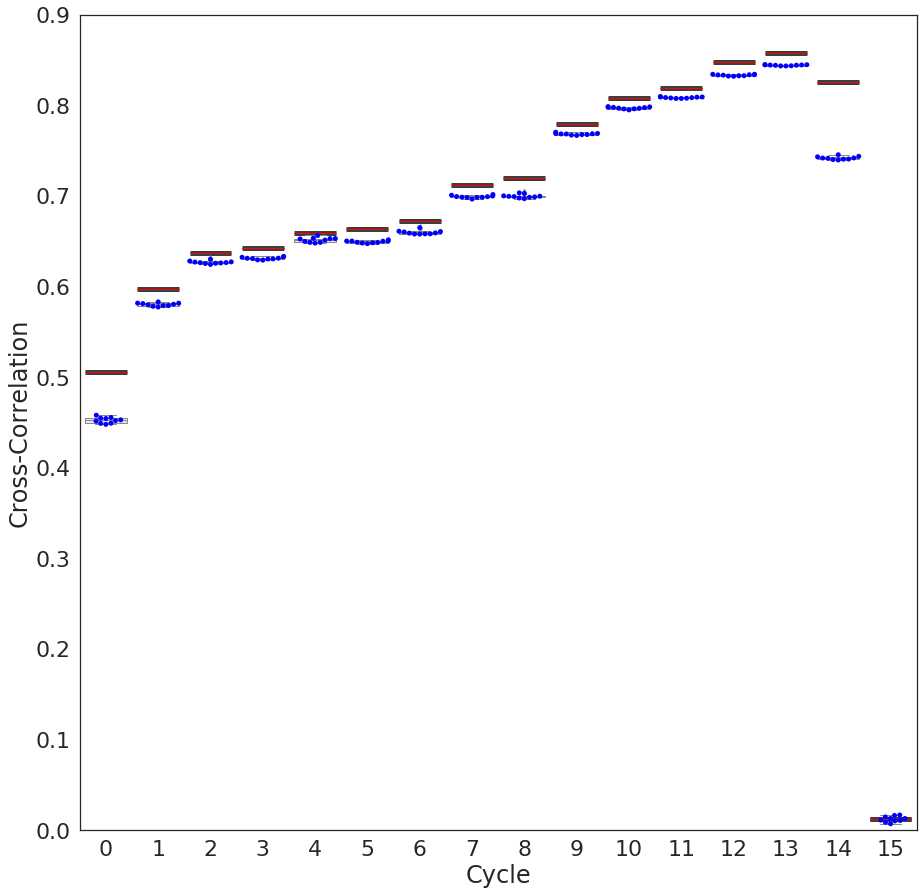

In [ ]:
import seaborn as sns

sns.set(style='white', font_scale = 2, rc={"lines.linewidth": 1})
fig, ax = plt.subplots(figsize=(15,15))

#plot_scatter_color(center_tr_re_1d_homogeneity_scores, x_feature_name='number of experiment', y_feature_name='vs_delta_std_p', save=False)
sns.swarmplot(x='variable', y='value', data=pd.melt(perm_cc), color='blue', ax=ax)
sns.boxplot(x='variable', y='value', data=pd.melt(perm_cc), color='0.9', ax=ax)

sns.boxplot(x='variable', y='value', data=pd.melt(original_result_cc_df), 
                 showcaps=False,boxprops={'facecolor':'None', 'linewidth':5},
                 showfliers=False,whiskerprops={'linewidth':0}, palette="Paired", medianprops={'color':'red'}, ax=ax)

ax.set(xlabel='Cycle', ylabel='Cross-Correlation')

ax.set(ylim=[0, 0.9])

fig.savefig(base_path_artifacts + '_' + 'cc_permutation_test_result_all' + '.eps', format='eps')

## Estrda Index (heterogeneous)

In [57]:
from pathos.multiprocessing import ProcessingPool as Pool

import pathos.multiprocessing as mp
print(mp.__STATE)

{}


In [58]:
from tqdm.notebook import tqdm
import pandas as pd
import numpy as np
import random

def estrada_index(analyze_result_df):
    total = 0
    nodes_degrees = pd.concat([analyze_result_df.groupby(['source', 'part']).agg('sum').unstack().loc[:, ['significant']].rename(columns={'significant':'gc_out'}),
                    analyze_result_df.groupby(['destination', 'part']).agg('sum').unstack().loc[:, ['significant']].rename(columns={'significant':'gc_in'})], axis=1)
    n = nodes_degrees.shape[0]    

    for idx, row in analyze_result_df.iterrows():
        if row['significant'] != 1:
            continue
        
        v1 = nodes_degrees.loc[row['source']].sum()**(-0.5)
        v2 = nodes_degrees.loc[row['destination']].sum()**(-0.5)
        total += (v1 - v2)**2

    total /= (n - 2*((n - 1)**0.5))

    return total

def create_random_edges(gc_prob, length):
    list_of_random_0_1 = int(np.round(length*gc_prob))*'1' + int(np.round(length*(1-gc_prob)))*'0'
    list_of_random_0_1 = list(map(int, list_of_random_0_1))
    random.shuffle(list_of_random_0_1)
    return list_of_random_0_1

def estrada_index_perm_test(analyze_result_df, n=1000):
    perm_counter = 0    

    analyze_result_df_random = analyze_result_df.copy()

    estrada_idx_score = estrada_index(analyze_result_df)

    gc_prob = analyze_result_df['significant'].sum()/analyze_result_df['significant'].count()
    
    records = np.zeros((n), dtype='float')

    for i in range(0, n):
        analyze_result_df_random['significant'] = create_random_edges(gc_prob, analyze_result_df.shape[0])    
        random_estrada_idx_score = estrada_index(analyze_result_df_random)

        if estrada_idx_score < random_estrada_idx_score:
            perm_counter += 1
        
        records[i] = random_estrada_idx_score

    return perm_counter/n, records

estrada_index_results = pd.DataFrame(columns=['est_idx_p_value', 'est_idx'])
estrada_index_records = pd.DataFrame()

def calc_cycle(cycle, cycle_analyze_results_df):
    estrada_index_result = estrada_index(cycle_analyze_results_df)
    estrada_index_perm_test_result, records = estrada_index_perm_test(cycle_analyze_results_df)

    return estrada_index_perm_test_result, estrada_index_result, records, cycle

with Pool() as pool:
    print(pool.ncpus)
    total = len(cells_response_curve_parts)
    df_list = [analyze_result_df[analyze_result_df.part == cycle] for cycle in range(total)]    
    for results in tqdm(pool.imap(calc_cycle, range(total), df_list), total=total):
        estrada_index_results.loc[results[3]] = (results[0], results[1])
        estrada_index_records[results[3]] =  results[2]        
    
estrada_index_records

16


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,0.039653,0.052733,0.056946,0.055199,0.047021,0.046529,0.042557,0.038711,0.035820,0.030959,0.028609,0.029116,0.026903,0.022388,0.018391,0.043709
1,0.047422,0.049269,0.052631,0.049432,0.049370,0.042376,0.043732,0.035940,0.035883,0.036023,0.029455,0.026982,0.025387,0.022322,0.017185,0.045410
2,0.042521,0.052350,0.053873,0.065045,0.045945,0.043758,0.041659,0.034129,0.035841,0.026854,0.029213,0.026350,0.026064,0.020559,0.019700,0.039633
3,0.044655,0.051156,0.053299,0.052304,0.047655,0.048926,0.043076,0.038221,0.039925,0.030816,0.028949,0.026086,0.021480,0.021790,0.016585,0.045060
4,0.038627,0.057004,0.062762,0.057438,0.051762,0.046361,0.041411,0.036543,0.033702,0.030395,0.029380,0.025329,0.024526,0.025382,0.016018,0.049409
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.043943,0.052076,0.055142,0.048366,0.046090,0.046800,0.042925,0.039309,0.035049,0.031926,0.028489,0.025203,0.023548,0.025487,0.020218,0.041313
996,0.036725,0.053793,0.048386,0.047404,0.046117,0.046801,0.045616,0.039054,0.034112,0.030178,0.028757,0.025835,0.022229,0.024400,0.017499,0.044053
997,0.045339,0.059300,0.053271,0.048228,0.045955,0.045434,0.038173,0.039901,0.034360,0.030157,0.024290,0.026016,0.025237,0.023295,0.017966,0.044461
998,0.039341,0.053634,0.054831,0.052467,0.047266,0.046589,0.042029,0.037586,0.033071,0.031516,0.026332,0.024922,0.026668,0.023151,0.018005,0.044825


In [60]:
from tqdm.notebook import tqdm

def estrada_index(analyze_result_df):
    total = 0
    nodes_degrees = pd.concat([analyze_result_df.groupby(['source', 'part']).agg('sum').unstack().loc[:, ['significant']].rename(columns={'significant':'gc_out'}),
                    analyze_result_df.groupby(['destination', 'part']).agg('sum').unstack().loc[:, ['significant']].rename(columns={'significant':'gc_in'})], axis=1)
    n = nodes_degrees.shape[0]    

    for idx, row in analyze_result_df.iterrows():
        if row['significant'] != 1:
            continue
        
        v1 = nodes_degrees.loc[row['source']].sum()**(-0.5)
        v2 = nodes_degrees.loc[row['destination']].sum()**(-0.5)
        total += (v1 - v2)**2

    total /= (n - 2*((n - 1)**0.5))

    return total
    
def select_edges(df: pd.DataFrame):
    first_edge_idx = random.choice(df[df['significant'] == 1].index)
    first_edge_row = df.loc[first_edge_idx]
    first_edge = (first_edge_row['source'], first_edge_row['destination'])
    filter_first_edge_nodes = df[(df['source'] != first_edge[0]) & (df['destination'] != first_edge[1])]

    while True:    
        sec_edge_idx = random.choice(filter_first_edge_nodes[(filter_first_edge_nodes['significant'] == 1)].index)
        sec_edge_row = df.loc[sec_edge_idx]
        sec_edge = (sec_edge_row['source'], sec_edge_row['destination'])

        # check that there is no crossing edges
        if len(df[(df['source'] == first_edge[0]) & (df['destination'] == sec_edge[1])]) > 0:
            if (df[(df['source'] == first_edge[0]) & (df['destination'] == sec_edge[1])]['significant'] == 1).all():                
                continue
        
        if len(df[(df['source'] == sec_edge[0]) & (df['destination'] == first_edge[1])]) > 0:
            if (df[(df['source'] == sec_edge[0]) & (df['destination'] == first_edge[1])]['significant'] == 1).all():
                continue
        
        break

    return first_edge, sec_edge, first_edge_idx, sec_edge_idx

def add_edge(df: pd.DataFrame, first_node_idx: int, sec_node_idx: int, part: int):
    if len(df[(df['source'] == first_node_idx) & (df['destination'] == sec_node_idx)]) > 0:
        first_edge_idx = df[(df['source'] == first_node_idx) & (df['destination'] == sec_node_idx)].index        
        assert (df.loc[first_edge_idx, 'significant'] != 1).all()
        df.loc[first_edge_idx, 'significant'] = 1
    else:
        #add new edge
       df = df.append({ 'source': first_node_idx,
                        'destination': sec_node_idx,
                        'part': part,
                        'topological_distance': None,
                        'optimal_lag': None,
                        'granger_causality_mag': None,
                        'granger_causality_pvalue': None,
                        'total_neighbours': None,
                        'critical_value': None,
                        'significant': 1}, ignore_index=True)
    
    return df

def rewire(df: pd.DataFrame, part: int):
    first_edge, sec_edge, first_edge_idx, sec_edge_idx = select_edges(df)
    df.loc[first_edge_idx, 'significant'] = 0
    df.loc[sec_edge_idx, 'significant'] = 0

    df = add_edge(df, first_edge[0], sec_edge[1], part)
    df = add_edge(df, sec_edge[0], first_edge[1], part)
    
    return df

def permute_edges_degree_preservation(df: pd.DataFrame, part: int, repeat_factor: float =10**-6):
    number_of_edges = len(df[df['significant'] == 1])
    total_cycles = int(np.round((number_of_edges/2) * np.log(1/repeat_factor)))
    for round_i in range(0, total_cycles):
        df = rewire(df, part)

    return df

def plot_degree_dist(df: pd.DataFrame):
    df_degree_sum = pd.concat([df.groupby(['source', 'part']).agg('sum').unstack().loc[:, ['significant']].rename(columns={'significant':'gc_out'}),
                               df.groupby(['destination', 'part']).agg('sum').unstack().loc[:, ['significant']].rename(columns={'significant':'gc_in'})], axis=1).sum(axis=1)

    sns.distplot(df_degree_sum)


def estrada_index_degree_preservation_perm_test(analyze_result_df: pd.DataFrame, part: int, n: int=1000):
    perm_counter = 0    

    estrada_idx_score = estrada_index(analyze_result_df)
    
    records = np.zeros((n), dtype='float')

    for i in range(0, n):
        analyze_result_df_random = analyze_result_df.copy(deep=True)

        analyze_result_df_random = permute_edges_degree_preservation(df=analyze_result_df_random, part=part)
        
        random_estrada_idx_score = estrada_index(analyze_result_df_random)

        if estrada_idx_score < random_estrada_idx_score:
            perm_counter += 1
        
        records[i] = random_estrada_idx_score

    return perm_counter/n, records

estrada_index_degree_preservation_results = pd.DataFrame(columns=['est_idx_p_value', 'est_idx'])
estrada_index_degree_preservation_records = pd.DataFrame()

def calc_cycle_degree_preservation(cycle, cycle_analyze_results_df):
    estrada_index_result = estrada_index(cycle_analyze_results_df)
    estrada_index_perm_test_result, records = estrada_index_degree_preservation_perm_test(cycle_analyze_results_df, part=cycle, n=10)

    return estrada_index_perm_test_result, estrada_index_result, records, cycle

pool.clear()
pool.close()

with Pool() as pool:
    print(pool.ncpus)
    total = len(cells_response_curve_parts)
    df_list = [analyze_result_df[analyze_result_df.part == cycle] for cycle in range(total)]
    for results in tqdm(pool.imap(calc_cycle_degree_preservation, range(total), df_list), total=total):
        estrada_index_degree_preservation_results.loc[results[3]] = (results[0], results[1])
        estrada_index_degree_preservation_records[results[3]] =  results[2]

estrada_index_degree_preservation_records

16


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,0.114607,0.132268,0.123318,0.110397,0.110015,0.127289,0.105810,0.113571,0.108956,0.101033,0.089017,0.086236,0.078717,0.078358,0.049113,0.044631
1,0.115475,0.136566,0.119978,0.110828,0.109170,0.129933,0.102271,0.119261,0.108030,0.099302,0.088164,0.084161,0.073754,0.080703,0.049496,0.043143
2,0.115374,0.137600,0.117865,0.112521,0.109892,0.126801,0.103220,0.117865,0.105771,0.099011,0.089453,0.085877,0.076791,0.077301,0.050110,0.043479
3,0.115122,0.131797,0.123420,0.109704,0.112582,0.134469,0.097588,0.118602,0.107720,0.101158,0.088253,0.084239,0.078593,0.079371,0.049828,0.051046
4,0.115094,0.135098,0.119756,0.107898,0.107420,0.130774,0.106527,0.116364,0.107640,0.104770,0.087764,0.086453,0.075773,0.080418,0.049267,0.045259
5,0.117041,0.134517,0.127357,0.107043,0.110971,0.131104,0.103151,0.121260,0.107360,0.099845,0.087899,0.084942,0.076972,0.079736,0.050045,0.044349
6,0.114713,0.132470,0.118356,0.107824,0.109137,0.136384,0.100969,0.116382,0.107564,0.100719,0.087064,0.085001,0.076438,0.078450,0.050208,0.043745
7,0.115633,0.131811,0.123234,0.108307,0.110748,0.129238,0.101855,0.115758,0.108345,0.100474,0.088357,0.082356,0.077432,0.080082,0.050635,0.044591
8,0.108106,0.134792,0.119535,0.110751,0.110812,0.130830,0.102140,0.118225,0.110594,0.099957,0.087846,0.086788,0.075662,0.081151,0.050275,0.045464
9,0.119266,0.140594,0.123097,0.111726,0.114241,0.127998,0.098922,0.115340,0.110502,0.099296,0.088171,0.082586,0.075332,0.079972,0.050137,0.047712


In [ ]:
estrada_index_results

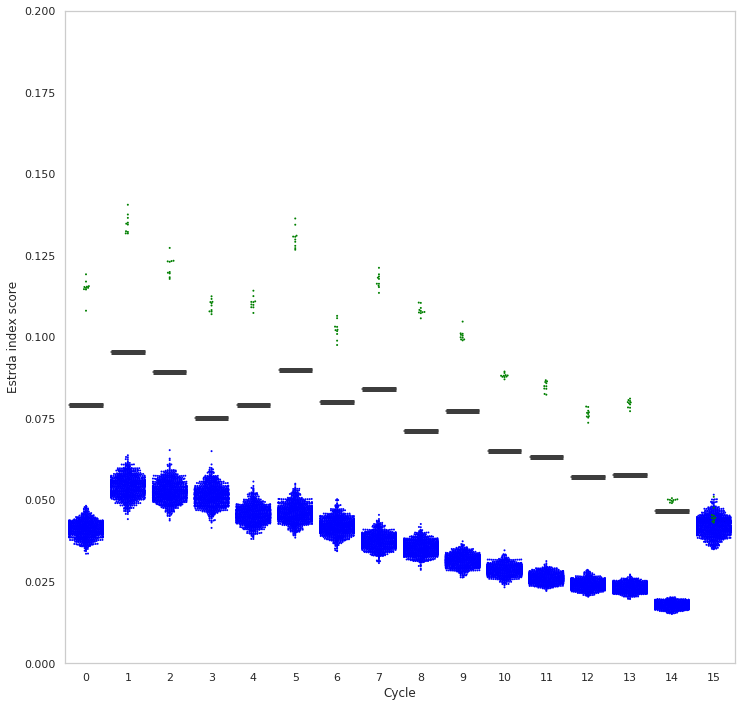

In [66]:
#step_stress_statistics_df['hub_indv_perm_scores']

#sns.boxplot(x="distance", y="method", data=planets,
#            whis=[0, 100],)

# Add in points to show each observation
sns.set_style("whitegrid", {'axes.grid' : False, 'font_scale': 2})

fig, ax=plt.subplots(figsize=(12,12))

chart = sns.swarmplot(data=estrada_index_records,
              size=2, linewidth=0, color="Blue")

chart = sns.swarmplot(data=estrada_index_degree_preservation_records,
              size=2, color="Green", linewidth=0)

#chart.set_xticklabels(chart.get_xticklabels(), rotation=90)

sns.boxplot(x=estrada_index_results['est_idx'].index, y=estrada_index_results['est_idx'].values,
             showcaps=False,boxprops={'facecolor':'None', 'linewidth':5},
             showfliers=False,whiskerprops={'linewidth':0}, ax=chart, palette="Paired")

chart.set(xlabel='Cycle', ylabel='Estrda index score')

ax.set(ylim=[0, 0.20])

#fig.savefig(images_eps_base_path + '_' + 'hub_individual_ratio_perm_test' + '.eps', format='eps')

plt.show()